# CREDIT SCORE PREDICTION

## Data Analysis report:


## The type of labels are:


# Task to do:


# Benefits:


# Business Case Analysis:

# Data Exploration Insights – What did we find and what decision did we take?


Bank GoodCredit wants to predict cred score for current credit card customers. 


The cred score will denote a customer’s credit worthiness and help the bank in reducing credit default risk.


# Domain Analysis:


# Importing Necessary Libraries

In [1]:
import datetime as dt
from datetime import datetime
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import os
import mysql.connector
import pandas as pd
import numpy as np
import warnings
warnings.filterwarnings('ignore')

# Building the Connections

In [2]:
connection1=mysql.connector.connect(host = '18.136.157.135',
                                  user='dm_team1',
                                  password='DM!$Team&279@20!',
                                  database='project_banking')

In [3]:
cursor=connection1.cursor()
cursor.execute('show databases')
for i in cursor:
    print(i)

('information_schema',)
('project_banking',)


In [4]:
db_tables=pd.read_sql_query('show tables',connection1)
print(db_tables)

  Tables_in_project_banking
0              Cust_Account
1         Cust_Demographics
2              Cust_Enquiry


# Insights:

In [5]:
pd.set_option('display.max_columns', None)

In [6]:
query = "select * from Cust_Account "
output1=pd.read_sql(query,connection1)
print(output1.shape)
output1

(186329, 21)


,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900,0,,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",,01-Sep-15,01-Jul-14,,,,,
1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,,03-Oct-15,16201,10390,,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000,1400,,3,5603
2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,,30-Sep-15,41028,34420,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,,,,,
3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,,26-Jul-07,31-Jan-09,93473,0,,"""""""1200900600600600300000000000000000000000000...",,01-Jul-07,01-Feb-06,,,,,
4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,,31-May-15,20250,13500,,"""""""000000000000000""""""",,01-May-15,01-Jan-15,,,,,
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,11-Jun-15,1611,25-May-15,10,1,02-May-07,21-Apr-15,,30-Apr-15,24228,24228,,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Apr-15,01-May-12,,,,,
186325,11-Jun-15,1611,25-May-15,10,1,11-Apr-07,22-Jun-09,02-Apr-10,30-Apr-15,19584,0,,"""""""000179146119089058029000XXX""""""",,01-Apr-10,01-Aug-09,,,,3,
186326,11-Jun-15,1611,25-May-15,10,1,20-Nov-06,,12-Apr-12,31-Dec-13,50844,0,,"""""""000XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",,01-Apr-12,01-Dec-10,,,,3,
186327,11-Jun-15,1611,25-May-15,10,1,17-Oct-06,,07-Mar-12,15-Apr-15,35587,0,,"""""""000010000000000000000000000000000XXXXXXXXXX...","""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",01-Mar-12,01-Apr-09,15000,6000,,3,


# Insights:

## Here we got our first table that consist of Customer's account

In [7]:
output1.to_csv('custacco.csv')
df1=pd.read_csv('custacco.csv')
df1

,Unnamed: 0,dt_opened,customer_no,upload_dt,acct_type,owner_indic,opened_dt,last_paymt_dt,closed_dt,reporting_dt,high_credit_amt,cur_balance_amt,amt_past_due,paymenthistory1,paymenthistory2,paymt_str_dt,paymt_end_dt,creditlimit,cashlimit,rateofinterest,paymentfrequency,actualpaymentamount
0,0,10-Nov-15,12265,20-Oct-15,6,1,09-Jun-13,30-Jun-14,05-Jul-14,30-Sep-15,20900.0,0,NaN,"""""""STDSTDSTDXXXXXXXXXXXXXXXSTDXXXXXXXXXXXXXXXS...",NaN,01-Sep-15,01-Jul-14,NaN,NaN,NaN,NaN,NaN
1,1,10-Nov-15,12265,20-Oct-15,10,1,25-May-12,06-Sep-15,NaN,03-Oct-15,16201.0,10390,NaN,"""""""0000000000000000000000000000000000000000000...","""""""000000000000000000000000000XXX0000000000000...",01-Oct-15,01-Nov-12,14000.0,1400.0,NaN,3.0,5603.0
2,2,10-Nov-15,12265,20-Oct-15,10,1,22-Mar-12,31-Aug-15,NaN,30-Sep-15,41028.0,34420,NaN,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Sep-15,01-Oct-12,NaN,NaN,NaN,NaN,NaN
3,3,20-Jul-15,15606,09-Jul-15,10,1,13-Jan-06,NaN,26-Jul-07,31-Jan-09,93473.0,0,NaN,"""""""1200900600600600300000000000000000000000000...",NaN,01-Jul-07,01-Feb-06,NaN,NaN,NaN,NaN,NaN
4,4,20-Jul-15,15606,09-Jul-15,6,1,18-Jan-15,05-May-15,NaN,31-May-15,20250.0,13500,NaN,"""""""000000000000000""""""",NaN,01-May-15,01-Jan-15,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
186324,186324,11-Jun-15,1611,25-May-15,10,1,02-May-07,21-Apr-15,NaN,30-Apr-15,24228.0,24228,NaN,"""""""0000000000000000000000000000000000000000000...","""""""0000000000000000000000000000000000000000000...",01-Apr-15,01-May-12,NaN,NaN,NaN,NaN,NaN
186325,186325,11-Jun-15,1611,25-May-15,10,1,11-Apr-07,22-Jun-09,02-Apr-10,30-Apr-15,19584.0,0,NaN,"""""""000179146119089058029000XXX""""""",NaN,01-Apr-10,01-Aug-09,NaN,NaN,NaN,3.0,NaN
186326,186326,11-Jun-15,1611,25-May-15,10,1,20-Nov-06,NaN,12-Apr-12,31-Dec-13,50844.0,0,NaN,"""""""000XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",NaN,01-Apr-12,01-Dec-10,NaN,NaN,NaN,3.0,NaN
186327,186327,11-Jun-15,1611,25-May-15,10,1,17-Oct-06,NaN,07-Mar-12,15-Apr-15,35587.0,0,NaN,"""""""000010000000000000000000000000000XXXXXXXXXX...","""""""XXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXXX...",01-Mar-12,01-Apr-09,15000.0,6000.0,NaN,3.0,NaN


In [8]:
df1.drop(['Unnamed: 0','actualpaymentamount','paymentfrequency','rateofinterest','cashlimit','creditlimit','paymenthistory1','paymenthistory2','amt_past_due','closed_dt'],axis=1,inplace=True)

In [9]:
df1['dt_opened']=pd.to_datetime(df1['dt_opened'])

In [10]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 186329 entries, 0 to 186328
Data columns (total 12 columns):
 #   Column           Non-Null Count   Dtype         
---  ------           --------------   -----         
 0   dt_opened        186329 non-null  datetime64[ns]
 1   customer_no      186329 non-null  int64         
 2   upload_dt        186329 non-null  object        
 3   acct_type        186329 non-null  int64         
 4   owner_indic      186329 non-null  int64         
 5   opened_dt        185874 non-null  object        
 6   last_paymt_dt    160842 non-null  object        
 7   reporting_dt     186329 non-null  object        
 8   high_credit_amt  177454 non-null  float64       
 9   cur_balance_amt  186329 non-null  int64         
 10  paymt_str_dt     186328 non-null  object        
 11  paymt_end_dt     186328 non-null  object        
dtypes: datetime64[ns](1), float64(1), int64(4), object(6)
memory usage: 17.1+ MB


In [11]:
grouped = df1.groupby('customer_no').agg({
    'high_credit_amt': 'max',
    'cur_balance_amt': 'sum',
    'acct_type'      : 'sum',
    'owner_indic'    : 'sum'
    
}).reset_index()


print(grouped)

       customer_no  high_credit_amt  cur_balance_amt  acct_type  owner_indic
0                1        2528846.0          4714857        121           21
1                2        1000000.0            30754         20            2
2                3         121523.0            17864         10            1
3                4        3000000.0          1845569        257           31
4                5       12662938.0             7973         62            7
...            ...              ...              ...        ...          ...
23891        23892         185000.0           485225         74           13
23892        23893          27314.0            16393         10            1
23893        23894          20500.0             2077         26            3
23894        23895         400000.0           370758         42            9
23895        23896        1150000.0           903562         35            7

[23896 rows x 5 columns]


In [12]:
d=pd.DataFrame(grouped)

In [13]:
query1="select * from Cust_Demographics "
output2=pd.read_sql(query1,connection1)
print(output2.shape)
output2

(23896, 83)


,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650,2,Card Setup,14,500000,,,,Y,IS1,,0,159,4284,4284,,1,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1,2,,Mumbai / Navi Mumbai / Thane,400610,1965,0,Self,Y,2,90000,,,,0,0,0,0,Mumbai,400059,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,,Y,State Bank of India,0,01-Jun-13,17-Jun-16,1,21,,Y,Y,N,,Y,1965-0,21,15,400610,0,2,90000,Nov-00,21,R,,,0000-00-00,0,98332XXXXX,1,N,0
1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760,1,Card Setup,14,1200000,,,,Y,IS1,,0,91,B001,4077,,1,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1,2,,Bengaluru,560042,1969,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,17,,Y,Y,N,,Y,1969-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,99455XXXXX,1,N,0
2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774,1,Card Setup,14,700000,,,,Y,IS1,,0,91,B001,4077,,2,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1,0,,Bengaluru,560042,1966,0,Self,Y,2,1,,,,0,0,0,0,Bangalore,560042,,PAN Card,AFAPNXXXXX,,,N,,0,,17-Jun-16,3,17,,N,Y,N,,Y,1966-0,17,12,560042,0,2,1,Nov-00,17,R,,,0000-00-00,0,98456XXXXX,1,N,0
3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770,1,Card Setup,14,500000,,,,Y,IS1,,0,157,5107,5107,,1,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1,3,,Pune,411001,1988,0,Self,Y,2,100000,,,,0,0,0,0,Pune,411026,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,,Y,HDFC Bank,0,,17-Jun-16,1,21,,Y,Y,N,,Y,1988-0,21,16,411001,0,2,100000,Nov-00,21,R,,,6/15/65,1,98220XXXXX,1,N,0
4,06-May-15,5,30-Apr-15,Insignia,,,3,Card Setup,14,500000,,,,Y,IS1,,0,100,D016,4564,,1,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1,3,,Gurgaon,122009,1995,0,Self,Y,2,300000,,,,0,0,0,0,Gurgaon,122009,,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,,N,,0,,17-Jun-16,1,13,,Y,Y,N,,Y,1995-0,13,3,122009,0,2,300000,Nov-00,13,R,,,0000-00-00,0,98111XXXXX,1,N,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704,1,Card Setup,14,119000,,,,Y,PD1,PD3,12,SA05,MA01,,,1,CUQPSXXXXX,12-Oct-88,98715XXXXX,N,@YAHOO.COM,2,0,Graduate,New Delhi,110045,1988,10,Paren,Y,1,33000,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015,6,0,6,Gurgaon,122001,,PAN Card,CUQPSXXXXX,,,Y,State Bank of India,99000,01-Jan-15,17-Jun-16,1,10,Y,N,Y,N,,Y,1988-10,10,157,110045,0,1,33000,0-0,13,R,Y,,0000-00-00,0,XXXXX,1,N,0
23892,17-Dec-15,23893,16-Nov-15,Platinum Deligh,,,2,Card Setup,14,35000,,,,Y,PD1,PD3,12,SA03,AS33,,,1,DTPPSXXXXX,01-Feb-87,99101XXXXX,N,@GMAIL.COM,2,0,Graduate,New Delhi,110037,2014,12,Rente,N,1,1,Private Ltd. Co.,Others,ENGINEER,2012,12,3,0,New Delhi,110037,@GMAIL.COM,PAN Card,DTPPSXXXXX,,,N,,0,,17-Jun-16,1,10,N,N,Y,N,,Y,2014-12,33,102,282001,1,1,1,0-0,10,O,Y,,0000-00-00,0,99101XXXXX,1,N,0
23893,04-Nov-15,23894,24-Sep-15,Platinum Maxima,24-Sep-15,748,3,Card 

# Insights:

## Here we got our second table that consist of Customer's Actual Account  for a particular Amount.

In [14]:
output2.to_csv('custdemos.csv')
df2=pd.read_csv('custdemos.csv')
df2

,Unnamed: 0,dt_opened,customer_no,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,0,18-Apr-15,1,13-Apr-15,Insignia,13-Apr-15,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,01-Jun-13,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0
1,1,21-Apr-15,2,21-Apr-15,Insignia,21-Apr-15,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0
2,2,22-Apr-15,3,21-Apr-15,Insignia,21-Apr-15,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0
3,3,25-Apr-15,4,15-Apr-15,Insignia,20-Apr-15,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaN,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0
4,4,06-May-15,5,30-Apr-15,Insignia,NaN,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,23891,31-Dec-15,23892,10-Dec-15,Platinum Deligh,10-Dec-15,704.0,1.0,Card Setup,14.0,119000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0,SA05,MA01,NaN,NaN,1.0,CUQPSXXXXX,12-Oct-88,98715XXXXX,N,@YAHOO.COM,2.0,0.0,Graduate,New Delhi,110045.0,1988.0,10.0,Paren,Y,1.0,33000.0,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015.0,6.0,0.0,6.0,Gurgaon

In [15]:
query1="select * from Cust_Enquiry "
output3=pd.read_sql(query1,connection1)
print(output3.shape)
output3

(413188, 6)


,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,18-Apr-15,1,21-Apr-15,19-Dec-14,2,3500000
1,18-Apr-15,1,21-Apr-15,05-Mar-14,5,500000
2,18-Apr-15,1,21-Apr-15,05-Mar-14,0,50000
3,18-Apr-15,1,21-Apr-15,22-Feb-14,10,50000
4,18-Apr-15,1,21-Apr-15,11-Jun-13,10,1000
...,...,...,...,...,...,...
413183,04-Dec-15,23896,09-Nov-15,22-Oct-11,5,200000
413184,04-Dec-15,23896,09-Nov-15,06-Jan-11,10,50000
413185,04-Dec-15,23896,09-Nov-15,01-Apr-10,10,50000
413186,04-Dec-15,23896,09-Nov-15,21-Feb-10,1,330000


# Insights:

## Here we got our third table that consists of differnt Query of different Customers.

In [16]:
output3.to_csv('custequ.csv')
df3=pd.read_csv('custequ.csv')
df3

,Unnamed: 0,dt_opened,customer_no,upload_dt,enquiry_dt,enq_purpose,enq_amt
0,0,18-Apr-15,1,21-Apr-15,19-Dec-14,2.0,3500000.0
1,1,18-Apr-15,1,21-Apr-15,05-Mar-14,5.0,500000.0
2,2,18-Apr-15,1,21-Apr-15,05-Mar-14,0.0,50000.0
3,3,18-Apr-15,1,21-Apr-15,22-Feb-14,10.0,50000.0
4,4,18-Apr-15,1,21-Apr-15,11-Jun-13,10.0,1000.0
...,...,...,...,...,...,...,...
413183,413183,04-Dec-15,23896,09-Nov-15,22-Oct-11,5.0,200000.0
413184,413184,04-Dec-15,23896,09-Nov-15,06-Jan-11,10.0,50000.0
413185,413185,04-Dec-15,23896,09-Nov-15,01-Apr-10,10.0,50000.0
413186,413186,04-Dec-15,23896,09-Nov-15,21-Feb-10,1.0,330000.0


In [17]:
grouped3 = df3.groupby('customer_no').agg({
    'enq_amt': 'sum',
    'enq_purpose': 'sum'
    
    
}).reset_index()


print(grouped3)

       customer_no       enq_amt  enq_purpose
0                1  4.981150e+06        147.0
1                2  6.676682e+09       1984.0
2                3  3.400000e+06          1.0
3                4  5.081000e+07        834.0
4                5  2.000000e+03         20.0
...            ...           ...          ...
23891        23892  1.570344e+06        116.0
23892        23893  2.390100e+05        110.0
23893        23894  1.020000e+05         40.0
23894        23895  7.270000e+05         62.0
23895        23896  1.140200e+07         93.0

[23896 rows x 3 columns]


In [18]:
d1=pd.DataFrame(grouped3)

# Joining the Tables to a Single Table to perform Operations:

In [19]:
f=d.merge(df2,on=[ 'customer_no'],how='inner')
f

,customer_no,high_credit_amt,cur_balance_amt,acct_type,owner_indic,Unnamed: 0,dt_opened,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label
0,1,2528846.0,4714857,121,21,0,18-Apr-15,13-Apr-15,Insignia,13-Apr-15,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,01-Jun-13,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0
1,2,1000000.0,30754,20,2,1,21-Apr-15,21-Apr-15,Insignia,21-Apr-15,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0
2,3,121523.0,17864,10,1,2,22-Apr-15,21-Apr-15,Insignia,21-Apr-15,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0
3,4,3000000.0,1845569,257,31,3,25-Apr-15,15-Apr-15,Insignia,20-Apr-15,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaN,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0
4,5,12662938.0,7973,62,7,4,06-May-15,30-Apr-15,Insignia,NaN,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,23892,185000.0,485225,74,13,23891,31-Dec-15,10-Dec-15,Platinum Deligh,10-Dec-15,704.0,1.0,Card Setup,14.0,119000.0,NaN,NaN,NaN,Y,PD1,PD3,12.0

In [20]:
g=f.merge(d1,on=[ 'customer_no'],how='inner')
g

,customer_no,high_credit_amt,cur_balance_amt,acct_type,owner_indic,Unnamed: 0,dt_opened,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,enq_amt,enq_purpose
0,1,2528846.0,4714857,121,21,0,18-Apr-15,13-Apr-15,Insignia,13-Apr-15,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,01-Jun-13,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0,4.981150e+06,147.0
1,2,1000000.0,30754,20,2,1,21-Apr-15,21-Apr-15,Insignia,21-Apr-15,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0,6.676682e+09,1984.0
2,3,121523.0,17864,10,1,2,22-Apr-15,21-Apr-15,Insignia,21-Apr-15,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaN,17-Jun-16,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0,3.400000e+06,1.0
3,4,3000000.0,1845569,257,31,3,25-Apr-15,15-Apr-15,Insignia,20-Apr-15,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaN,17-Jun-16,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0,5.081000e+07,834.0
4,5,12662938.0,7973,62,7,4,06-May-15,30-Apr-15,Insignia,NaN,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaN,17-Jun-16,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0,2.000000e+03,20.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,23892,185000.0,48522

In [21]:
gnum=g.select_dtypes('number')
gcat=g.select_dtypes('object')

In [22]:
# feature_63 year name , feature_70 date and month ,feature_75 date 

In [23]:
import datetime as datetime

In [24]:
g['dt_opened']=pd.to_datetime(g['dt_opened'])
g['entry_time']=pd.to_datetime(g['entry_time'])
g['feature_2']=pd.to_datetime(g['feature_2'])
g['feature_21']=pd.to_datetime(g['feature_21'])
g['feature_53']=pd.to_datetime(g['feature_53'])
g['feature_54']=pd.to_datetime(g['feature_54'])




# Insights:

## Changing the datetime of the previous one in the same format

In [25]:
gdate=g.select_dtypes('datetime64')

In [26]:
gdate # we have selected ony datetime columns in this table

,dt_opened,entry_time,feature_2,feature_21,feature_53,feature_54
0,2015-04-18,2015-04-13,2015-04-13,2065-09-03,2013-06-01,2016-06-17
1,2015-04-21,2015-04-21,2015-04-21,2062-07-14,NaT,2016-06-17
2,2015-04-22,2015-04-21,2015-04-21,2066-04-10,NaT,2016-06-17
3,2015-04-25,2015-04-15,2015-04-20,2064-04-16,NaT,2016-06-17
4,2015-05-06,2015-04-30,NaT,2054-01-03,NaT,2016-06-17
...,...,...,...,...,...,...
23891,2015-12-31,2015-12-10,2015-12-10,1988-10-12,2015-01-01,2016-06-17
23892,2015-12-17,2015-11-16,NaT,1987-02-01,NaT,2016-06-17
23893,2015-11-04,2015-09-24,2015-09-24,1986-11-08,2014-09-01,2016-06-17
23894,2015-11-03,2015-09-30,2015-09-30,1982-11-24,2014-04-01,2016-06-17


## Comparing the datetime format of two different features:

In [27]:
compare=gdate[gdate['feature_2']==gdate['entry_time']]
compare

,dt_opened,entry_time,feature_2,feature_21,feature_53,feature_54
0,2015-04-18,2015-04-13,2015-04-13,2065-09-03,2013-06-01,2016-06-17
1,2015-04-21,2015-04-21,2015-04-21,2062-07-14,NaT,2016-06-17
2,2015-04-22,2015-04-21,2015-04-21,2066-04-10,NaT,2016-06-17
5,2015-05-12,2015-05-06,2015-05-06,2063-07-10,NaT,2016-06-17
6,2015-05-22,2015-05-06,2015-05-06,2054-04-22,NaT,2016-06-17
...,...,...,...,...,...,...
23890,2015-10-26,2015-10-08,2015-10-08,1992-10-07,2014-05-01,2016-06-17
23891,2015-12-31,2015-12-10,2015-12-10,1988-10-12,2015-01-01,2016-06-17
23893,2015-11-04,2015-09-24,2015-09-24,1986-11-08,2014-09-01,2016-06-17
23894,2015-11-03,2015-09-30,2015-09-30,1982-11-24,2014-04-01,2016-06-17


# Insights:

### Droping the  " feature_2 "  beacuse it is same as entry_time and has more null values and also droping              "feature_54"  because all values are same.

In [28]:
gdate.drop(['feature_2','feature_54'],axis=1,inplace=True)

In [29]:
gdate # we have drop two of the columns now

,dt_opened,entry_time,feature_21,feature_53
0,2015-04-18,2015-04-13,2065-09-03,2013-06-01
1,2015-04-21,2015-04-21,2062-07-14,NaT
2,2015-04-22,2015-04-21,2066-04-10,NaT
3,2015-04-25,2015-04-15,2064-04-16,NaT
4,2015-05-06,2015-04-30,2054-01-03,NaT
...,...,...,...,...
23891,2015-12-31,2015-12-10,1988-10-12,2015-01-01
23892,2015-12-17,2015-11-16,1987-02-01,NaT
23893,2015-11-04,2015-09-24,1986-11-08,2014-09-01
23894,2015-11-03,2015-09-30,1982-11-24,2014-04-01


## Converting the  int64 columns back to datetime format:

In [30]:
#df1['dt_opened'] = pd.to_datetime(df1['dt_opened'], unit='ns')  # Specify the appropriate unit of your timestamps
#df1['upload_dt'] = pd.to_datetime(df1['upload_dt'], unit='ns')

# Calculate the date difference in days
gdate['date_difference'] = gdate['dt_opened'] - gdate['entry_time']
gdate['date_diff_dt_et_in_days'] = gdate['date_difference'].dt.days / 365 # we have converted this column into days

# Displaying the DataFrame with the date difference in days
print(gdate['date_diff_dt_et_in_days'])

0        0.013699
1        0.000000
2        0.002740
3        0.027397
4        0.016438
           ...   
23891    0.057534
23892    0.084932
23893    0.112329
23894    0.093151
23895    0.076712
Name: date_diff_dt_et_in_days, Length: 23896, dtype: float64


## Calculating the difference of date in days is much more important to evaluate:


In [31]:
gdate['date_difference'] = gdate['feature_21'] - gdate['dt_opened']
#gdate['date_difference_in_days'] = gdate['date_difference'].dt.days
gdate['date_diff_21_dt_in_months']=gdate['date_difference']//pd.Timedelta('30days')

# Displaying the DataFrame with the date difference in days
print(gdate['date_diff_21_dt_in_months'])

0        613.0
1        575.0
2        620.0
3        596.0
4        470.0
         ...  
23891   -332.0
23892   -352.0
23893   -353.0
23894   -402.0
23895   -394.0
Name: date_diff_21_dt_in_months, Length: 23896, dtype: float64


In [32]:
# Calculate the date difference in days
gdate['date_difference'] = gdate['feature_53'] - gdate['dt_opened']
#gdate['date_difference_in_days'] = gdate['date_difference'].dt.days
gdate['date_diff_53_dt_in_months']=gdate['date_difference']//pd.Timedelta('30days')

# Displaying the DataFrame with the date difference in days
print(gdate['date_diff_53_dt_in_months'])

0       -23.0
1         NaN
2         NaN
3         NaN
4         NaN
         ... 
23891   -13.0
23892     NaN
23893   -15.0
23894   -20.0
23895   -11.0
Name: date_diff_53_dt_in_months, Length: 23896, dtype: float64


In [33]:
# Calculate the date difference in days
gdate['date_difference'] = gdate['dt_opened'] - gdate['feature_21']
gdate['date_diff_dt_21_in_days'] = gdate['date_difference'].dt.days

# Displaying the DataFrame with the date difference in days
print(gdate['date_diff_dt_21_in_days'])

0       -18401.0
1       -17251.0
2       -18616.0
3       -17889.0
4       -14122.0
          ...   
23891     9941.0
23892    10546.0
23893    10588.0
23894    12032.0
23895    11799.0
Name: date_diff_dt_21_in_days, Length: 23896, dtype: float64


In [34]:
#gdate.drop(['date_difference_in_days','date_difference'],axis=1,inplace=True)

In [35]:
gdate

,dt_opened,entry_time,feature_21,feature_53,date_difference,date_diff_dt_et_in_days,date_diff_21_dt_in_months,date_diff_53_dt_in_months,date_diff_dt_21_in_days
0,2015-04-18,2015-04-13,2065-09-03,2013-06-01,-18401 days,0.013699,613.0,-23.0,-18401.0
1,2015-04-21,2015-04-21,2062-07-14,NaT,-17251 days,0.000000,575.0,NaN,-17251.0
2,2015-04-22,2015-04-21,2066-04-10,NaT,-18616 days,0.002740,620.0,NaN,-18616.0
3,2015-04-25,2015-04-15,2064-04-16,NaT,-17889 days,0.027397,596.0,NaN,-17889.0
4,2015-05-06,2015-04-30,2054-01-03,NaT,-14122 days,0.016438,470.0,NaN,-14122.0
...,...,...,...,...,...,...,...,...,...
23891,2015-12-31,2015-12-10,1988-10-12,2015-01-01,9941 days,0.057534,-332.0,-13.0,9941.0
23892,2015-12-17,2015-11-16,1987-02-01,NaT,10546 days,0.084932,-352.0,NaN,10546.0
23893,2015-11-04,2015-09-24,1986-11-08,2014-09-01,10588 days,0.112329,-353.0,-15.0,10588.0
23894,2015-11-03,2015-09-30,1982-11-24,2014-04-01,12032 days,0.093151,-402.0,-20.0,12032.0


# Basic Checks:

In [36]:
gdate.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype          
---  ------                     --------------  -----          
 0   dt_opened                  23896 non-null  datetime64[ns] 
 1   entry_time                 23881 non-null  datetime64[ns] 
 2   feature_21                 23881 non-null  datetime64[ns] 
 3   feature_53                 12286 non-null  datetime64[ns] 
 4   date_difference            23881 non-null  timedelta64[ns]
 5   date_diff_dt_et_in_days    23881 non-null  float64        
 6   date_diff_21_dt_in_months  23881 non-null  float64        
 7   date_diff_53_dt_in_months  12286 non-null  float64        
 8   date_diff_dt_21_in_days    23881 non-null  float64        
dtypes: datetime64[ns](4), float64(4), timedelta64[ns](1)
memory usage: 1.8 MB


In [37]:
12286/23896*100

51.414462671576835

In [38]:
gdate.shape

(23896, 9)

In [39]:
g.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 90 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   customer_no      23896 non-null  int64         
 1   high_credit_amt  23883 non-null  float64       
 2   cur_balance_amt  23896 non-null  int64         
 3   acct_type        23896 non-null  int64         
 4   owner_indic      23896 non-null  int64         
 5   Unnamed: 0       23896 non-null  int64         
 6   dt_opened        23896 non-null  datetime64[ns]
 7   entry_time       23881 non-null  datetime64[ns]
 8   feature_1        23881 non-null  object        
 9   feature_2        21060 non-null  datetime64[ns]
 10  feature_3        21060 non-null  float64       
 11  feature_4        23881 non-null  float64       
 12  feature_5        23881 non-null  object        
 13  feature_6        23881 non-null  float64       
 14  feature_7        23881 non-null  float

# Insights:

## We are checking the datatype of the columns.

## Change the integertype of the features to " int64 " :

In [40]:
g['enq_amt']=g['enq_amt'].astype('int64')
g['enq_purpose']=g['enq_purpose'].astype('int64')
#g['high_credit_amt']=g['high_credit_amt'].astype('int64')
#g['feature_39']=g['feature_39'].astype('int64')
g['enq_purpose']=g['enq_purpose'].astype('int64')
g['enq_purpose']=g['enq_purpose'].astype('int64')

In [41]:
g

,customer_no,high_credit_amt,cur_balance_amt,acct_type,owner_indic,Unnamed: 0,dt_opened,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,enq_amt,enq_purpose
0,1,2528846.0,4714857,121,21,0,2015-04-18,2015-04-13,Insignia,2015-04-13,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,2065-09-03,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,2013-06-01,2016-06-17,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0,4981150,147
1,2,1000000.0,30754,20,2,1,2015-04-21,2015-04-21,Insignia,2015-04-21,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,2062-07-14,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaT,2016-06-17,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0,6676682006,1984
2,3,121523.0,17864,10,1,2,2015-04-22,2015-04-21,Insignia,2015-04-21,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,2066-04-10,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaT,2016-06-17,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0,3400000,1
3,4,3000000.0,1845569,257,31,3,2015-04-25,2015-04-15,Insignia,2015-04-20,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,2064-04-16,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaT,2016-06-17,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0,50810000,834
4,5,12662938.0,7973,62,7,4,2015-05-06,2015-04-30,Insignia,NaT,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,2054-01-03,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaT,2016-06-17,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0,2000,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,23892,185000.0,485225,74,13,2

In [42]:
g.columns

Index(['customer_no', 'high_credit_amt', 'cur_balance_amt', 'acct_type',
       'owner_indic', 'Unnamed: 0', 'dt_opened', 'entry_time', 'feature_1',
       'feature_2', 'feature_3', 'feature_4', 'feature_5', 'feature_6',
       'feature_7', 'feature_8', 'feature_9', 'feature_10', 'feature_11',
       'feature_12', 'feature_13', 'feature_14', 'feature_15', 'feature_16',
       'feature_17', 'feature_18', 'feature_19', 'feature_20', 'feature_21',
       'feature_22', 'feature_23', 'feature_24', 'feature_25', 'feature_26',
       'feature_27', 'feature_28', 'feature_29', 'feature_30', 'feature_31',
       'feature_32', 'feature_33', 'feature_34', 'feature_35', 'feature_36',
       'feature_37', 'feature_38', 'feature_39', 'feature_40', 'feature_41',
       'feature_42', 'feature_43', 'feature_44', 'feature_45', 'feature_46',
       'feature_47', 'feature_48', 'feature_49', 'feature_50', 'feature_51',
       'feature_52', 'feature_53', 'feature_54', 'feature_55', 'feature_56',
       'feat

## Comparing two different features for the value counts:

In [43]:
compare=(g['feature_59']==g['feature_62']).value_counts()
compare

True     22606
False     1290
dtype: int64

In [44]:
compare=g[g['feature_59']==g['feature_62']]
compare

,customer_no,high_credit_amt,cur_balance_amt,acct_type,owner_indic,Unnamed: 0,dt_opened,entry_time,feature_1,feature_2,feature_3,feature_4,feature_5,feature_6,feature_7,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_14,feature_15,feature_16,feature_17,feature_18,feature_19,feature_20,feature_21,feature_22,feature_23,feature_24,feature_25,feature_26,feature_27,feature_28,feature_29,feature_30,feature_31,feature_32,feature_33,feature_34,feature_35,feature_36,feature_37,feature_38,feature_39,feature_40,feature_41,feature_42,feature_43,feature_44,feature_45,feature_46,feature_47,feature_48,feature_49,feature_50,feature_51,feature_52,feature_53,feature_54,feature_55,feature_56,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_70,feature_71,feature_72,feature_73,feature_74,feature_75,feature_76,feature_77,feature_78,feature_79,Bad_label,enq_amt,enq_purpose
0,1,2528846.0,4714857,121,21,0,2015-04-18,2015-04-13,Insignia,2015-04-13,650.0,2.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,159,4284,4284,NaN,1.0,ADFPNXXXXX,2065-09-03,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,Mumbai / Navi Mumbai / Thane,400610.0,1965.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,400059.0,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,NaN,Y,State Bank of India,0.0,2013-06-01,2016-06-17,1.0,21.0,NaN,Y,Y,N,NaN,Y,1965-0,21.0,15.0,400610.0,0.0,2.0,90000.0,Nov-00,21.0,R,NaN,NaN,0000-00-00,0.0,98332XXXXX,1.0,N,0,4981150,147
1,2,1000000.0,30754,20,2,1,2015-04-21,2015-04-21,Insignia,2015-04-21,760.0,1.0,Card Setup,14.0,1200000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,1.0,AJWPRXXXXX,2062-07-14,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,Bengaluru,560042.0,1969.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaT,2016-06-17,1.0,17.0,NaN,Y,Y,N,NaN,Y,1969-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,99455XXXXX,1.0,N,0,6676682006,1984
2,3,121523.0,17864,10,1,2,2015-04-22,2015-04-21,Insignia,2015-04-21,774.0,1.0,Card Setup,14.0,700000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,91,B001,4077,NaN,2.0,AFAPNXXXXX,2066-04-10,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,Bengaluru,560042.0,1966.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,560042.0,NaN,PAN Card,AFAPNXXXXX,NaN,NaN,N,NaN,0.0,NaT,2016-06-17,3.0,17.0,NaN,N,Y,N,NaN,Y,1966-0,17.0,12.0,560042.0,0.0,2.0,1.0,Nov-00,17.0,R,NaN,NaN,0000-00-00,0.0,98456XXXXX,1.0,N,0,3400000,1
3,4,3000000.0,1845569,257,31,3,2015-04-25,2015-04-15,Insignia,2015-04-20,770.0,1.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,157,5107,5107,NaN,1.0,AAAPDXXXXX,2064-04-16,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,Pune,411001.0,1988.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,411026.0,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,NaN,Y,HDFC Bank,0.0,NaT,2016-06-17,1.0,21.0,NaN,Y,Y,N,NaN,Y,1988-0,21.0,16.0,411001.0,0.0,2.0,100000.0,Nov-00,21.0,R,NaN,NaN,6/15/65,1.0,98220XXXXX,1.0,N,0,50810000,834
4,5,12662938.0,7973,62,7,4,2015-05-06,2015-04-30,Insignia,NaT,NaN,3.0,Card Setup,14.0,500000.0,NaN,NaN,NaN,Y,IS1,NaN,0.0,100,D016,4564,NaN,1.0,ABEPSXXXXX,2054-01-03,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,Gurgaon,122009.0,1995.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,122009.0,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,NaN,N,NaN,0.0,NaT,2016-06-17,1.0,13.0,NaN,Y,Y,N,NaN,Y,1995-0,13.0,3.0,122009.0,0.0,2.0,300000.0,Nov-00,13.0,R,NaN,NaN,0000-00-00,0.0,98111XXXXX,1.0,N,0,2000,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,23892,185000.0,485225,74,13,2

In [45]:
g.columns

Index(['customer_no', 'high_credit_amt', 'cur_balance_amt', 'acct_type',
       'owner_indic', 'Unnamed: 0', 'dt_opened', 'entry_time', 'feature_1',
       'feature_2', 'feature_3', 'feature_4', 'feature_5', 'feature_6',
       'feature_7', 'feature_8', 'feature_9', 'feature_10', 'feature_11',
       'feature_12', 'feature_13', 'feature_14', 'feature_15', 'feature_16',
       'feature_17', 'feature_18', 'feature_19', 'feature_20', 'feature_21',
       'feature_22', 'feature_23', 'feature_24', 'feature_25', 'feature_26',
       'feature_27', 'feature_28', 'feature_29', 'feature_30', 'feature_31',
       'feature_32', 'feature_33', 'feature_34', 'feature_35', 'feature_36',
       'feature_37', 'feature_38', 'feature_39', 'feature_40', 'feature_41',
       'feature_42', 'feature_43', 'feature_44', 'feature_45', 'feature_46',
       'feature_47', 'feature_48', 'feature_49', 'feature_50', 'feature_51',
       'feature_52', 'feature_53', 'feature_54', 'feature_55', 'feature_56',
       'feat

In [46]:
g.Bad_label.value_counts()

0    22892
1     1004
Name: Bad_label, dtype: int64

In [47]:
# customer_no and Unnamed: 0 serial number
# drop feature_2 beacuse it is same as entry_time and has more null values and feature_54 drop because all values are same
# feature_5 have same value card setup
# feature_6 same values 
# 'feature_8','feature_9','feature_10' too many nulll values
# feature_30  same as feature_63 
# feature_44  same as feature_29 same as feature_66
# feature_47 same as feature_20
# feature_49 so many null values
# feature_57  so many null values
# feature_61 so many null values
# feature_69  same as feature_35
# feature_73 so many nulll values
# feature_74 so many null values
# feature_74 so many same values  0000-00-00
# feature_77 same as feature_22
# feature_79 have too many same value
# feature_64 same as feature_71

In [48]:
g.drop(['feature_30'],axis=1,inplace=True)

In [49]:
g.drop(['customer_no','Unnamed: 0','feature_2','feature_5','feature_54','feature_6','feature_8','feature_9','feature_10','feature_12','feature_13','feature_16','feature_15','feature_17','feature_18','feature_28','feature_44','feature_48','feature_47','feature_49','feature_57','feature_61','feature_66','feature_69','feature_71','feature_73','feature_74','feature_75','feature_77','feature_79'],axis=1,inplace=True)

In [50]:
g.columns

Index(['high_credit_amt', 'cur_balance_amt', 'acct_type', 'owner_indic',
       'dt_opened', 'entry_time', 'feature_1', 'feature_3', 'feature_4',
       'feature_7', 'feature_11', 'feature_14', 'feature_19', 'feature_20',
       'feature_21', 'feature_22', 'feature_23', 'feature_24', 'feature_25',
       'feature_26', 'feature_27', 'feature_29', 'feature_31', 'feature_32',
       'feature_33', 'feature_34', 'feature_35', 'feature_36', 'feature_37',
       'feature_38', 'feature_39', 'feature_40', 'feature_41', 'feature_42',
       'feature_43', 'feature_45', 'feature_46', 'feature_50', 'feature_51',
       'feature_52', 'feature_53', 'feature_55', 'feature_56', 'feature_58',
       'feature_59', 'feature_60', 'feature_62', 'feature_63', 'feature_64',
       'feature_65', 'feature_67', 'feature_68', 'feature_70', 'feature_72',
       'feature_76', 'feature_78', 'Bad_label', 'enq_amt', 'enq_purpose'],
      dtype='object')

In [51]:
g.shape

(23896, 59)

## Changing the Columns name as per the features for a better understanding:

In [52]:
g.rename(columns={'feature_1': 'card_variant'}, inplace=True)
g.rename(columns={'feature_3': 'credit_score'}, inplace=True)
g.rename(columns={'feature_20': 'pan_card'}, inplace=True)
g.rename(columns={'feature_22': 'ph_number'}, inplace=True)
g.rename(columns={'feature_24': 'email'}, inplace=True)
g.rename(columns={'feature_27': 'education'}, inplace=True)
g.rename(columns={'feature_43': 'perm_address'}, inplace=True)
g.rename(columns={'feature_29': 'remaining_amt'}, inplace=True)
g.rename(columns={'feature_32': 'accommodation'}, inplace=True)
g.rename(columns={'feature_36': 'job_organisation'}, inplace=True)
g.rename(columns={'feature_37': 'sector'}, inplace=True)
g.rename(columns={'feature_38': 'designation'}, inplace=True)
g.rename(columns={'feature_45': 'work_email'}, inplace=True)
g.rename(columns={'feature_46': 'ID'}, inplace=True)
g.rename(columns={'feature_51': 'bank_name'}, inplace=True)
g.rename(columns={'feature_70': 'month_yr_date'}, inplace=True)
g.rename(columns={'feature_21': 'loan_end_dt/last_payment_dt'}, inplace=True)
g.rename(columns={'feature_35': 'montly_expenses'}, inplace=True)
g.rename(columns={'remaining_amt': 'income'}, inplace=True)
g.rename(columns={'feature_7': 'loan_amt'}, inplace=True)

In [53]:
for column in g.columns:
    if g[column].apply(lambda x: isinstance(x, str) and '%' in x).any():
        # Look for columns containing percentage symbols
        print(column)

In [54]:
print(column)

enq_purpose


In [55]:
g

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,card_variant,credit_score,feature_4,loan_amt,feature_11,feature_14,feature_19,pan_card,loan_end_dt/last_payment_dt,ph_number,feature_23,email,feature_25,feature_26,education,income,feature_31,accommodation,feature_33,feature_34,montly_expenses,job_organisation,sector,designation,feature_39,feature_40,feature_41,feature_42,perm_address,work_email,ID,feature_50,bank_name,feature_52,feature_53,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_67,feature_68,month_yr_date,feature_72,feature_76,feature_78,Bad_label,enq_amt,enq_purpose
0,2528846.0,4714857,121,21,2015-04-18,2015-04-13,Insignia,650.0,2.0,500000.0,Y,0.0,1.0,ADFPNXXXXX,2065-09-03,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,400610.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,@CODOGNOTTO.NET,PAN Card,Y,State Bank of India,0.0,2013-06-01,1.0,21.0,Y,Y,N,Y,1965-0,21.0,15.0,0.0,2.0,Nov-00,R,0.0,1.0,0,4981150,147
1,1000000.0,30754,20,2,2015-04-21,2015-04-21,Insignia,760.0,1.0,1200000.0,Y,0.0,1.0,AJWPRXXXXX,2062-07-14,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,560042.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,NaN,PAN Card,N,NaN,0.0,NaT,1.0,17.0,Y,Y,N,Y,1969-0,17.0,12.0,0.0,2.0,Nov-00,R,0.0,1.0,0,6676682006,1984
2,121523.0,17864,10,1,2015-04-22,2015-04-21,Insignia,774.0,1.0,700000.0,Y,0.0,2.0,AFAPNXXXXX,2066-04-10,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,560042.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,NaN,PAN Card,N,NaN,0.0,NaT,3.0,17.0,N,Y,N,Y,1966-0,17.0,12.0,0.0,2.0,Nov-00,R,0.0,1.0,0,3400000,1
3,3000000.0,1845569,257,31,2015-04-25,2015-04-15,Insignia,770.0,1.0,500000.0,Y,0.0,1.0,AAAPDXXXXX,2064-04-16,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,411001.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,@ALBAJ.COM,PAN Card,Y,HDFC Bank,0.0,NaT,1.0,21.0,Y,Y,N,Y,1988-0,21.0,16.0,0.0,2.0,Nov-00,R,1.0,1.0,0,50810000,834
4,12662938.0,7973,62,7,2015-05-06,2015-04-30,Insignia,NaN,3.0,500000.0,Y,0.0,1.0,ABEPSXXXXX,2054-01-03,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,122009.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,NaN,PAN Card,N,NaN,0.0,NaT,1.0,13.0,Y,Y,N,Y,1995-0,13.0,3.0,0.0,2.0,Nov-00,R,0.0,1.0,0,2000,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,185000.0,485225,74,13,2015-12-31,2015-12-10,Platinum Deligh,704.0,1.0,119000.0,Y,12.0,1.0,CUQPSXXXXX,1988-10-12,98715XXXXX,N,@YAHOO.COM,2.0,0.0,Graduate,110045.0,10.0,Paren,Y,1.0,33000.0,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015.0,6.0,0.0,6.0,Gurgaon,NaN,PAN Card,Y,State Bank of India,99000.0,2015-01-01,1.0,10.0,N,Y,N,Y,1988-10,10.0,157.0,0.0,1.0,0-0,R,0.0,1.0,0,1570344,116
23892,27314.0,16393,10,1,2015-12-17,2015-11-16,Platinum Deligh,NaN,2.0,35000.0,Y,12.0,1.0,DTPPSXXXXX,1987-02-01,99101XXXXX,N,@GMAIL.COM,2.0,0.0,Graduate,110037.0,12.0,Rente,N,1.0,1.0,Private Ltd. Co.,Others,ENGINEER,2012.0,12.0,3.0,0.0,New Delhi,@GMAIL.COM,PAN Card,N,NaN,0.0,NaT,1.0,10.0,N,Y,N,Y,2014-12,33.0,102.0,1.0,1.0,0-0,O,0.0,1.0,0,239010,110
23893,20500.0,2077,26,3,2015-11-04,2015-09-24,Platinum Maxima,748.0,3.0,68000.0,Y,NaN,1.0,CPOPSXXXXX,1986-11-08,99111XXXXX,Y,@GMAIL.COM,2.0,0.0,Graduate,110033.0,0.0,Paren,Y,1.0,1.0,Private Ltd. Co.,Health Care,SENIOR ANALYST,2015.0,1.0,3.0,0.0,Gurgaon,@ACCRETIVEHEALTH.COM,PAN Card,Y,HDFC Bank,52000.0,2014-09-01,1.0,10.0,N,Y,N,Y,1986-0,10.0,157.0,0.0,1.0,0-0,R,0.0,1.0,0,102000,40
23894,400000.0,370758,42,9,2015-11-03,2015-09-30,Platinum Deligh,740.0,3.0,158000.0,Y,12.0,1.0,AVZPGXXXXX,1982-11-24,93100XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,110095.0,0.0,Self,Y,2.0,25000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,NaN,PAN Card,Y,Citibank N.A.,65000.0,2014-04-01,2.0,10.0,N,Y,N,Y,2010-0,10.0,157.0,0.0,2.0,03-May,R,0.0,1.0,0,727000,62


In [56]:
compare=(g['feature_59']==g['feature_62']).value_counts()
compare

True     22606
False     1290
dtype: int64

In [57]:
c=['high_credit_amt','cur_balance_amt','loan_amt','income','montly_expenses','enq_amt']
c1=g[c]
c1

,high_credit_amt,cur_balance_amt,loan_amt,income,montly_expenses,enq_amt
0,2528846.0,4714857,500000.0,400610.0,90000.0,4981150
1,1000000.0,30754,1200000.0,560042.0,1.0,6676682006
2,121523.0,17864,700000.0,560042.0,1.0,3400000
3,3000000.0,1845569,500000.0,411001.0,100000.0,50810000
4,12662938.0,7973,500000.0,122009.0,300000.0,2000
...,...,...,...,...,...,...
23891,185000.0,485225,119000.0,110045.0,33000.0,1570344
23892,27314.0,16393,35000.0,110037.0,1.0,239010
23893,20500.0,2077,68000.0,110033.0,1.0,102000
23894,400000.0,370758,158000.0,110095.0,25000.0,727000


In [58]:
for i in range(len(c)):
    for j in range(i + 1, len(c)):
        col1 = c[i]
        col2 = c[j]
        new_col_name = f'{col1}_{col2}_diff'
        c1[new_col_name] = c1[col1] - c1[col2]



In [59]:
c2=pd.DataFrame(c1)

In [60]:
c2

,high_credit_amt,cur_balance_amt,loan_amt,income,montly_expenses,enq_amt,high_credit_amt_cur_balance_amt_diff,high_credit_amt_loan_amt_diff,high_credit_amt_income_diff,high_credit_amt_montly_expenses_diff,high_credit_amt_enq_amt_diff,cur_balance_amt_loan_amt_diff,cur_balance_amt_income_diff,cur_balance_amt_montly_expenses_diff,cur_balance_amt_enq_amt_diff,loan_amt_income_diff,loan_amt_montly_expenses_diff,loan_amt_enq_amt_diff,income_montly_expenses_diff,income_enq_amt_diff,montly_expenses_enq_amt_diff
0,2528846.0,4714857,500000.0,400610.0,90000.0,4981150,-2186011.0,2028846.0,2128236.0,2438846.0,-2.452304e+06,4214857.0,4314247.0,4624857.0,-266293,99390.0,410000.0,-4.481150e+06,310610.0,-4.580540e+06,-4.891150e+06
1,1000000.0,30754,1200000.0,560042.0,1.0,6676682006,969246.0,-200000.0,439958.0,999999.0,-6.675682e+09,-1169246.0,-529288.0,30753.0,-6676651252,639958.0,1199999.0,-6.675482e+09,560041.0,-6.676122e+09,-6.676682e+09
2,121523.0,17864,700000.0,560042.0,1.0,3400000,103659.0,-578477.0,-438519.0,121522.0,-3.278477e+06,-682136.0,-542178.0,17863.0,-3382136,139958.0,699999.0,-2.700000e+06,560041.0,-2.839958e+06,-3.399999e+06
3,3000000.0,1845569,500000.0,411001.0,100000.0,50810000,1154431.0,2500000.0,2588999.0,2900000.0,-4.781000e+07,1345569.0,1434568.0,1745569.0,-48964431,88999.0,400000.0,-5.031000e+07,311001.0,-5.039900e+07,-5.071000e+07
4,12662938.0,7973,500000.0,122009.0,300000.0,2000,12654965.0,12162938.0,12540929.0,12362938.0,1.266094e+07,-492027.0,-114036.0,-292027.0,5973,377991.0,200000.0,4.980000e+05,-177991.0,1.200090e+05,2.980000e+05
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,185000.0,485225,119000.0,110045.0,33000.0,1570344,-300225.0,66000.0,74955.0,152000.0,-1.385344e+06,366225.0,375180.0,452225.0,-1085119,8955.0,86000.0,-1.451344e+06,77045.0,-1.460299e+06,-1.537344e+06
23892,27314.0,16393,35000.0,110037.0,1.0,239010,10921.0,-7686.0,-82723.0,27313.0,-2.116960e+05,-18607.0,-93644.0,16392.0,-222617,-75037.0,34999.0,-2.040100e+05,110036.0,-1.289730e+05,-2.390090e+05
23893,20500.0,2077,68000.0,110033.0,1.0,102000,18423.0,-47500.0,-89533.0,20499.0,-8.150000e+04,-65923.0,-107956.0,2076.0,-99923,-42033.0,67999.0,-3.400000e+04,110032.0,8.033000e+03,-1.019990e+05
23894,400000.0,370758,158000.0,110095.0,25000.0,727000,29242.0,242000.0,289905.0,375000.0,-3.270000e+05,212758.0,260663.0,345758.0,-356242,47905.0,133000.0,-5.690000e+05,85095.0,-6.169050e+05,-7.020000e+05


In [61]:
gdate

,dt_opened,entry_time,feature_21,feature_53,date_difference,date_diff_dt_et_in_days,date_diff_21_dt_in_months,date_diff_53_dt_in_months,date_diff_dt_21_in_days
0,2015-04-18,2015-04-13,2065-09-03,2013-06-01,-18401 days,0.013699,613.0,-23.0,-18401.0
1,2015-04-21,2015-04-21,2062-07-14,NaT,-17251 days,0.000000,575.0,NaN,-17251.0
2,2015-04-22,2015-04-21,2066-04-10,NaT,-18616 days,0.002740,620.0,NaN,-18616.0
3,2015-04-25,2015-04-15,2064-04-16,NaT,-17889 days,0.027397,596.0,NaN,-17889.0
4,2015-05-06,2015-04-30,2054-01-03,NaT,-14122 days,0.016438,470.0,NaN,-14122.0
...,...,...,...,...,...,...,...,...,...
23891,2015-12-31,2015-12-10,1988-10-12,2015-01-01,9941 days,0.057534,-332.0,-13.0,9941.0
23892,2015-12-17,2015-11-16,1987-02-01,NaT,10546 days,0.084932,-352.0,NaN,10546.0
23893,2015-11-04,2015-09-24,1986-11-08,2014-09-01,10588 days,0.112329,-353.0,-15.0,10588.0
23894,2015-11-03,2015-09-30,1982-11-24,2014-04-01,12032 days,0.093151,-402.0,-20.0,12032.0


# We were finding the correlation between the columns:

In [62]:
g.corr()

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,credit_score,feature_4,loan_amt,feature_14,feature_19,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_42,feature_52,feature_55,feature_56,feature_64,feature_65,feature_67,feature_68,feature_76,feature_78,Bad_label,enq_amt,enq_purpose
high_credit_amt,1.000000,0.884125,0.198674,0.307857,0.124650,-0.014518,0.110066,-0.067692,0.014369,-0.073729,0.039124,0.042176,0.005569,0.083746,0.053597,-0.080268,-0.046125,-0.015866,-0.019695,0.068590,0.029777,0.060292,0.034737,-0.043643,-0.047339,0.083746,0.036522,-0.005093,0.010019,0.441193,0.188090
cur_balance_amt,0.884125,1.000000,0.243305,0.363053,0.090593,-0.001867,0.066669,-0.070509,0.007134,-0.069054,0.038338,0.046753,0.007711,0.082078,0.048424,-0.079001,-0.043072,-0.016164,-0.018648,0.067928,0.018431,0.053569,0.028487,-0.041367,-0.048449,0.082078,0.027061,-0.003358,0.009899,0.379799,0.231097
acct_type,0.198674,0.243305,1.000000,0.885818,0.033375,-0.000520,0.215052,-0.111122,-0.062878,-0.183062,0.119747,0.185828,-0.022057,0.131040,0.056081,-0.132625,-0.082187,0.044567,-0.050902,0.227991,-0.054621,0.006681,-0.037161,-0.084535,-0.130972,0.131040,0.026132,-0.010982,-0.039604,0.160614,0.648777
owner_indic,0.307857,0.363053,0.885818,1.000000,0.095619,-0.015653,0.220258,-0.122530,-0.035847,-0.203970,0.121671,0.176030,-0.018523,0.140627,0.064660,-0.141922,-0.088094,0.046292,-0.054682,0.200882,-0.025846,0.020303,-0.029107,-0.091614,-0.140985,0.140627,0.027980,-0.014695,-0.033121,0.186887,0.607020
credit_score,0.124650,0.090593,0.033375,0.095619,1.000000,-0.249718,0.310800,0.017657,0.039244,-0.115093,0.033914,-0.013347,0.004059,0.111548,0.052589,-0.110889,-0.081547,-0.005147,-0.044252,0.056089,0.041177,0.060676,0.031024,-0.040672,-0.068242,0.111548,-0.008649,-0.005580,-0.045325,0.045184,-0.068025
feature_4,-0.014518,-0.001867,-0.000520,-0.015653,-0.249718,1.000000,-0.092084,0.134901,-0.026290,0.028981,0.187323,-0.151880,-0.222789,-0.073992,0.004954,0.074556,0.000388,0.027413,0.018755,0.062358,-0.026592,0.014634,0.043423,0.076710,0.085511,-0.073992,-0.018690,0.024449,0.017172,-0.011628,0.034334
loan_amt,0.110066,0.066669,0.215052,0.220258,0.310800,-0.092084,1.000000,-0.012511,-0.018878,-0.126560,0.086924,0.044234,-0.023667,0.113429,0.091288,-0.113183,-0.078927,0.013462,-0.042704,0.573731,-0.009903,0.024518,-0.000910,-0.056592,-0.060867,0.113429,0.048114,-0.009642,-0.059418,0.097686,0.101104
feature_14,-0.067692,-0.070509,-0.111122,-0.122530,0.017657,0.134901,-0.012511,1.000000,-0.017604,0.005558,0.037068,-0.590188,-0.067301,-0.036595,-0.044046,0.036815,-0.065703,-0.002210,0.014145,0.018859,-0.023794,0.014384,0.075189,0.102585,0.187103,-0.036595,-0.031554,-0.014359,-0.004178,-0.050379,-0.104135
feature_19,0.014369,0.007134,-0.062878,-0.035847,0.039244,-0.026290,-0.018878,-0.017604,1.000000,0.016425,-0.045214,-0.017524,0.011151,0.029277,-0.003768,-0.029064,-0.015031,-0.037399,-0.006619,-0.039259,0.918355,-0.007164,-0.012488,-0.022053,-0.037647,0.029277,0.010211,0.003446,0.005240,-0.006798,-0.071847
feature_25,-0.073729,-0.069054,-0.183062,-0.203970,-0.115093,0.028981,-0.126560,0.005558,0.016425,1.000000,-0.249148,-0.044601,0.007266,-0.101731,-0.027028,0.103092,0.080888,-0.131968,0.097877,-0.058787,-0.039922,-0.027280,0.004214,0.028329,0.071449,-0.101731,-0.013520,0.009953,0.021890,-0.046838,-0.131118


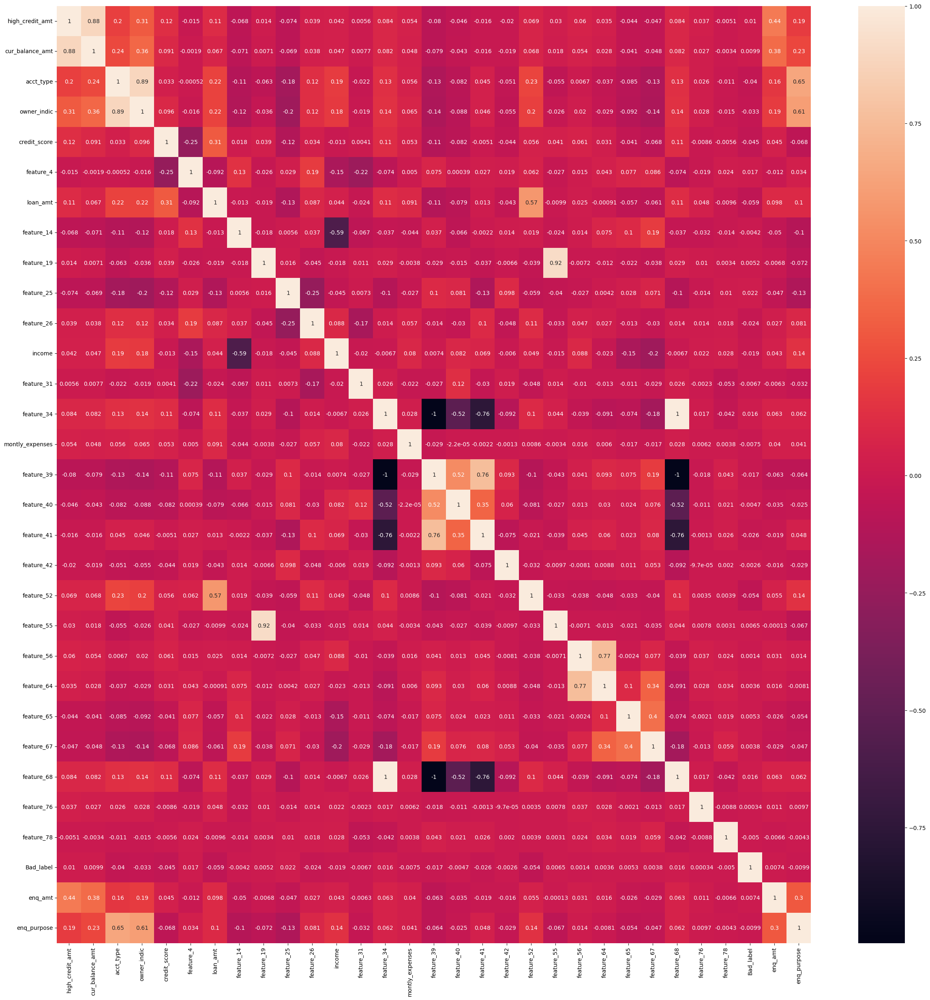

In [63]:
# Increase the figure size
plt.figure(figsize=(30, 30))

# Create the heatmap
sns.heatmap(g.corr(), annot=True)

# Show the plot
plt.show()


# Insights:

In [64]:
gnum.columns # Numerical columns

Index(['customer_no', 'high_credit_amt', 'cur_balance_amt', 'acct_type',
       'owner_indic', 'Unnamed: 0', 'feature_3', 'feature_4', 'feature_6',
       'feature_7', 'feature_14', 'feature_19', 'feature_25', 'feature_26',
       'feature_29', 'feature_30', 'feature_31', 'feature_34', 'feature_35',
       'feature_39', 'feature_40', 'feature_41', 'feature_42', 'feature_44',
       'feature_49', 'feature_52', 'feature_55', 'feature_56', 'feature_64',
       'feature_65', 'feature_66', 'feature_67', 'feature_68', 'feature_69',
       'feature_71', 'feature_74', 'feature_76', 'feature_78', 'Bad_label',
       'enq_amt', 'enq_purpose'],
      dtype='object')

In [65]:
gnum.head()

,customer_no,high_credit_amt,cur_balance_amt,acct_type,owner_indic,Unnamed: 0,feature_3,feature_4,feature_6,feature_7,feature_14,feature_19,feature_25,feature_26,feature_29,feature_30,feature_31,feature_34,feature_35,feature_39,feature_40,feature_41,feature_42,feature_44,feature_49,feature_52,feature_55,feature_56,feature_64,feature_65,feature_66,feature_67,feature_68,feature_69,feature_71,feature_74,feature_76,feature_78,Bad_label,enq_amt,enq_purpose
0,1,2528846.0,4714857,121,21,0,650.0,2.0,14.0,500000.0,0.0,1.0,1.0,2.0,400610.0,1965.0,0.0,2.0,90000.0,0.0,0.0,0.0,0.0,400059.0,NaN,0.0,1.0,21.0,21.0,15.0,400610.0,0.0,2.0,90000.0,21.0,NaN,0.0,1.0,0,4.981150e+06,147.0
1,2,1000000.0,30754,20,2,1,760.0,1.0,14.0,1200000.0,0.0,1.0,1.0,2.0,560042.0,1969.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,560042.0,NaN,0.0,1.0,17.0,17.0,12.0,560042.0,0.0,2.0,1.0,17.0,NaN,0.0,1.0,0,6.676682e+09,1984.0
2,3,121523.0,17864,10,1,2,774.0,1.0,14.0,700000.0,0.0,2.0,1.0,0.0,560042.0,1966.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,560042.0,NaN,0.0,3.0,17.0,17.0,12.0,560042.0,0.0,2.0,1.0,17.0,NaN,0.0,1.0,0,3.400000e+06,1.0
3,4,3000000.0,1845569,257,31,3,770.0,1.0,14.0,500000.0,0.0,1.0,1.0,3.0,411001.0,1988.0,0.0,2.0,100000.0,0.0,0.0,0.0,0.0,411026.0,NaN,0.0,1.0,21.0,21.0,16.0,411001.0,0.0,2.0,100000.0,21.0,NaN,1.0,1.0,0,5.081000e+07,834.0
4,5,12662938.0,7973,62,7,4,NaN,3.0,14.0,500000.0,0.0,1.0,1.0,3.0,122009.0,1995.0,0.0,2.0,300000.0,0.0,0.0,0.0,0.0,122009.0,NaN,0.0,1.0,13.0,13.0,3.0,122009.0,0.0,2.0,300000.0,13.0,NaN,0.0,1.0,0,2.000000e+03,20.0


In [66]:
gcat.columns # Categorical columns

Index(['dt_opened', 'entry_time', 'feature_1', 'feature_2', 'feature_5',
       'feature_8', 'feature_9', 'feature_10', 'feature_11', 'feature_12',
       'feature_13', 'feature_15', 'feature_16', 'feature_17', 'feature_18',
       'feature_20', 'feature_21', 'feature_22', 'feature_23', 'feature_24',
       'feature_27', 'feature_28', 'feature_32', 'feature_33', 'feature_36',
       'feature_37', 'feature_38', 'feature_43', 'feature_45', 'feature_46',
       'feature_47', 'feature_48', 'feature_50', 'feature_51', 'feature_53',
       'feature_54', 'feature_57', 'feature_58', 'feature_59', 'feature_60',
       'feature_61', 'feature_62', 'feature_63', 'feature_70', 'feature_72',
       'feature_73', 'feature_75', 'feature_77', 'feature_79'],
      dtype='object')

In [67]:
gcat.head()

,dt_opened,entry_time,feature_1,feature_2,feature_5,feature_8,feature_9,feature_10,feature_11,feature_12,feature_13,feature_15,feature_16,feature_17,feature_18,feature_20,feature_21,feature_22,feature_23,feature_24,feature_27,feature_28,feature_32,feature_33,feature_36,feature_37,feature_38,feature_43,feature_45,feature_46,feature_47,feature_48,feature_50,feature_51,feature_53,feature_54,feature_57,feature_58,feature_59,feature_60,feature_61,feature_62,feature_63,feature_70,feature_72,feature_73,feature_75,feature_77,feature_79
0,18-Apr-15,13-Apr-15,Insignia,13-Apr-15,Card Setup,NaN,NaN,NaN,Y,IS1,NaN,159,4284,4284,NaN,ADFPNXXXXX,03-Sep-65,98332XXXXX,N,@REDIFFMAIL.COM,NaN,Mumbai / Navi Mumbai / Thane,Self,Y,NaN,NaN,NaN,Mumbai,@CODOGNOTTO.NET,PAN Card,ADFPNXXXXX,The Ratnakar Bank Ltd.,Y,State Bank of India,01-Jun-13,17-Jun-16,NaN,Y,Y,N,NaN,Y,1965-0,Nov-00,R,NaN,0000-00-00,98332XXXXX,N
1,21-Apr-15,21-Apr-15,Insignia,21-Apr-15,Card Setup,NaN,NaN,NaN,Y,IS1,NaN,91,B001,4077,NaN,AJWPRXXXXX,14-Jul-62,99455XXXXX,N,@GMAIL.COM,NaN,Bengaluru,Self,Y,NaN,NaN,NaN,Bangalore,NaN,PAN Card,AJWPRXXXXX,The Ratnakar Bank Ltd.,N,NaN,NaN,17-Jun-16,NaN,Y,Y,N,NaN,Y,1969-0,Nov-00,R,NaN,0000-00-00,99455XXXXX,N
2,22-Apr-15,21-Apr-15,Insignia,21-Apr-15,Card Setup,NaN,NaN,NaN,Y,IS1,NaN,91,B001,4077,NaN,AFAPNXXXXX,10-Apr-66,98456XXXXX,N,@SHOBANARAYAN.COM,NaN,Bengaluru,Self,Y,NaN,NaN,NaN,Bangalore,NaN,PAN Card,AFAPNXXXXX,NaN,N,NaN,NaN,17-Jun-16,NaN,N,Y,N,NaN,Y,1966-0,Nov-00,R,NaN,0000-00-00,98456XXXXX,N
3,25-Apr-15,15-Apr-15,Insignia,20-Apr-15,Card Setup,NaN,NaN,NaN,Y,IS1,NaN,157,5107,5107,NaN,AAAPDXXXXX,16-Apr-64,98220XXXXX,N,@VSNL.COM,NaN,Pune,Self,Y,NaN,NaN,NaN,Pune,@ALBAJ.COM,PAN Card,AAAPDXXXXX,The Ratnakar Bank Ltd.,Y,HDFC Bank,NaN,17-Jun-16,NaN,Y,Y,N,NaN,Y,1988-0,Nov-00,R,NaN,6/15/65,98220XXXXX,N
4,06-May-15,30-Apr-15,Insignia,NaN,Card Setup,NaN,NaN,NaN,Y,IS1,NaN,100,D016,4564,NaN,ABEPSXXXXX,03-Jan-54,98111XXXXX,N,@REDIFFMAIL.COM,NaN,Gurgaon,Self,Y,NaN,NaN,NaN,Gurgaon,NaN,PAN Card,ABEPSXXXXX,The Ratnakar Bank Ltd.,N,NaN,NaN,17-Jun-16,NaN,Y,Y,N,NaN,Y,1995-0,Nov-00,R,NaN,0000-00-00,98111XXXXX,N


In [68]:
g

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,card_variant,credit_score,feature_4,loan_amt,feature_11,feature_14,feature_19,pan_card,loan_end_dt/last_payment_dt,ph_number,feature_23,email,feature_25,feature_26,education,income,feature_31,accommodation,feature_33,feature_34,montly_expenses,job_organisation,sector,designation,feature_39,feature_40,feature_41,feature_42,perm_address,work_email,ID,feature_50,bank_name,feature_52,feature_53,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_67,feature_68,month_yr_date,feature_72,feature_76,feature_78,Bad_label,enq_amt,enq_purpose
0,2528846.0,4714857,121,21,2015-04-18,2015-04-13,Insignia,650.0,2.0,500000.0,Y,0.0,1.0,ADFPNXXXXX,2065-09-03,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,NaN,400610.0,0.0,Self,Y,2.0,90000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Mumbai,@CODOGNOTTO.NET,PAN Card,Y,State Bank of India,0.0,2013-06-01,1.0,21.0,Y,Y,N,Y,1965-0,21.0,15.0,0.0,2.0,Nov-00,R,0.0,1.0,0,4981150,147
1,1000000.0,30754,20,2,2015-04-21,2015-04-21,Insignia,760.0,1.0,1200000.0,Y,0.0,1.0,AJWPRXXXXX,2062-07-14,99455XXXXX,N,@GMAIL.COM,1.0,2.0,NaN,560042.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,NaN,PAN Card,N,NaN,0.0,NaT,1.0,17.0,Y,Y,N,Y,1969-0,17.0,12.0,0.0,2.0,Nov-00,R,0.0,1.0,0,6676682006,1984
2,121523.0,17864,10,1,2015-04-22,2015-04-21,Insignia,774.0,1.0,700000.0,Y,0.0,2.0,AFAPNXXXXX,2066-04-10,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,NaN,560042.0,0.0,Self,Y,2.0,1.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Bangalore,NaN,PAN Card,N,NaN,0.0,NaT,3.0,17.0,N,Y,N,Y,1966-0,17.0,12.0,0.0,2.0,Nov-00,R,0.0,1.0,0,3400000,1
3,3000000.0,1845569,257,31,2015-04-25,2015-04-15,Insignia,770.0,1.0,500000.0,Y,0.0,1.0,AAAPDXXXXX,2064-04-16,98220XXXXX,N,@VSNL.COM,1.0,3.0,NaN,411001.0,0.0,Self,Y,2.0,100000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Pune,@ALBAJ.COM,PAN Card,Y,HDFC Bank,0.0,NaT,1.0,21.0,Y,Y,N,Y,1988-0,21.0,16.0,0.0,2.0,Nov-00,R,1.0,1.0,0,50810000,834
4,12662938.0,7973,62,7,2015-05-06,2015-04-30,Insignia,NaN,3.0,500000.0,Y,0.0,1.0,ABEPSXXXXX,2054-01-03,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,NaN,122009.0,0.0,Self,Y,2.0,300000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,Gurgaon,NaN,PAN Card,N,NaN,0.0,NaT,1.0,13.0,Y,Y,N,Y,1995-0,13.0,3.0,0.0,2.0,Nov-00,R,0.0,1.0,0,2000,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,185000.0,485225,74,13,2015-12-31,2015-12-10,Platinum Deligh,704.0,1.0,119000.0,Y,12.0,1.0,CUQPSXXXXX,1988-10-12,98715XXXXX,N,@YAHOO.COM,2.0,0.0,Graduate,110045.0,10.0,Paren,Y,1.0,33000.0,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015.0,6.0,0.0,6.0,Gurgaon,NaN,PAN Card,Y,State Bank of India,99000.0,2015-01-01,1.0,10.0,N,Y,N,Y,1988-10,10.0,157.0,0.0,1.0,0-0,R,0.0,1.0,0,1570344,116
23892,27314.0,16393,10,1,2015-12-17,2015-11-16,Platinum Deligh,NaN,2.0,35000.0,Y,12.0,1.0,DTPPSXXXXX,1987-02-01,99101XXXXX,N,@GMAIL.COM,2.0,0.0,Graduate,110037.0,12.0,Rente,N,1.0,1.0,Private Ltd. Co.,Others,ENGINEER,2012.0,12.0,3.0,0.0,New Delhi,@GMAIL.COM,PAN Card,N,NaN,0.0,NaT,1.0,10.0,N,Y,N,Y,2014-12,33.0,102.0,1.0,1.0,0-0,O,0.0,1.0,0,239010,110
23893,20500.0,2077,26,3,2015-11-04,2015-09-24,Platinum Maxima,748.0,3.0,68000.0,Y,NaN,1.0,CPOPSXXXXX,1986-11-08,99111XXXXX,Y,@GMAIL.COM,2.0,0.0,Graduate,110033.0,0.0,Paren,Y,1.0,1.0,Private Ltd. Co.,Health Care,SENIOR ANALYST,2015.0,1.0,3.0,0.0,Gurgaon,@ACCRETIVEHEALTH.COM,PAN Card,Y,HDFC Bank,52000.0,2014-09-01,1.0,10.0,N,Y,N,Y,1986-0,10.0,157.0,0.0,1.0,0-0,R,0.0,1.0,0,102000,40
23894,400000.0,370758,42,9,2015-11-03,2015-09-30,Platinum Deligh,740.0,3.0,158000.0,Y,12.0,1.0,AVZPGXXXXX,1982-11-24,93100XXXXX,N,@GMAIL.COM,1.0,0.0,Graduate,110095.0,0.0,Self,Y,2.0,25000.0,NaN,NaN,NaN,0.0,0.0,0.0,0.0,New Delhi,NaN,PAN Card,Y,Citibank N.A.,65000.0,2014-04-01,2.0,10.0,N,Y,N,Y,2010-0,10.0,157.0,0.0,2.0,03-May,R,0.0,1.0,0,727000,62


In [69]:
m=['dt_opened','entry_time','loan_end_dt/last_payment_dt','feature_53','feature_63']
m1=g[m]
m1

,dt_opened,entry_time,loan_end_dt/last_payment_dt,feature_53,feature_63
0,2015-04-18,2015-04-13,2065-09-03,2013-06-01,1965-0
1,2015-04-21,2015-04-21,2062-07-14,NaT,1969-0
2,2015-04-22,2015-04-21,2066-04-10,NaT,1966-0
3,2015-04-25,2015-04-15,2064-04-16,NaT,1988-0
4,2015-05-06,2015-04-30,2054-01-03,NaT,1995-0
...,...,...,...,...,...
23891,2015-12-31,2015-12-10,1988-10-12,2015-01-01,1988-10
23892,2015-12-17,2015-11-16,1987-02-01,NaT,2014-12
23893,2015-11-04,2015-09-24,1986-11-08,2014-09-01,1986-0
23894,2015-11-03,2015-09-30,1982-11-24,2014-04-01,2010-0


In [70]:
m1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 5 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   dt_opened                    23896 non-null  datetime64[ns]
 1   entry_time                   23881 non-null  datetime64[ns]
 2   loan_end_dt/last_payment_dt  23881 non-null  datetime64[ns]
 3   feature_53                   12286 non-null  datetime64[ns]
 4   feature_63                   23881 non-null  object        
dtypes: datetime64[ns](4), object(1)
memory usage: 1.1+ MB


# EDA

# Here we are trying to plot the graphs for " Numerical Columns "

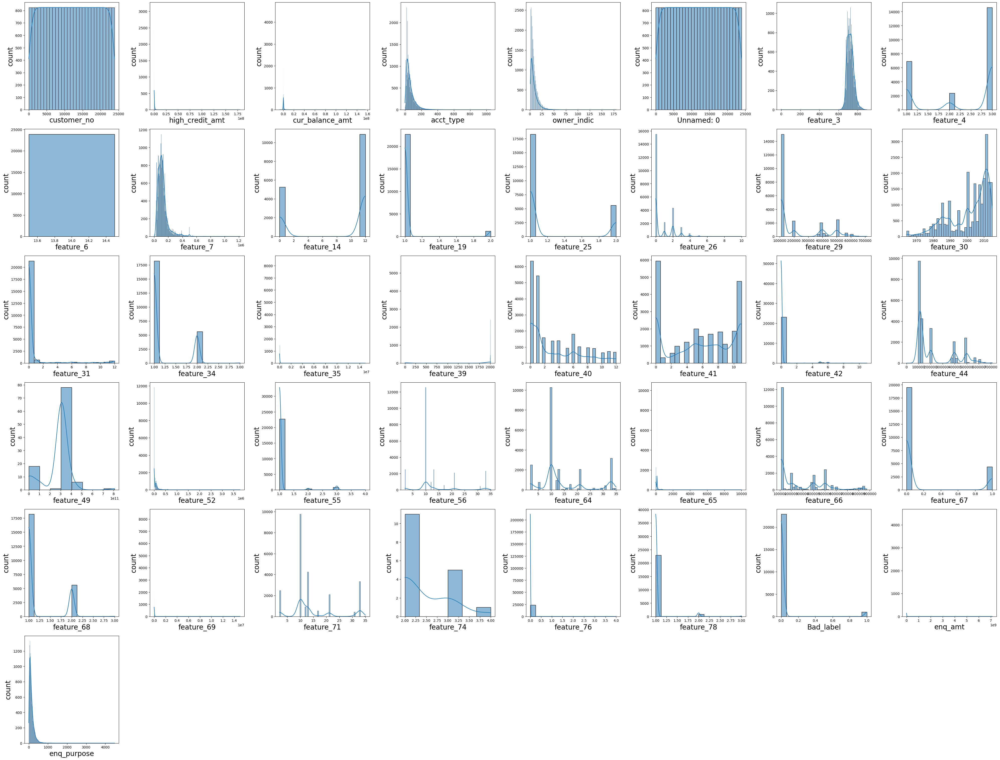

In [242]:
plt.figure(figsize=(40,40),facecolor='white')
plotnumber=1

for column in gnum:
    if plotnumber<=100:
        ax=plt.subplot(8,8,plotnumber)
        sns.histplot(gnum[column],kde=True)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
        plotnumber+=1
        plt.tight_layout()

# Here we are trying to plot the graphs for " Categorical Columns "

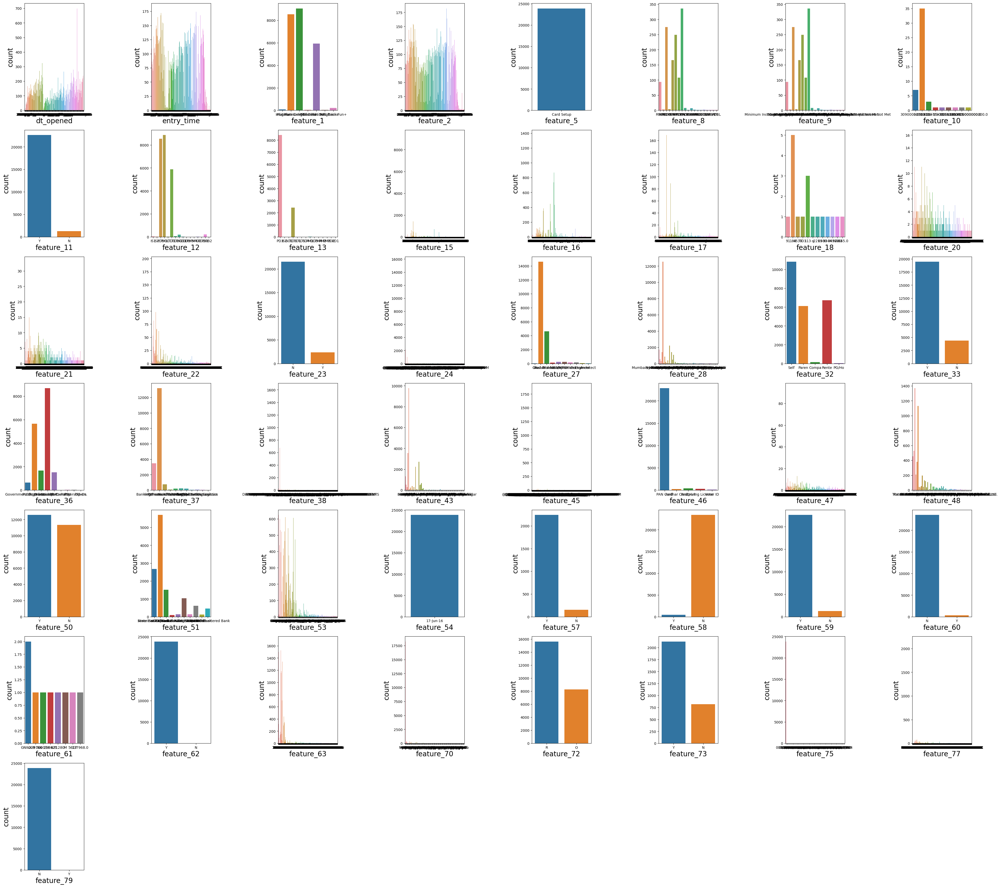

In [243]:
plt.figure(figsize=(40,40),facecolor='white')
plotnumber=1

for column in gcat:
    if plotnumber<=100:
        ax=plt.subplot(8,8,plotnumber)
        sns.countplot(x=column, data=gcat)
        plt.xlabel(column,fontsize=20)
        plt.ylabel('count',fontsize=20)
        plotnumber+=1
        plt.tight_layout()

# Here is the another graphs for " Numerical Columns "

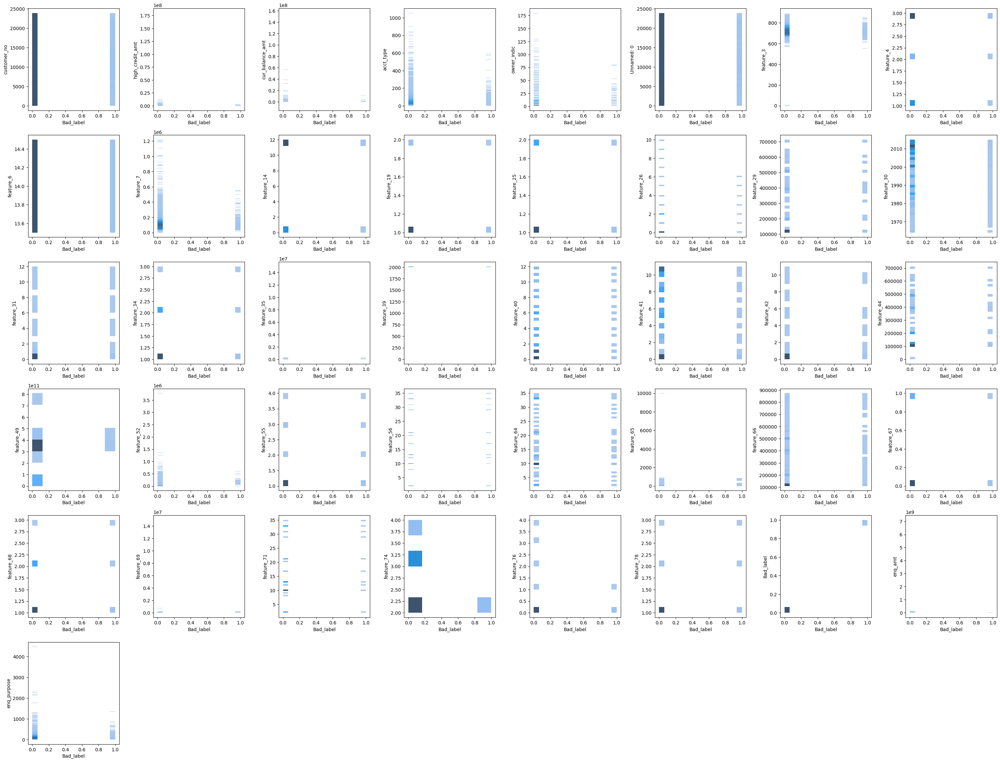

In [244]:
plt.figure(figsize=(30,30),facecolor='white')
plotnumber=1
for column in gnum:
    if plotnumber < 100:
        ax=plt.subplot(8,8,plotnumber)
        sns.histplot(data=gnum,x=gnum['Bad_label'],y=gnum[column],stat='percent',kde=True)
        plt.xlabel('Bad_label',fontsize=10)
        plt.ylabel(column,fontsize=10)
    plotnumber+=1
plt.tight_layout()

# Univariate Analysis 

[]

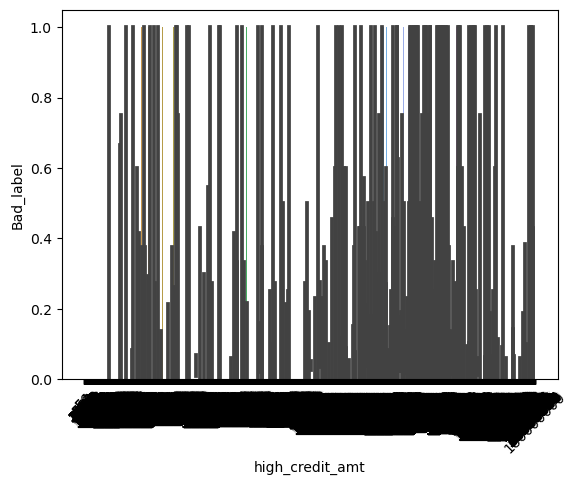

In [245]:
sns.barplot(x=g['high_credit_amt'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insight:

### Here we are trying to findout that the relationship between the target variable and the " high_credit_amt ".

[]

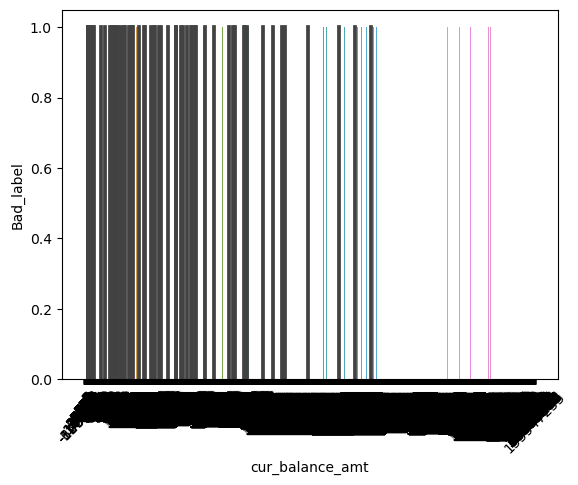

In [246]:
sns.barplot(x=g['cur_balance_amt'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

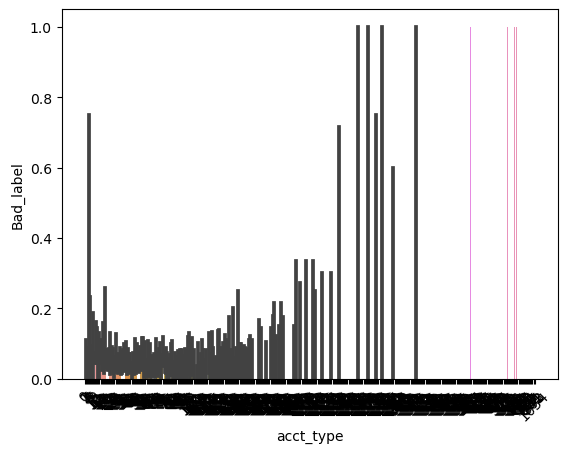

In [247]:
sns.barplot(x=g['acct_type'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### We can be easily find that the maximum dataset were present in between 0.0 - 0.4

[]

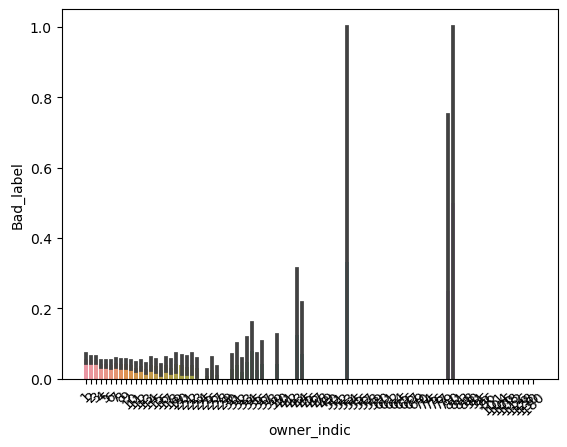

In [248]:
sns.barplot(x=g['owner_indic'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

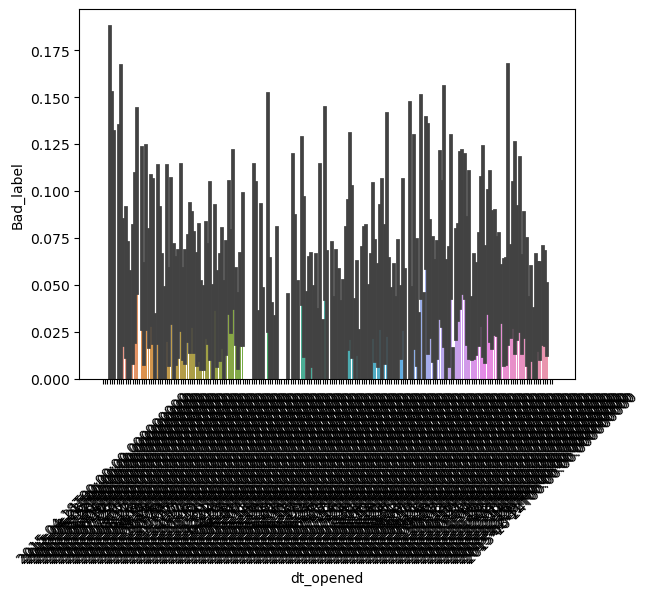

In [249]:
sns.barplot(x=g['dt_opened'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

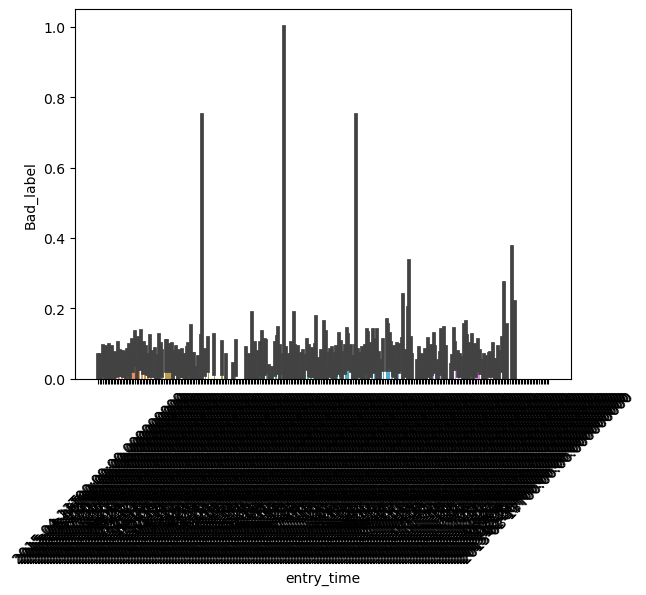

In [250]:
sns.barplot(x=g['entry_time'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

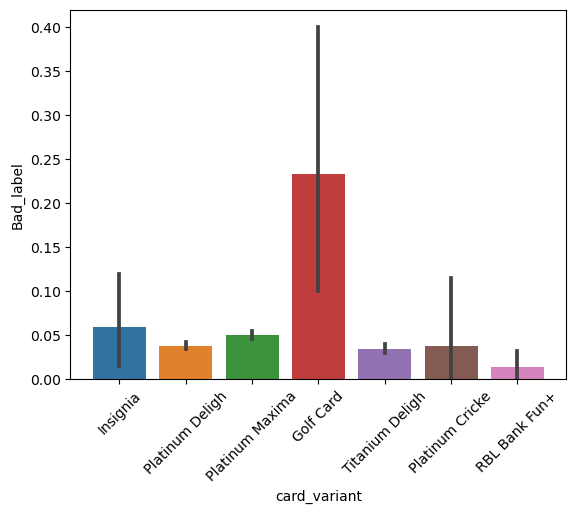

In [251]:
sns.barplot(x=g['card_variant'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can find that most of the customers were having card type of " Golf card ".

[]

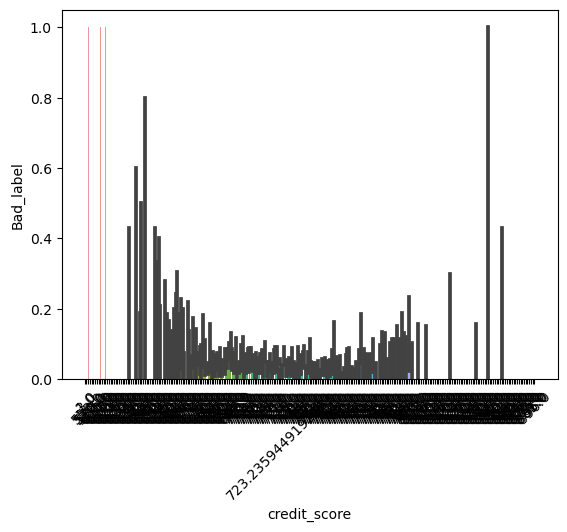

In [252]:
sns.barplot(x=g['credit_score'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

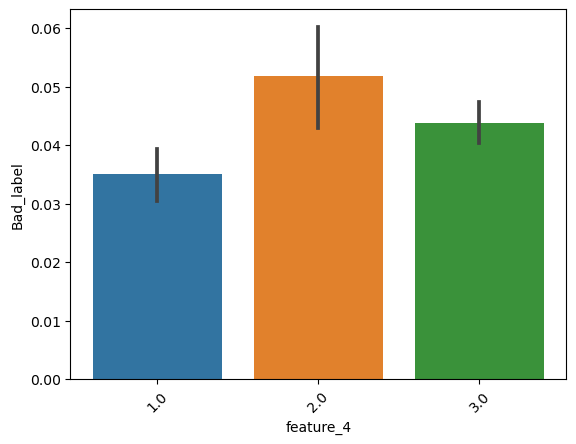

In [253]:
sns.barplot(x=g['feature_4'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

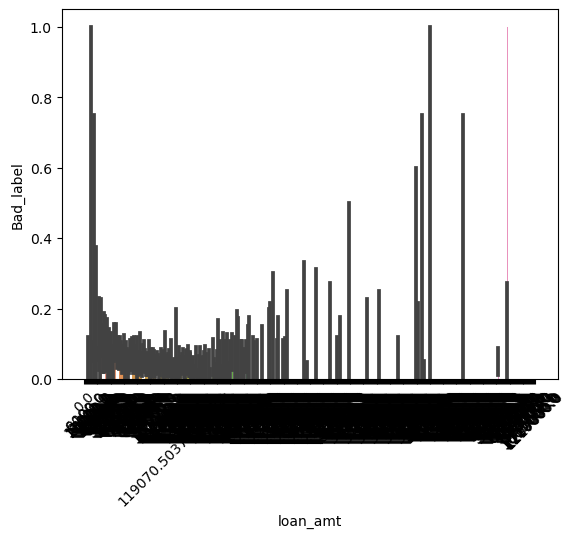

In [254]:
sns.barplot(x=g['loan_amt'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

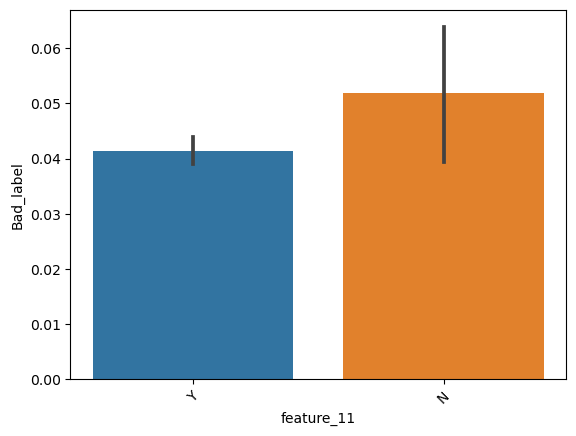

In [255]:
sns.barplot(x=g['feature_11'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

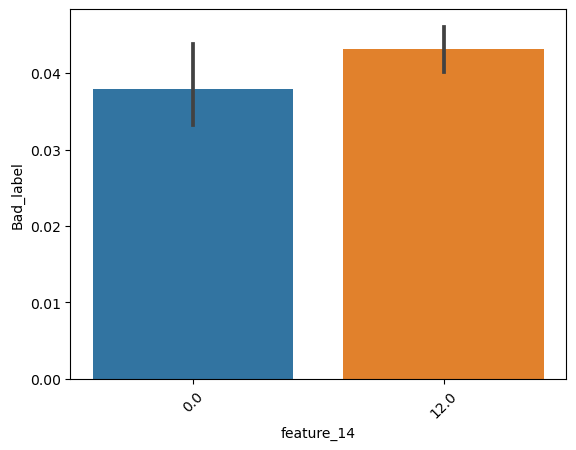

In [256]:
sns.barplot(x=g['feature_14'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

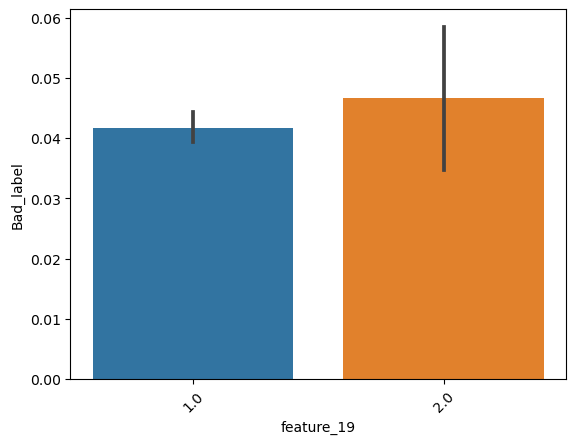

In [257]:
sns.barplot(x=g['feature_19'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

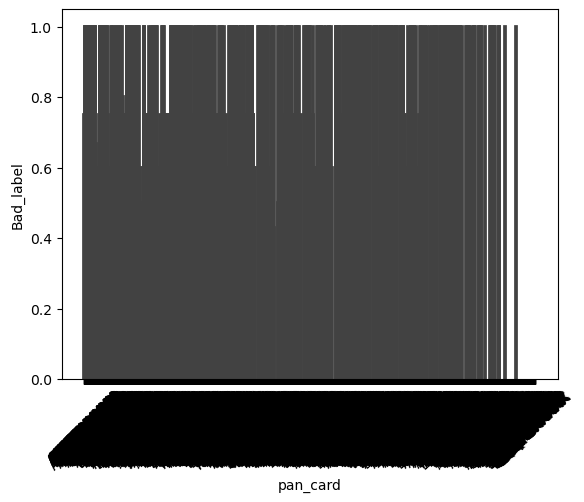

In [258]:
sns.barplot(x=g['pan_card'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

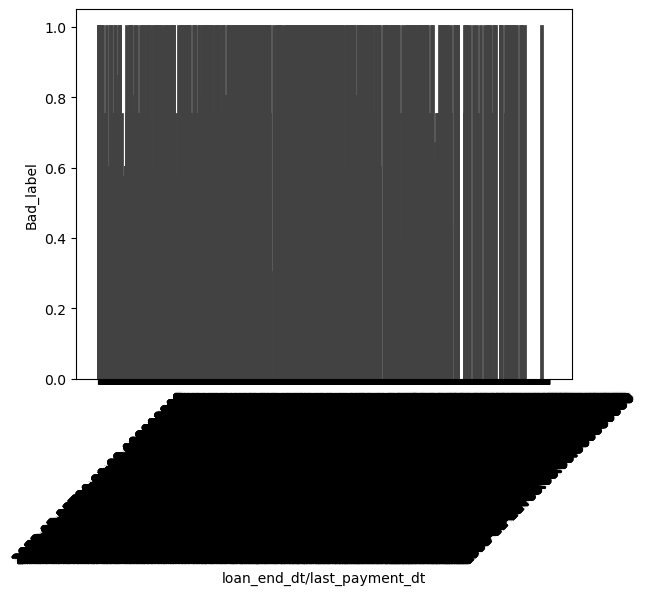

In [259]:
sns.barplot(x=g['loan_end_dt/last_payment_dt'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

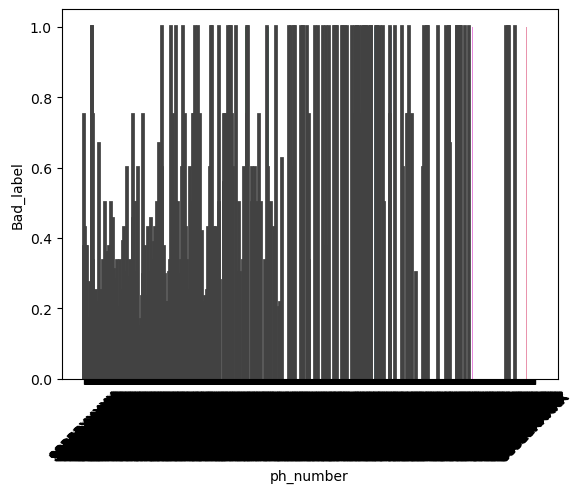

In [260]:
sns.barplot(x=g['ph_number'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

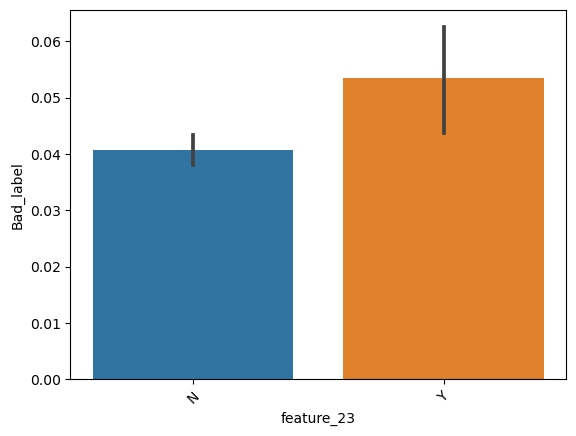

In [261]:
sns.barplot(x=g['feature_23'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

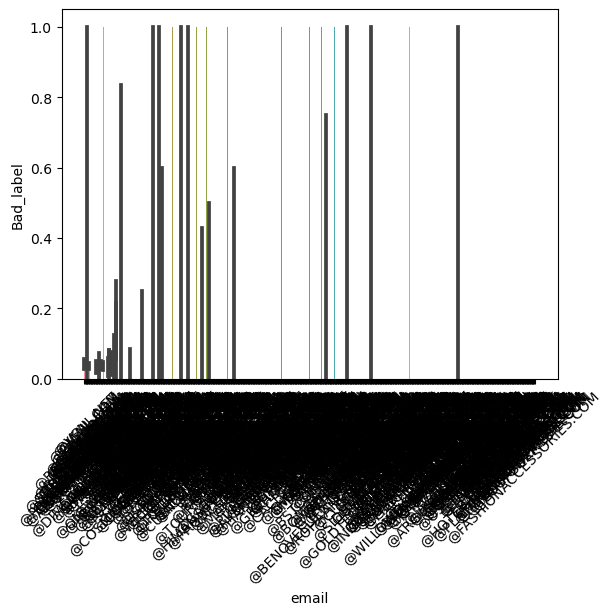

In [262]:
sns.barplot(x=g['email'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

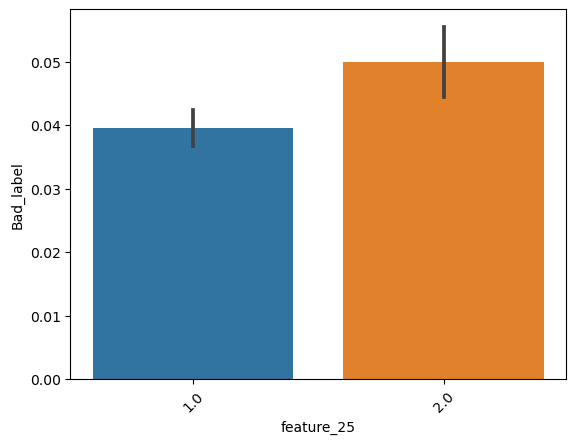

In [263]:
sns.barplot(x=g['feature_25'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

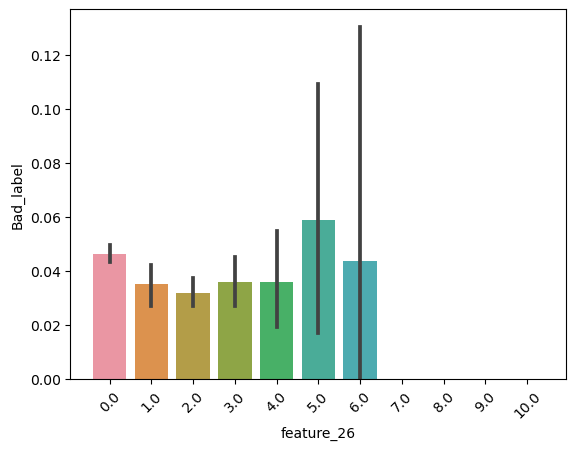

In [264]:
sns.barplot(x=g['feature_26'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

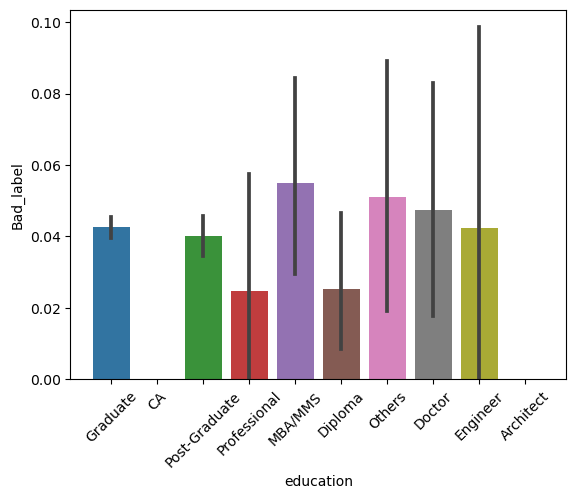

In [265]:
sns.barplot(x=g['education'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can be able to figure out on an average every department were having more or less occupy equal no. of cards except the Professional and Diploma department.

[]

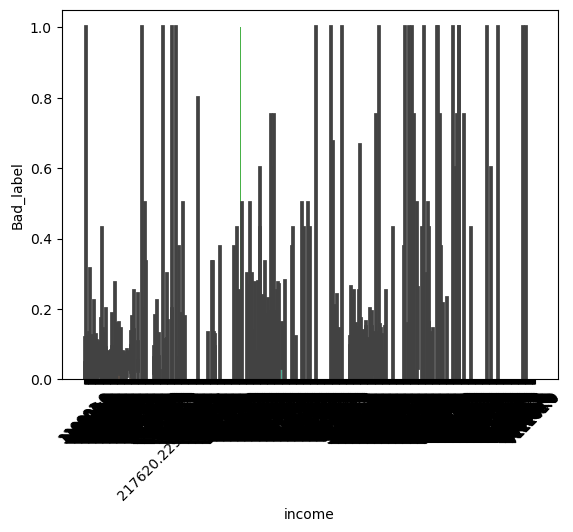

In [266]:
sns.barplot(x=g['income'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can conclude that the Income is not having much more impact on the target variable.

[]

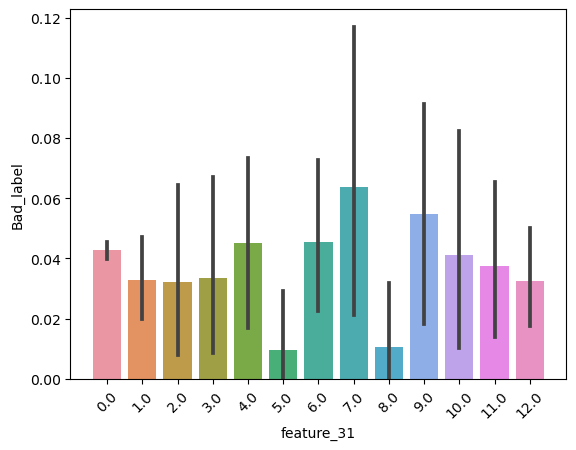

In [267]:
sns.barplot(x=g['feature_31'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

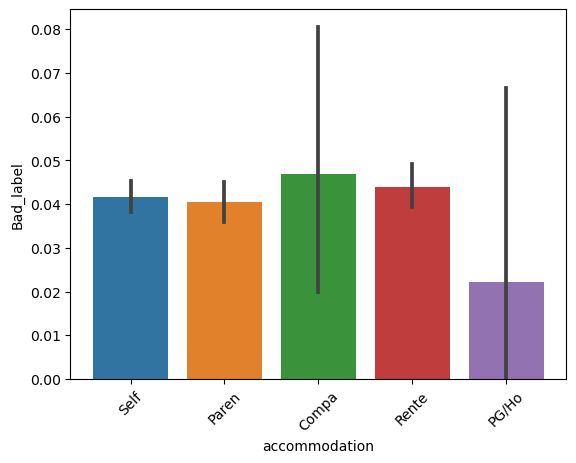

In [268]:
sns.barplot(x=g['accommodation'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can conclude that every type of accomodation is having equal sort of credits except the " PG/HO ".

[]

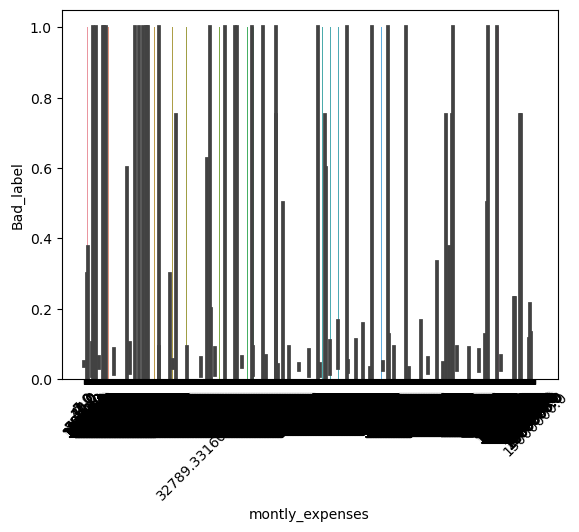

In [269]:
sns.barplot(x=g['montly_expenses'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can conclude that there will be no impact of " Monthly_Expenses " on the target variable.

[]

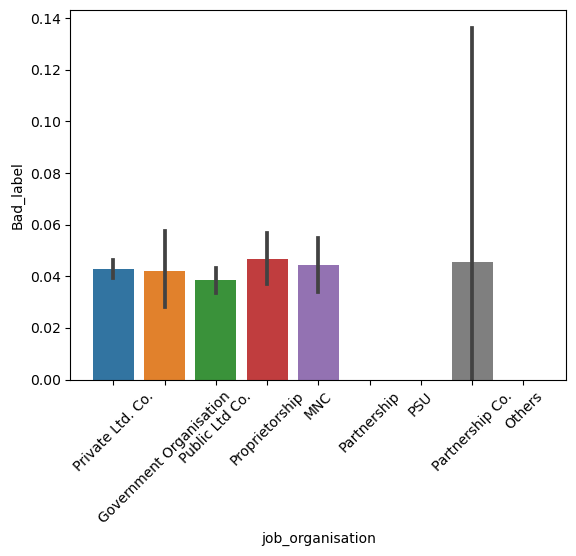

In [270]:
sns.barplot(x=g['job_organisation'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()



# Insights :

### Here we can colclude that the every type of " Job_Organisation " is having equal impact on taget variable.

[]

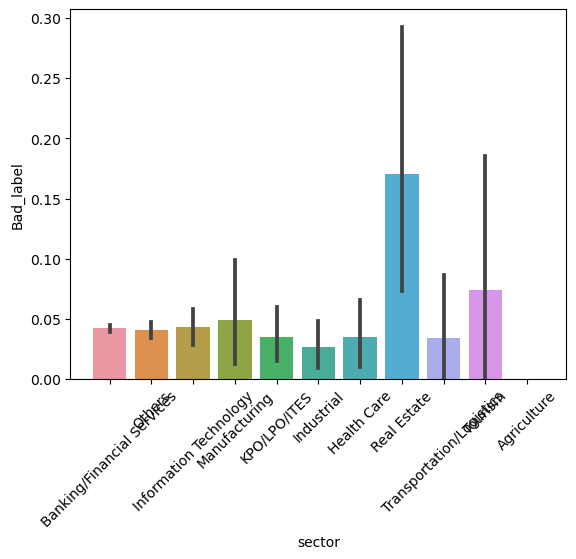

In [271]:
sns.barplot(x=g['sector'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can conclude that the every " Sector "  has equal weightage except  " Real_State " on target variable.

[]

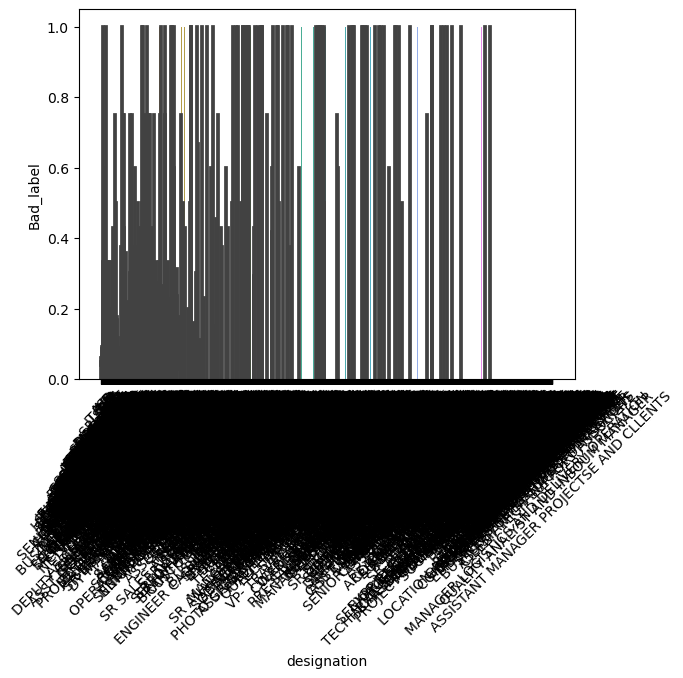

In [272]:
sns.barplot(x=g['designation'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we can be able to see that the " Designation " is no impact on the taregt variable.

[]

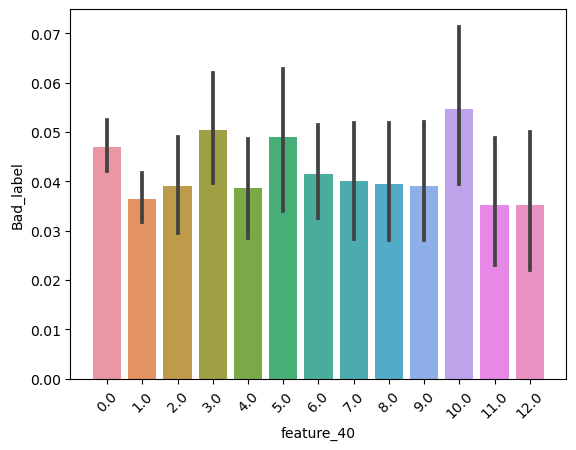

In [273]:
sns.barplot(x=g['feature_40'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

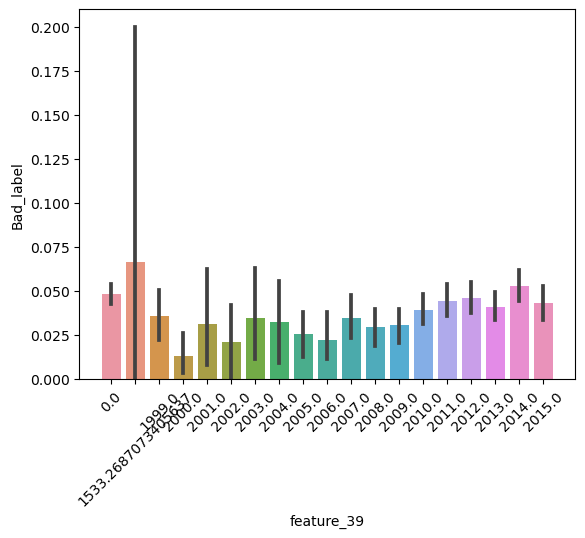

In [274]:
sns.barplot(x=g['feature_39'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

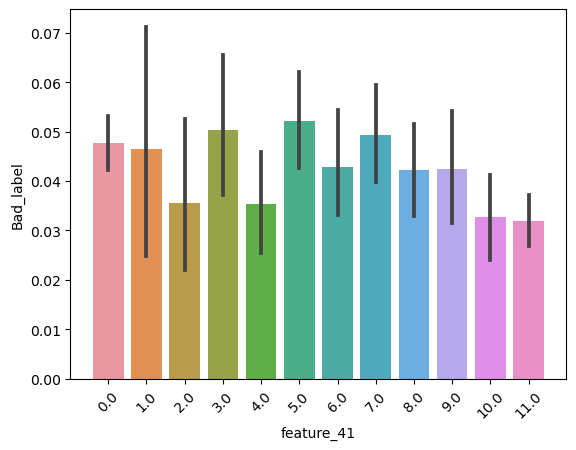

In [275]:
sns.barplot(x=g['feature_41'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

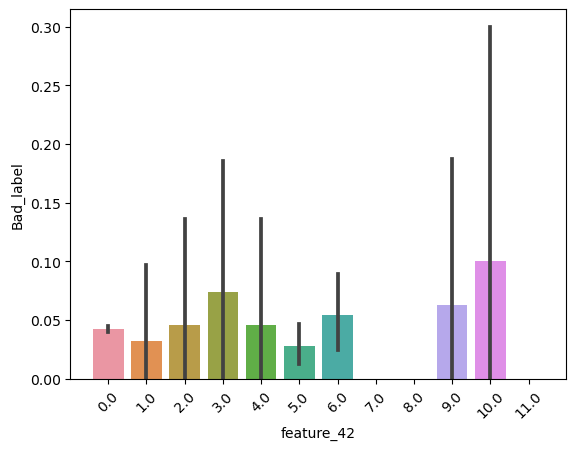

In [276]:
sns.barplot(x=g['feature_42'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

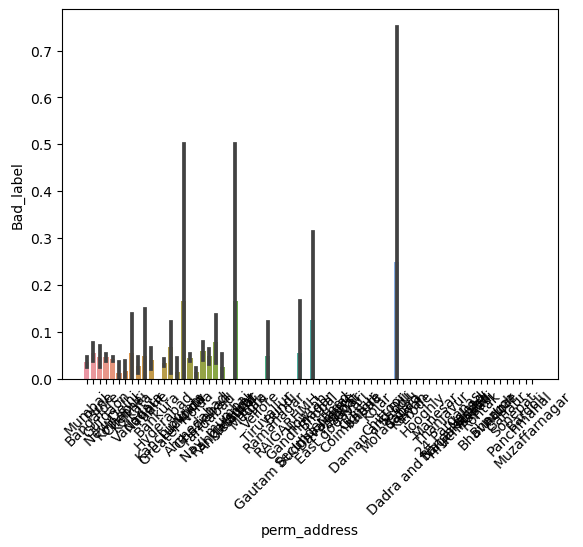

In [277]:
sns.barplot(x=g['perm_address'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

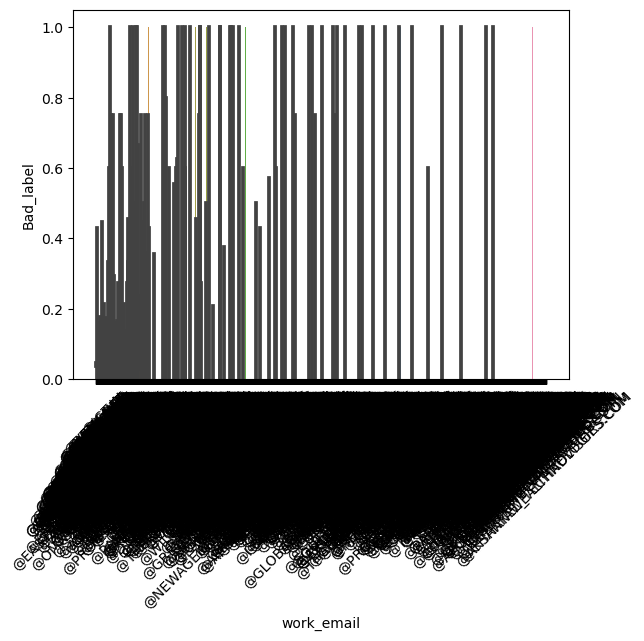

In [278]:
sns.barplot(x=g['work_email'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

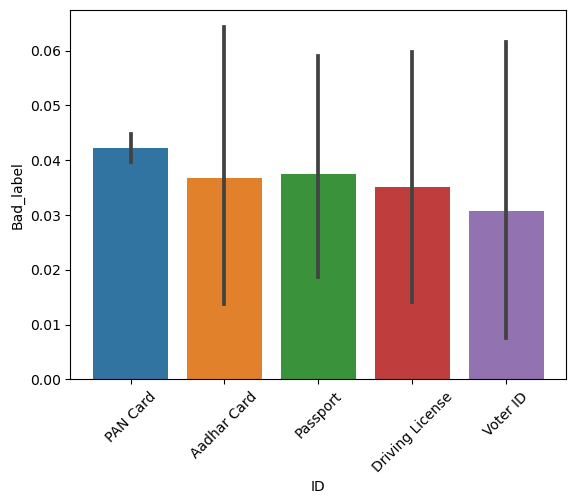

In [279]:
sns.barplot(x=g['ID'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### Here we already knew that the these all the above type of the IDs are much more important in terms of getting any type of credits.

[]

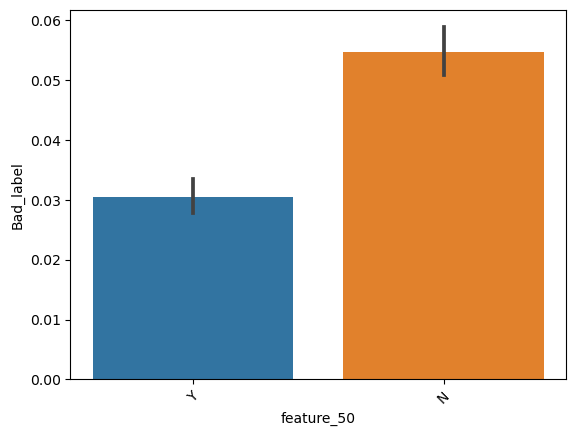

In [280]:
sns.barplot(x=g['feature_50'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

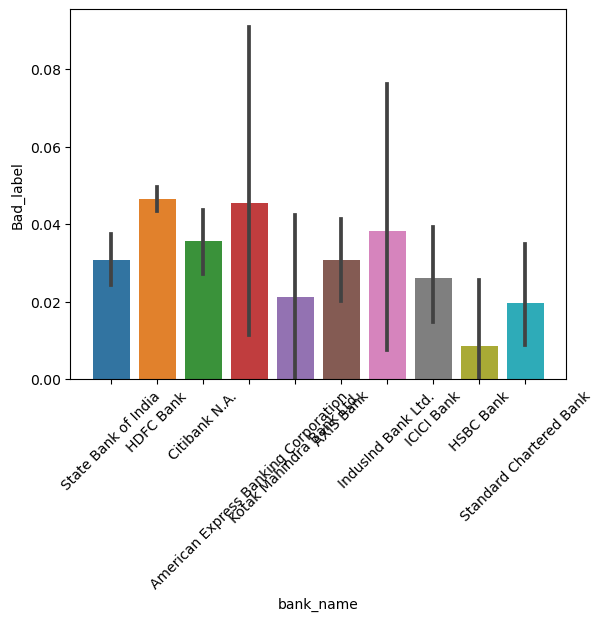

In [281]:
sns.barplot(x=g['bank_name'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

# Insights :

### From the above graph we can conclude that different banks were having their own criteria of providing credits they may having different set of rules for different type of customers they were dealing with.

[]

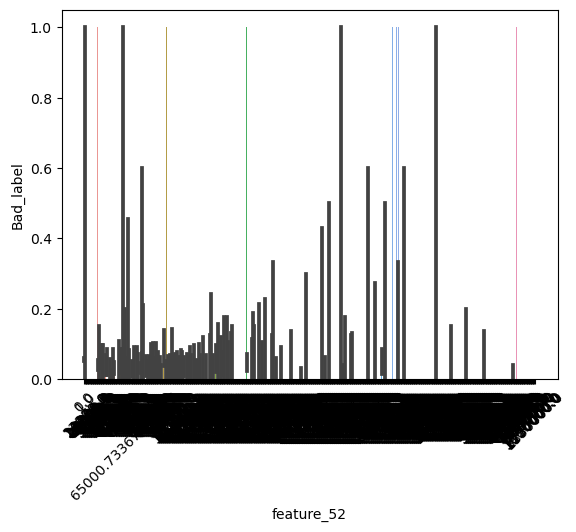

In [282]:
sns.barplot(x=g['feature_52'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

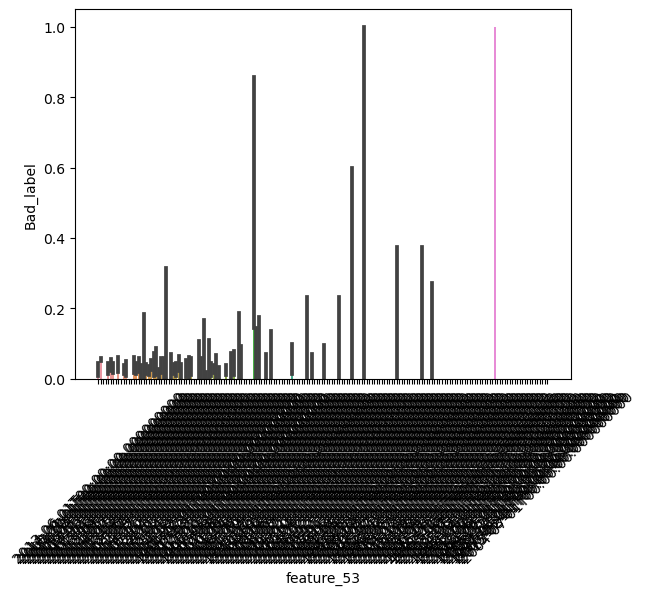

In [283]:
sns.barplot(x=g['feature_53'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

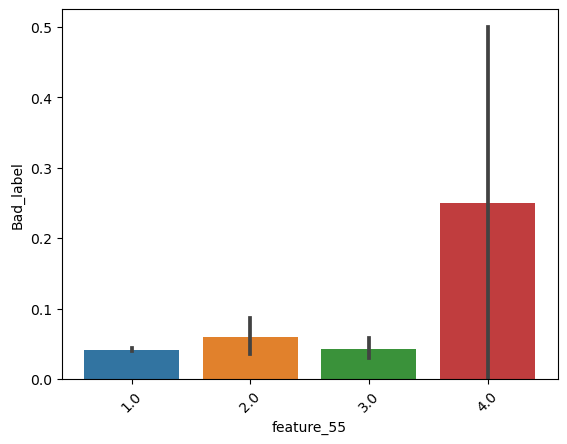

In [284]:
sns.barplot(x=g['feature_55'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

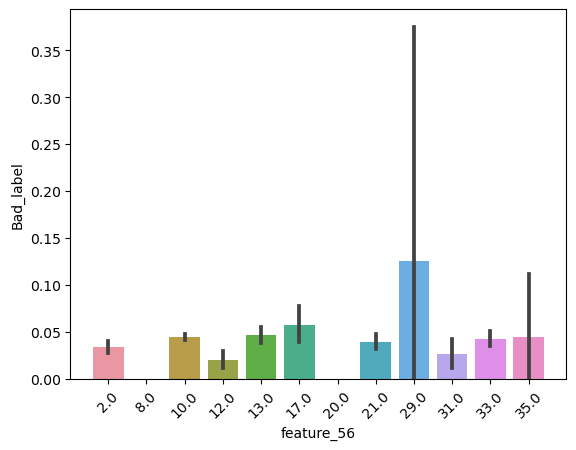

In [285]:
sns.barplot(x=g['feature_56'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

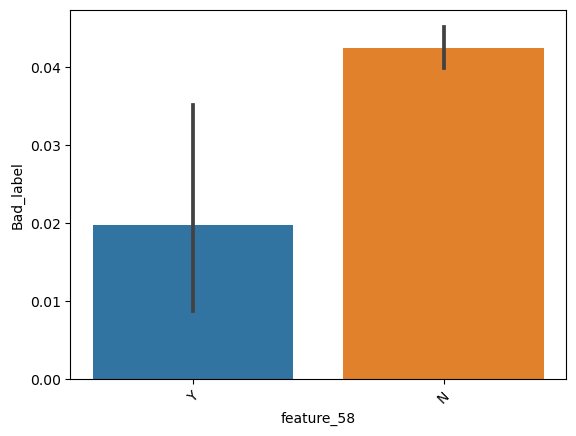

In [286]:
sns.barplot(x=g['feature_58'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

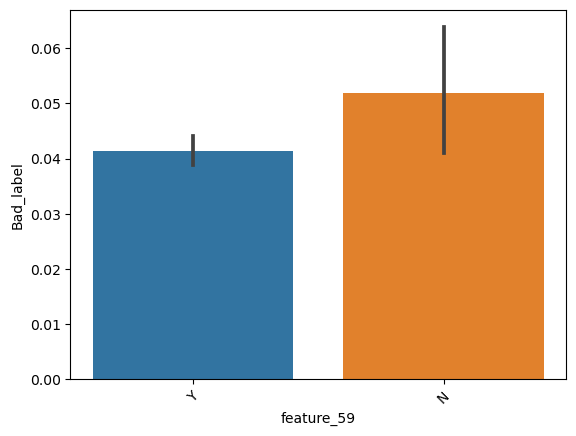

In [287]:
sns.barplot(x=g['feature_59'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

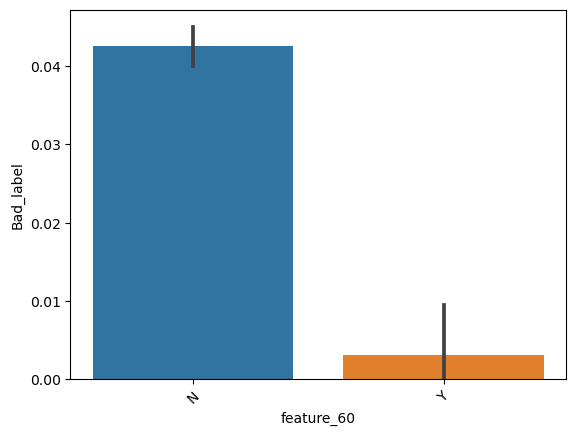

In [288]:
sns.barplot(x=g['feature_60'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

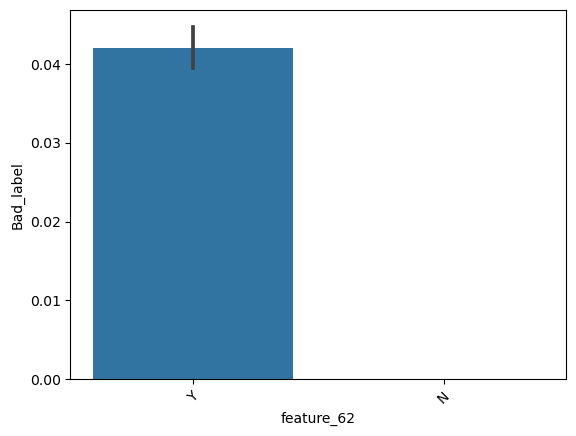

In [289]:
sns.barplot(x=g['feature_62'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

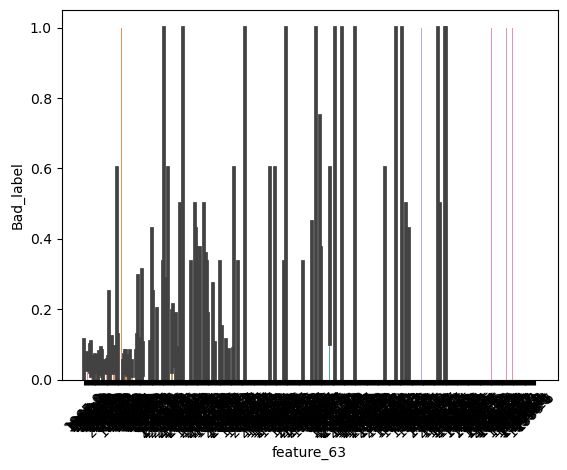

In [290]:
sns.barplot(x=g['feature_63'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

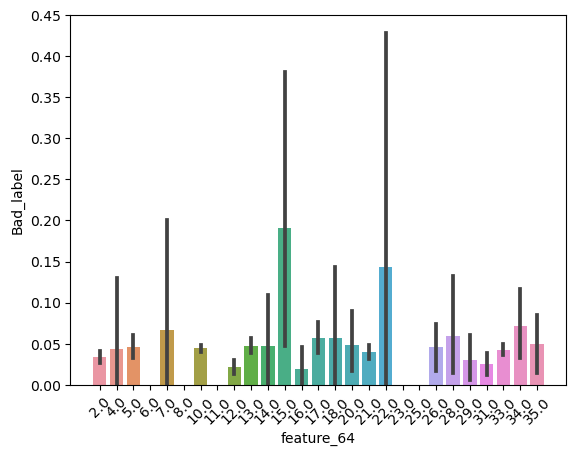

In [291]:
sns.barplot(x=g['feature_64'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

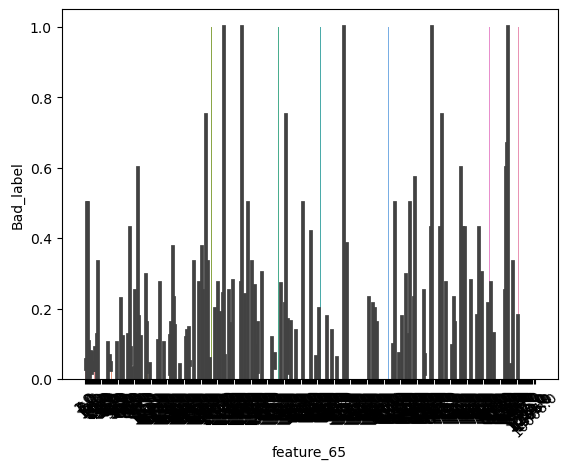

In [292]:
sns.barplot(x=g['feature_65'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

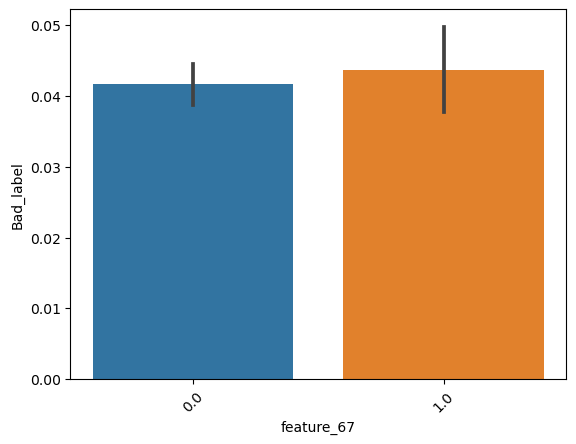

In [293]:
sns.barplot(x=g['feature_67'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

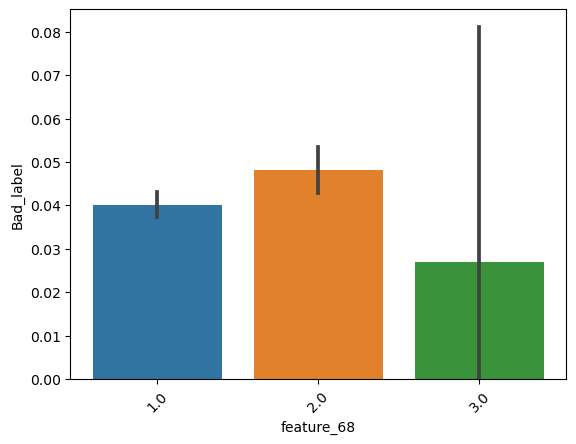

In [294]:
sns.barplot(x=g['feature_68'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

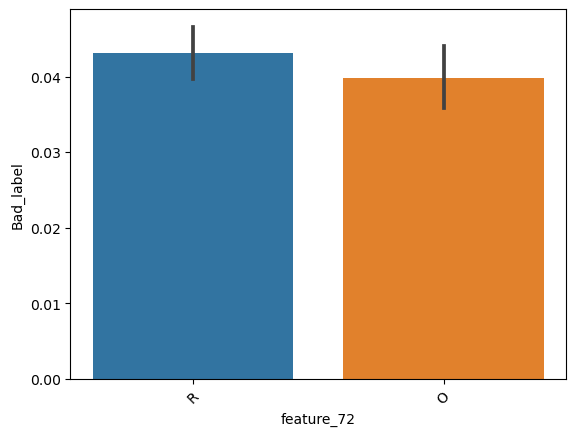

In [295]:
sns.barplot(x=g['feature_72'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

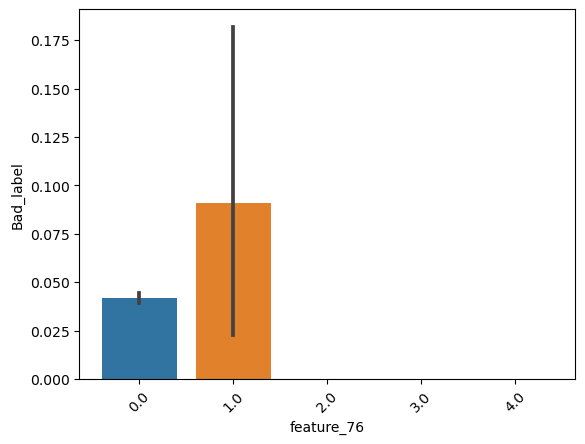

In [296]:
sns.barplot(x=g['feature_76'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

[]

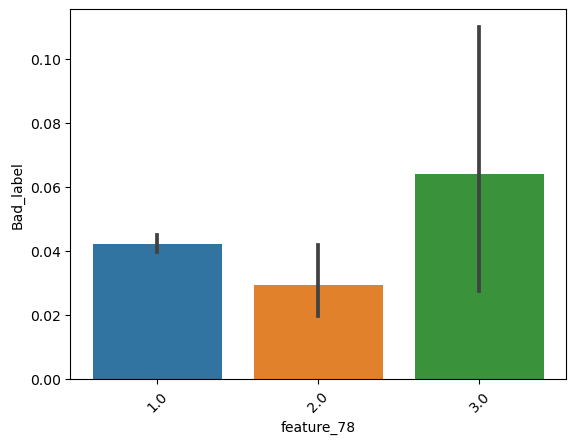

In [297]:
sns.barplot(x=g['feature_78'],y=g['Bad_label'],data=g)
plt.xticks(rotation=45)
plt.plot()

In [298]:
g.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 82 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   high_credit_amt              23896 non-null  int64         
 1   cur_balance_amt              23896 non-null  int64         
 2   acct_type                    23896 non-null  int64         
 3   owner_indic                  23896 non-null  int64         
 4   dt_opened                    23896 non-null  datetime64[ns]
 5   entry_time                   23896 non-null  datetime64[ns]
 6   card_variant                 23896 non-null  object        
 7   credit_score                 23896 non-null  float64       
 8   feature_4                    23896 non-null  float64       
 9   loan_amt                     23896 non-null  float64       
 10  feature_11                   23896 non-null  object        
 11  feature_14                   23896 non-nu

# Insights :

### The g.info() function provides an overview of the dataset, including information about the data types and memory usage.
### This information is crucial for understanding the structure and characteristics of the dataset, which is essential for data preprocessing, analysis, and modeling tasks. •
### Number of Rows : 23896 ,
### Columns : 60 ,
### Data Types: Integer (int64) : 6 columns,
### Float (float 64) : 25 columns ,
### Object (string) : 24 column ,
### Datetime64 : 4 columns .¶

In [72]:
# Finding unique values for each column
# Typically if the numer of unique values are < 20 then the variable is likely to be a category otherwise continuous
g.nunique()

high_credit_amt                12120
cur_balance_amt                22926
acct_type                        422
owner_indic                       90
dt_opened                        197
entry_time                       296
card_variant                       7
credit_score                     262
feature_4                          3
loan_amt                         484
feature_11                         2
feature_14                         2
feature_19                         2
pan_card                       10610
loan_end_dt/last_payment_dt     8462
ph_number                       3251
feature_23                         2
email                            721
feature_25                         2
feature_26                        11
education                         10
income                           964
feature_31                        13
accommodation                      5
feature_33                         2
feature_34                         3
montly_expenses                 4333
j

# Insights :

### The g.nunique() function provides the count of unique values for each column in the dataset. 

### These unique value counts provide insights into the diversity and distribution of data within each column, which can be valuable for understanding the dataset's characteristics and conducting further analysis.


In [73]:
m1=['job_organisation','Bad_label']
m2=g[m1]
m2

,job_organisation,Bad_label
0,NaN,0
1,NaN,0
2,NaN,0
3,NaN,0
4,NaN,0
...,...,...
23891,Private Ltd. Co.,0
23892,Private Ltd. Co.,0
23893,Private Ltd. Co.,0
23894,NaN,0


In [74]:
g.feature_78.value_counts() #5,6, 8, 10, 11, 12, 14, 16, 17, 18, 19, 20, 22, 23, 24, 25, 27,28, 29, 32, 33, 34, 35, 36, 37, 38, 39, 41, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 56

1.0    22958
2.0      814
3.0      109
Name: feature_78, dtype: int64

# Insights :

### We can be able to see that while comparing the categories of " Feature_78 " the category of " 1 " is very high as comparison to others.

In [75]:
g.info()  # drop 62 0, 7, 9, 21, 31, 40('high_credit_amt','credit_score','loan_amt','income','feature_39','feature_52') 

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   high_credit_amt              23883 non-null  float64       
 1   cur_balance_amt              23896 non-null  int64         
 2   acct_type                    23896 non-null  int64         
 3   owner_indic                  23896 non-null  int64         
 4   dt_opened                    23896 non-null  datetime64[ns]
 5   entry_time                   23881 non-null  datetime64[ns]
 6   card_variant                 23881 non-null  object        
 7   credit_score                 21060 non-null  float64       
 8   feature_4                    23881 non-null  float64       
 9   loan_amt                     23881 non-null  float64       
 10  feature_11                   23881 non-null  object        
 11  feature_14                   16163 non-nu

In [76]:
g.isnull().sum()

high_credit_amt                   13
cur_balance_amt                    0
acct_type                          0
owner_indic                        0
dt_opened                          0
entry_time                        15
card_variant                      15
credit_score                    2836
feature_4                         15
loan_amt                          15
feature_11                        15
feature_14                      7733
feature_19                        15
pan_card                           0
loan_end_dt/last_payment_dt       15
ph_number                          0
feature_23                        15
email                            640
feature_25                        15
feature_26                        15
education                       3637
income                            15
feature_31                        15
accommodation                     15
feature_33                        15
feature_34                        15
montly_expenses                   15
j

# Insights :

### We can conlude from the above line of code that there were some sort of null values were present on many columns and we need to replace it in our further steps.

In [77]:
gnum1=g.select_dtypes('number')
gnum1

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,credit_score,feature_4,loan_amt,feature_14,feature_19,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_42,feature_52,feature_55,feature_56,feature_64,feature_65,feature_67,feature_68,feature_76,feature_78,Bad_label,enq_amt,enq_purpose
0,2528846.0,4714857,121,21,650.0,2.0,500000.0,0.0,1.0,1.0,2.0,400610.0,0.0,2.0,90000.0,0.0,0.0,0.0,0.0,0.0,1.0,21.0,21.0,15.0,0.0,2.0,0.0,1.0,0,4981150,147
1,1000000.0,30754,20,2,760.0,1.0,1200000.0,0.0,1.0,1.0,2.0,560042.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,17.0,17.0,12.0,0.0,2.0,0.0,1.0,0,6676682006,1984
2,121523.0,17864,10,1,774.0,1.0,700000.0,0.0,2.0,1.0,0.0,560042.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,3.0,17.0,17.0,12.0,0.0,2.0,0.0,1.0,0,3400000,1
3,3000000.0,1845569,257,31,770.0,1.0,500000.0,0.0,1.0,1.0,3.0,411001.0,0.0,2.0,100000.0,0.0,0.0,0.0,0.0,0.0,1.0,21.0,21.0,16.0,0.0,2.0,1.0,1.0,0,50810000,834
4,12662938.0,7973,62,7,NaN,3.0,500000.0,0.0,1.0,1.0,3.0,122009.0,0.0,2.0,300000.0,0.0,0.0,0.0,0.0,0.0,1.0,13.0,13.0,3.0,0.0,2.0,0.0,1.0,0,2000,20
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,185000.0,485225,74,13,704.0,1.0,119000.0,12.0,1.0,2.0,0.0,110045.0,10.0,1.0,33000.0,2015.0,6.0,0.0,6.0,99000.0,1.0,10.0,10.0,157.0,0.0,1.0,0.0,1.0,0,1570344,116
23892,27314.0,16393,10,1,NaN,2.0,35000.0,12.0,1.0,2.0,0.0,110037.0,12.0,1.0,1.0,2012.0,12.0,3.0,0.0,0.0,1.0,10.0,33.0,102.0,1.0,1.0,0.0,1.0,0,239010,110
23893,20500.0,2077,26,3,748.0,3.0,68000.0,NaN,1.0,2.0,0.0,110033.0,0.0,1.0,1.0,2015.0,1.0,3.0,0.0,52000.0,1.0,10.0,10.0,157.0,0.0,1.0,0.0,1.0,0,102000,40
23894,400000.0,370758,42,9,740.0,3.0,158000.0,12.0,1.0,1.0,0.0,110095.0,0.0,2.0,25000.0,0.0,0.0,0.0,0.0,65000.0,2.0,10.0,10.0,157.0,0.0,2.0,0.0,1.0,0,727000,62


In [78]:
gnum1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 31 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   high_credit_amt  23883 non-null  float64
 1   cur_balance_amt  23896 non-null  int64  
 2   acct_type        23896 non-null  int64  
 3   owner_indic      23896 non-null  int64  
 4   credit_score     21060 non-null  float64
 5   feature_4        23881 non-null  float64
 6   loan_amt         23881 non-null  float64
 7   feature_14       16163 non-null  float64
 8   feature_19       23881 non-null  float64
 9   feature_25       23881 non-null  float64
 10  feature_26       23881 non-null  float64
 11  income           23881 non-null  float64
 12  feature_31       23881 non-null  float64
 13  feature_34       23881 non-null  float64
 14  montly_expenses  23881 non-null  float64
 15  feature_39       23881 non-null  float64
 16  feature_40       23881 non-null  float64
 17  feature_41  

In [79]:
from sklearn.impute import SimpleImputer
columns_to_impute = ['high_credit_amt','credit_score','loan_amt','income','montly_expenses','feature_39','feature_52']  # Replace with your column names
imputer = SimpleImputer(strategy='mean')  
g[columns_to_impute] = imputer.fit_transform(g[columns_to_impute])


In [80]:
g['high_credit_amt']=g['high_credit_amt'].astype('int64')

In [81]:
columns_to_impute = ['feature_4', 'feature_14', 'feature_19','feature_25','feature_26','feature_31','feature_34','montly_expenses','feature_40','feature_41','feature_42','feature_55','feature_56','feature_64','feature_65','feature_67','feature_68','feature_76','feature_78']  # Replace with your column names
imputer = SimpleImputer(strategy='most_frequent')  # You can use any other strategy here
g[columns_to_impute] = imputer.fit_transform(g[columns_to_impute])

In [82]:
columns_to_impute = ['card_variant', 'feature_23', 'feature_11','email','education','accommodation','bank_name','feature_33','perm_address','job_organisation','sector','designation','work_email','ID','feature_50','feature_53','feature_58','feature_59','feature_60','feature_62','feature_63','feature_72']  # Replace with your column names
imputer = SimpleImputer(strategy='most_frequent')  # You can use any other strategy here
g[columns_to_impute] = imputer.fit_transform(g[columns_to_impute])

In [83]:
columns_to_impute = ['entry_time', 'loan_end_dt/last_payment_dt', 'month_yr_date']
imputer = SimpleImputer(strategy='most_frequent')  # You can use any other strategy here
g[columns_to_impute] = imputer.fit_transform(g[columns_to_impute])

In [84]:
g.isnull().sum()

high_credit_amt                0
cur_balance_amt                0
acct_type                      0
owner_indic                    0
dt_opened                      0
entry_time                     0
card_variant                   0
credit_score                   0
feature_4                      0
loan_amt                       0
feature_11                     0
feature_14                     0
feature_19                     0
pan_card                       0
loan_end_dt/last_payment_dt    0
ph_number                      0
feature_23                     0
email                          0
feature_25                     0
feature_26                     0
education                      0
income                         0
feature_31                     0
accommodation                  0
feature_33                     0
feature_34                     0
montly_expenses                0
job_organisation               0
sector                         0
designation                    0
feature_39

# Insights :

### The null values were now removed from all the columns.

In [85]:
# perform after filling null values and before categorical to numerical conversion
# if p value is less than 0.05 then there is some corelation and we reject the null hypothesis, if greater than visa versa
from scipy.stats import chi2_contingency

def cat_corr(g):
    columns = g.select_dtypes(include='object').columns.tolist()
    results = []

    for x in columns:
        for y in columns:
            if x != y:  # Avoid comparing a column with itself
                ct = pd.crosstab(index=g[x], columns=g[y])
                chi_sq_result = chi2_contingency(ct)
                p_value = chi_sq_result[1]
                correlation = "correlated" if p_value < 0.05 else "not correlated"
                
                results.append({
                    "Column_X": x,
                    "Column_Y": y,
                    "p-value": p_value,
                    "correlation": correlation,
                    "degrees_of_freedom": chi_sq_result[2]
                })
    
    return pd.DataFrame(results)

# Usage:
# Assuming 'g' is your DataFrame containing categorical columns
correlation_results_df = cat_corr(g)

# Filter the DataFrame to get correlated and not correlated columns
correlated_columns = correlation_results_df[correlation_results_df['correlation'] == 'correlated']
not_correlated_columns = correlation_results_df[correlation_results_df['correlation'] == 'not correlated']

print("Correlated Columns:")
print(correlated_columns)

print("\nNot Correlated Columns:")
print(not_correlated_columns)

Correlated Columns:
         Column_X       Column_Y        p-value correlation  \
0    card_variant     feature_11   3.865791e-07  correlated   
1    card_variant       pan_card   2.179117e-31  correlated   
2    card_variant      ph_number  3.755943e-300  correlated   
3    card_variant     feature_23  1.175400e-128  correlated   
4    card_variant          email   0.000000e+00  correlated   
..            ...            ...            ...         ...   
546    feature_72     feature_58   1.239313e-23  correlated   
547    feature_72     feature_59   5.277903e-09  correlated   
548    feature_72     feature_60   3.276042e-24  correlated   
550    feature_72     feature_63   1.979576e-25  correlated   
551    feature_72  month_yr_date   5.441978e-97  correlated   

     degrees_of_freedom  
0                     6  
1                 63654  
2                 19500  
3                     6  
4                  4320  
..                  ...  
546                   1  
547            

In [86]:
# perform after filling null values and before categorical to numerical conversion
# if p value is less than 0.05 then there is some corelation and we reject the null hypothesis, if greater than visa versa
from scipy.stats import chi2_contingency

def cat_corr(g):
    columns = g.select_dtypes(include='object').columns.tolist()
    results = []

    for x in columns:
        for y in columns:
            if x != y:  # Avoid comparing a column with itself
                ct = pd.crosstab(index=g[x], columns=g[y])
                chi_sq_result = chi2_contingency(ct)
                p_value = chi_sq_result[1]
                correlation = "correlated" if p_value < 0.05 else "not correlated"
                
                results.append({
                    "Column_X": x,
                    "Column_Y": y,
                    "p-value": p_value,
                    "correlation": correlation,
                    "degrees_of_freedom": chi_sq_result[2]
                })
    
    return pd.DataFrame(results)

# Usage:
# Assuming 'g' is your DataFrame containing categorical columns
correlation_results_df = cat_corr(g)

# Filter the DataFrame to get correlated and not correlated columns
correlated_columns = correlation_results_df[correlation_results_df['correlation'] == 'correlated']
not_correlated_columns = correlation_results_df[correlation_results_df['correlation'] == 'not correlated']

print("Correlated Columns:")
print(correlated_columns)

print("\nNot Correlated Columns:")
print(not_correlated_columns)

Correlated Columns:
         Column_X       Column_Y        p-value correlation  \
0    card_variant     feature_11   3.865791e-07  correlated   
1    card_variant       pan_card   2.179117e-31  correlated   
2    card_variant      ph_number  3.755943e-300  correlated   
3    card_variant     feature_23  1.175400e-128  correlated   
4    card_variant          email   0.000000e+00  correlated   
..            ...            ...            ...         ...   
546    feature_72     feature_58   1.239313e-23  correlated   
547    feature_72     feature_59   5.277903e-09  correlated   
548    feature_72     feature_60   3.276042e-24  correlated   
550    feature_72     feature_63   1.979576e-25  correlated   
551    feature_72  month_yr_date   5.441978e-97  correlated   

     degrees_of_freedom  
0                     6  
1                 63654  
2                 19500  
3                     6  
4                  4320  
..                  ...  
546                   1  
547            

# Insights:

### Chi-Square Test: The Chi-Square test (χ² test) is used for feature selection when you have categorical features and a categorical target variable (classification tasks).

### It measures the dependency between a categorical feature and the categorical target variable. Features with high chi-squared scores have a significant relationship with the target variable and are considered important.

### It's a common method for feature selection in classification tasks with categorical data.

In [87]:
cat_corr=pd.DataFrame(correlated_columns)
cat_corr

,Column_X,Column_Y,p-value,correlation,degrees_of_freedom
0,card_variant,feature_11,3.865791e-07,correlated,6
1,card_variant,pan_card,2.179117e-31,correlated,63654
2,card_variant,ph_number,3.755943e-300,correlated,19500
3,card_variant,feature_23,1.175400e-128,correlated,6
4,card_variant,email,0.000000e+00,correlated,4320
...,...,...,...,...,...
546,feature_72,feature_58,1.239313e-23,correlated,1
547,feature_72,feature_59,5.277903e-09,correlated,1
548,feature_72,feature_60,3.276042e-24,correlated,1
550,feature_72,feature_63,1.979576e-25,correlated,490


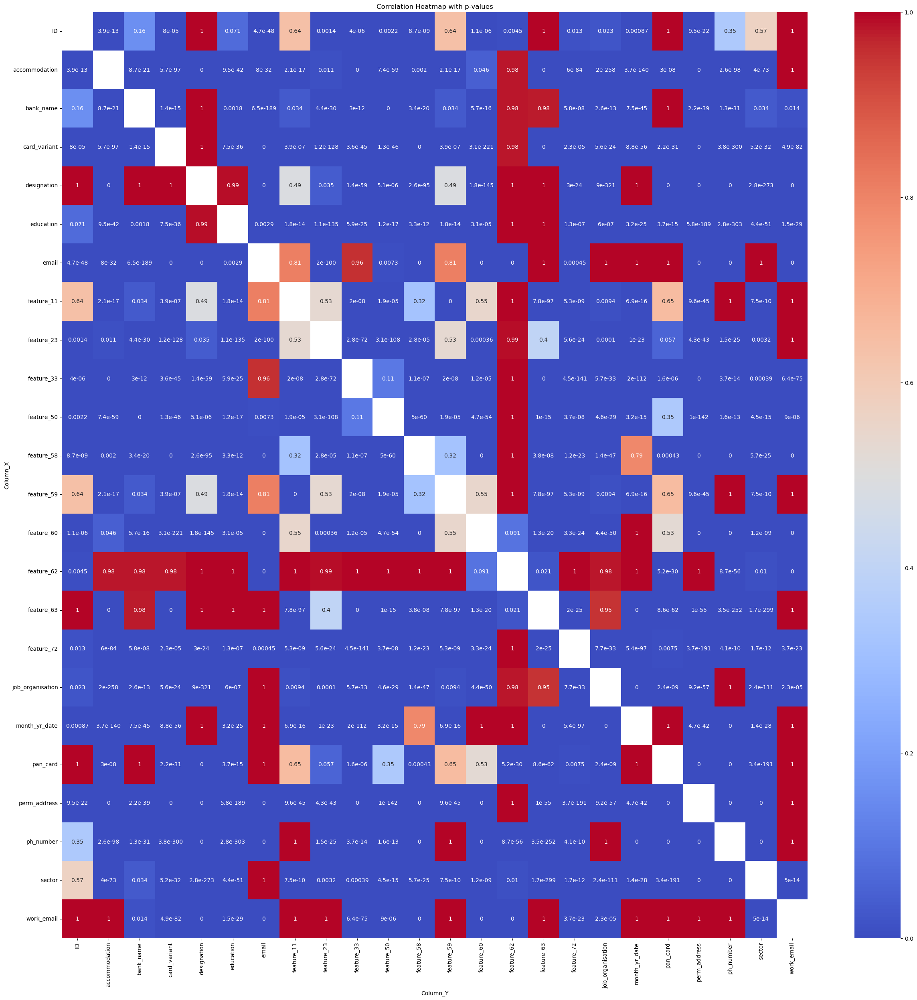

In [88]:
# Assuming correlation_results_df contains your correlation results
# Replace this with the DataFrame holding your correlation results
# correlation_results_df = ...

# Pivot the DataFrame for easier visualization
heatmap_data = correlation_results_df.pivot(index='Column_X', columns='Column_Y', values='p-value')

# Create a heatmap using Seaborn
plt.figure(figsize=(30,30))
sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', fmt='.2g')
plt.title('Correlation Heatmap with p-values')
plt.show()

# Insights :

### Many of  features have relatively lower positive correlations with the target. Whether to keep or drop them depends on your specific modeling objectives and the importance of these features in our domain Knowledge.

In [89]:
cat_notcorr=pd.DataFrame(not_correlated_columns)
cat_notcorr

,Column_X,Column_Y,p-value,correlation,degrees_of_freedom
10,card_variant,designation,1.000000,not correlated,33972
19,card_variant,feature_62,0.981284,not correlated,6
24,feature_11,pan_card,0.653550,not correlated,10609
25,feature_11,ph_number,1.000000,not correlated,3250
26,feature_11,feature_23,0.532752,not correlated,1
...,...,...,...,...,...
519,month_yr_date,work_email,1.000000,not correlated,590172
523,month_yr_date,feature_58,0.789947,not correlated,132
525,month_yr_date,feature_60,0.999997,not correlated,132
526,month_yr_date,feature_62,1.000000,not correlated,132


# List of categorical columns and we are trying to label it for better overview.

In [114]:
from sklearn.preprocessing import LabelEncoder
categorical_columns = ['card_variant', 'feature_11', 'pan_card', 'ph_number', 'feature_23',
       'email', 'education', 'accommodation', 'feature_33', 'job_organisation',
       'sector', 'designation', 'perm_address', 'work_email', 'ID',
       'feature_50', 'bank_name', 'feature_58', 'feature_59', 'feature_60',
       'feature_62', 'feature_72']

encoder = LabelEncoder()
for column in categorical_columns:
    g[f'{column}_encoded'] = encoder.fit_transform(g[column])


# Insights:

### we have used label encoder for categorical columns to convert the categories so that our models will be understanding it better.

In [95]:
g1=pd.DataFrame(g)
g1

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,card_variant,credit_score,feature_4,loan_amt,feature_11,feature_14,feature_19,pan_card,loan_end_dt/last_payment_dt,ph_number,feature_23,email,feature_25,feature_26,education,income,feature_31,accommodation,feature_33,feature_34,montly_expenses,job_organisation,sector,designation,feature_39,feature_40,feature_41,feature_42,perm_address,work_email,ID,feature_50,bank_name,feature_52,feature_53,feature_55,feature_56,feature_58,feature_59,feature_60,feature_62,feature_63,feature_64,feature_65,feature_67,feature_68,month_yr_date,feature_72,feature_76,feature_78,Bad_label,enq_amt,enq_purpose,card_variant_encoded,feature_11_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,feature_33_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,ID_encoded,feature_50_encoded,bank_name_encoded,feature_58_encoded,feature_59_encoded,feature_60_encoded,feature_62_encoded,feature_63_encoded,feature_72_encoded
0,2528846,4714857,121,21,2015-04-18,2015-04-13,Insignia,650.000000,2.0,500000.0,Y,0.0,1.0,ADFPNXXXXX,2065-09-03,98332XXXXX,N,@REDIFFMAIL.COM,1.0,2.0,Graduate,400610.0,0.0,Self,Y,2.0,90000.0,Private Ltd. Co.,Banking/Financial Services,MANAGER,0.0,0.0,0.0,0.0,Mumbai,@CODOGNOTTO.NET,PAN Card,Y,State Bank of India,0.0,2013-06-01,1.0,21.0,Y,Y,N,Y,1965-0,21.0,15.0,0.0,2.0,Nov-00,R,0.0,1.0,0,4981150,147,1,1,959,2513,0,473,5,4,1,6,1,2629,43,814,2,1,9,1,1,0,1,1,1
1,1000000,30754,20,2,2015-04-21,2015-04-21,Insignia,760.000000,1.0,1200000.0,Y,0.0,1.0,AJWPRXXXXX,2062-07-14,99455XXXXX,N,@GMAIL.COM,1.0,2.0,Graduate,560042.0,0.0,Self,Y,2.0,1.0,Private Ltd. Co.,Banking/Financial Services,MANAGER,0.0,0.0,0.0,0.0,Bangalore,@GMAIL.COM,PAN Card,N,HDFC Bank,0.0,2014-06-01,1.0,17.0,Y,Y,N,Y,1969-0,17.0,12.0,0.0,2.0,Nov-00,R,0.0,1.0,0,6676682006,1984,1,1,2963,2980,0,196,5,4,1,6,1,2629,6,1511,2,0,3,1,1,0,1,13,1
2,121523,17864,10,1,2015-04-22,2015-04-21,Insignia,774.000000,1.0,700000.0,Y,0.0,2.0,AFAPNXXXXX,2066-04-10,98456XXXXX,N,@SHOBANARAYAN.COM,1.0,0.0,Graduate,560042.0,0.0,Self,Y,2.0,1.0,Private Ltd. Co.,Banking/Financial Services,MANAGER,0.0,0.0,0.0,0.0,Bangalore,@GMAIL.COM,PAN Card,N,HDFC Bank,0.0,2014-06-01,3.0,17.0,N,Y,N,Y,1966-0,17.0,12.0,0.0,2.0,Nov-00,R,0.0,1.0,0,3400000,1,1,1,1460,2573,0,511,5,4,1,6,1,2629,6,1511,2,0,3,0,1,0,1,4,1
3,3000000,1845569,257,31,2015-04-25,2015-04-15,Insignia,770.000000,1.0,500000.0,Y,0.0,1.0,AAAPDXXXXX,2064-04-16,98220XXXXX,N,@VSNL.COM,1.0,3.0,Graduate,411001.0,0.0,Self,Y,2.0,100000.0,Private Ltd. Co.,Banking/Financial Services,MANAGER,0.0,0.0,0.0,0.0,Pune,@ALBAJ.COM,PAN Card,Y,HDFC Bank,0.0,2014-06-01,1.0,21.0,Y,Y,N,Y,1988-0,21.0,16.0,0.0,2.0,Nov-00,R,1.0,1.0,0,50810000,834,1,1,3,2459,0,603,5,4,1,6,1,2629,51,190,2,1,3,1,1,0,1,185,1
4,12662938,7973,62,7,2015-05-06,2015-04-30,Insignia,723.235945,3.0,500000.0,Y,0.0,1.0,ABEPSXXXXX,2054-01-03,98111XXXXX,N,@REDIFFMAIL.COM,1.0,3.0,Graduate,122009.0,0.0,Self,Y,2.0,300000.0,Private Ltd. Co.,Banking/Financial Services,MANAGER,0.0,0.0,0.0,0.0,Gurgaon,@GMAIL.COM,PAN Card,N,HDFC Bank,0.0,2014-06-01,1.0,13.0,Y,Y,N,Y,1995-0,13.0,3.0,0.0,2.0,Nov-00,R,0.0,1.0,0,2000,20,1,1,447,2402,0,473,5,4,1,6,1,2629,28,1511,2,0,3,1,1,0,1,256,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,185000,485225,74,13,2015-12-31,2015-12-10,Platinum Deligh,704.000000,1.0,119000.0,Y,12.0,1.0,CUQPSXXXXX,1988-10-12,98715XXXXX,N,@YAHOO.COM,2.0,0.0,Graduate,110045.0,10.0,Paren,Y,1.0,33000.0,Private Ltd. Co.,Others,SERVICE ASSOCIATE,2015.0,6.0,0.0,6.0,Gurgaon,@GMAIL.COM,PAN Card,Y,State Bank of India,99000.0,2015-01-01,1.0,10.0,N,Y,N,Y,1988-10,10.

# Here we were droping few of the colums that were not relevent.

In [115]:
w=g1.drop(['card_variant', 'feature_11', 'pan_card', 'ph_number', 'feature_23',
       'email', 'education', 'accommodation', 'feature_33', 'job_organisation',
       'sector', 'designation', 'perm_address', 'work_email', 'ID',
       'feature_50', 'bank_name', 'feature_58', 'feature_59', 'feature_60',
       'feature_62', 'feature_63', 'month_yr_date', 'feature_72'],axis=1)

# Basic Checks

In [97]:
w.head()

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,credit_score,feature_4,loan_amt,feature_14,feature_19,loan_end_dt/last_payment_dt,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_42,feature_52,feature_53,feature_55,feature_56,feature_64,feature_65,feature_67,feature_68,month_yr_date,feature_76,feature_78,Bad_label,enq_amt,enq_purpose,card_variant_encoded,feature_11_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,feature_33_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,ID_encoded,feature_50_encoded,bank_name_encoded,feature_58_encoded,feature_59_encoded,feature_60_encoded,feature_62_encoded,feature_63_encoded,feature_72_encoded
0,2528846,4714857,121,21,2015-04-18,2015-04-13,650.000000,2.0,500000.0,0.0,1.0,2065-09-03,1.0,2.0,400610.0,0.0,2.0,90000.0,0.0,0.0,0.0,0.0,0.0,2013-06-01,1.0,21.0,21.0,15.0,0.0,2.0,Nov-00,0.0,1.0,0,4981150,147,1,1,959,2513,0,473,5,4,1,6,1,2629,43,814,2,1,9,1,1,0,1,1,1
1,1000000,30754,20,2,2015-04-21,2015-04-21,760.000000,1.0,1200000.0,0.0,1.0,2062-07-14,1.0,2.0,560042.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,2014-06-01,1.0,17.0,17.0,12.0,0.0,2.0,Nov-00,0.0,1.0,0,6676682006,1984,1,1,2963,2980,0,196,5,4,1,6,1,2629,6,1511,2,0,3,1,1,0,1,13,1
2,121523,17864,10,1,2015-04-22,2015-04-21,774.000000,1.0,700000.0,0.0,2.0,2066-04-10,1.0,0.0,560042.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,2014-06-01,3.0,17.0,17.0,12.0,0.0,2.0,Nov-00,0.0,1.0,0,3400000,1,1,1,1460,2573,0,511,5,4,1,6,1,2629,6,1511,2,0,3,0,1,0,1,4,1
3,3000000,1845569,257,31,2015-04-25,2015-04-15,770.000000,1.0,500000.0,0.0,1.0,2064-04-16,1.0,3.0,411001.0,0.0,2.0,100000.0,0.0,0.0,0.0,0.0,0.0,2014-06-01,1.0,21.0,21.0,16.0,0.0,2.0,Nov-00,1.0,1.0,0,50810000,834,1,1,3,2459,0,603,5,4,1,6,1,2629,51,190,2,1,3,1,1,0,1,185,1
4,12662938,7973,62,7,2015-05-06,2015-04-30,723.235945,3.0,500000.0,0.0,1.0,2054-01-03,1.0,3.0,122009.0,0.0,2.0,300000.0,0.0,0.0,0.0,0.0,0.0,2014-06-01,1.0,13.0,13.0,3.0,0.0,2.0,Nov-00,0.0,1.0,0,2000,20,1,1,447,2402,0,473,5,4,1,6,1,2629,28,1511,2,0,3,1,1,0,1,256,1


In [98]:
w.tail()

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,credit_score,feature_4,loan_amt,feature_14,feature_19,loan_end_dt/last_payment_dt,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_42,feature_52,feature_53,feature_55,feature_56,feature_64,feature_65,feature_67,feature_68,month_yr_date,feature_76,feature_78,Bad_label,enq_amt,enq_purpose,card_variant_encoded,feature_11_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,feature_33_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,ID_encoded,feature_50_encoded,bank_name_encoded,feature_58_encoded,feature_59_encoded,feature_60_encoded,feature_62_encoded,feature_63_encoded,feature_72_encoded
23891,185000,485225,74,13,2015-12-31,2015-12-10,704.000000,1.0,119000.0,12.0,1.0,1988-10-12,2.0,0.0,110045.0,10.0,1.0,33000.0,2015.0,6.0,0.0,6.0,99000.0,2015-01-01,1.0,10.0,10.0,157.0,0.0,1.0,0-0,0.0,1.0,0,1570344,116,3,1,9780,2666,0,622,5,2,1,6,7,4076,28,1511,2,1,9,0,1,0,1,187,1
23892,27314,16393,10,1,2015-12-17,2015-11-16,723.235945,2.0,35000.0,12.0,1.0,1987-02-01,2.0,0.0,110037.0,12.0,1.0,1.0,2012.0,12.0,3.0,0.0,0.0,2014-06-01,1.0,10.0,33.0,102.0,1.0,1.0,0-0,0.0,1.0,0,239010,110,3,1,10301,2847,0,196,5,3,0,6,7,1678,47,1511,2,0,3,0,1,0,1,470,0
23893,20500,2077,26,3,2015-11-04,2015-09-24,748.000000,3.0,68000.0,12.0,1.0,1986-11-08,2.0,0.0,110033.0,0.0,1.0,1.0,2015.0,1.0,3.0,0.0,52000.0,2014-09-01,1.0,10.0,10.0,157.0,0.0,1.0,0-0,0.0,1.0,0,102000,40,4,1,9633,2857,1,196,5,2,1,6,2,3916,28,73,2,1,3,0,1,0,1,159,1
23894,400000,370758,42,9,2015-11-03,2015-09-30,740.000000,3.0,158000.0,12.0,1.0,1982-11-24,1.0,0.0,110095.0,0.0,2.0,25000.0,0.0,0.0,0.0,0.0,65000.0,2014-04-01,2.0,10.0,10.0,157.0,0.0,2.0,03-May,0.0,1.0,0,727000,62,3,1,6015,1388,0,196,5,4,1,6,1,2629,47,1511,2,1,2,0,1,0,1,414,1
23895,1150000,903562,35,7,2015-12-04,2015-11-06,688.000000,1.0,106000.0,0.0,1.0,1983-08-15,1.0,0.0,201005.0,0.0,2.0,1.0,0.0,0.0,0.0,0.0,106000.0,2015-02-01,1.0,33.0,33.0,41.0,0.0,2.0,Aug-00,0.0,1.0,0,11402001,93,6,1,2794,2216,0,196,5,2,1,6,1,2629,25,1511,2,1,9,0,1,0,1,352,1


In [99]:
w.shape

(23896, 59)

In [299]:
w.descibe()

AttributeError: 'DataFrame' object has no attribute 'descibe'

In [100]:
w.columns

Index(['high_credit_amt', 'cur_balance_amt', 'acct_type', 'owner_indic',
       'dt_opened', 'entry_time', 'credit_score', 'feature_4', 'loan_amt',
       'feature_14', 'feature_19', 'loan_end_dt/last_payment_dt', 'feature_25',
       'feature_26', 'income', 'feature_31', 'feature_34', 'montly_expenses',
       'feature_39', 'feature_40', 'feature_41', 'feature_42', 'feature_52',
       'feature_53', 'feature_55', 'feature_56', 'feature_64', 'feature_65',
       'feature_67', 'feature_68', 'month_yr_date', 'feature_76', 'feature_78',
       'Bad_label', 'enq_amt', 'enq_purpose', 'card_variant_encoded',
       'feature_11_encoded', 'pan_card_encoded', 'ph_number_encoded',
       'feature_23_encoded', 'email_encoded', 'education_encoded',
       'accommodation_encoded', 'feature_33_encoded',
       'job_organisation_encoded', 'sector_encoded', 'designation_encoded',
       'perm_address_encoded', 'work_email_encoded', 'ID_encoded',
       'feature_50_encoded', 'bank_name_encoded', 'featu

In [101]:
w.info() # Basic checks

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23896 entries, 0 to 23895
Data columns (total 59 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   high_credit_amt              23896 non-null  int64         
 1   cur_balance_amt              23896 non-null  int64         
 2   acct_type                    23896 non-null  int64         
 3   owner_indic                  23896 non-null  int64         
 4   dt_opened                    23896 non-null  datetime64[ns]
 5   entry_time                   23896 non-null  datetime64[ns]
 6   credit_score                 23896 non-null  float64       
 7   feature_4                    23896 non-null  float64       
 8   loan_amt                     23896 non-null  float64       
 9   feature_14                   23896 non-null  float64       
 10  feature_19                   23896 non-null  float64       
 11  loan_end_dt/last_payment_dt  23896 non-nu

In [102]:
w.isnull().sum()

high_credit_amt                0
cur_balance_amt                0
acct_type                      0
owner_indic                    0
dt_opened                      0
entry_time                     0
credit_score                   0
feature_4                      0
loan_amt                       0
feature_14                     0
feature_19                     0
loan_end_dt/last_payment_dt    0
feature_25                     0
feature_26                     0
income                         0
feature_31                     0
feature_34                     0
montly_expenses                0
feature_39                     0
feature_40                     0
feature_41                     0
feature_42                     0
feature_52                     0
feature_53                     0
feature_55                     0
feature_56                     0
feature_64                     0
feature_65                     0
feature_67                     0
feature_68                     0
month_yr_d

In [105]:
print(type(w))

<class 'pandas.core.frame.DataFrame'>


In [116]:
w = w.astype('int64')


print(w.dtypes)

high_credit_amt                int64
cur_balance_amt                int64
acct_type                      int64
owner_indic                    int64
dt_opened                      int64
entry_time                     int64
credit_score                   int64
feature_4                      int64
loan_amt                       int64
feature_14                     int64
feature_19                     int64
loan_end_dt/last_payment_dt    int64
feature_25                     int64
feature_26                     int64
income                         int64
feature_31                     int64
feature_34                     int64
montly_expenses                int64
feature_39                     int64
feature_40                     int64
feature_41                     int64
feature_42                     int64
feature_52                     int64
feature_53                     int64
feature_55                     int64
feature_56                     int64
feature_64                     int64
f

# Handling the Outliers :

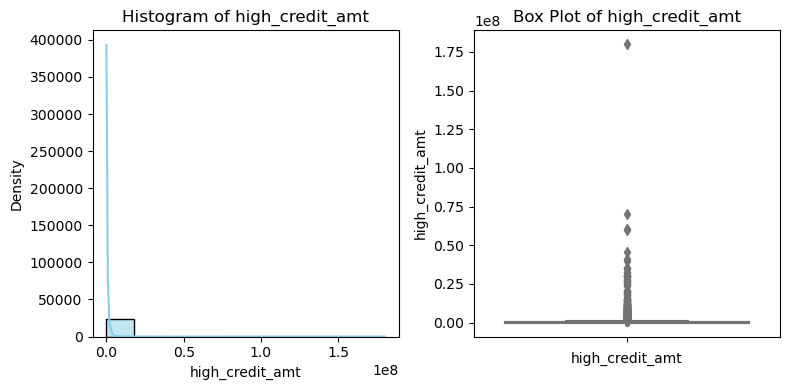

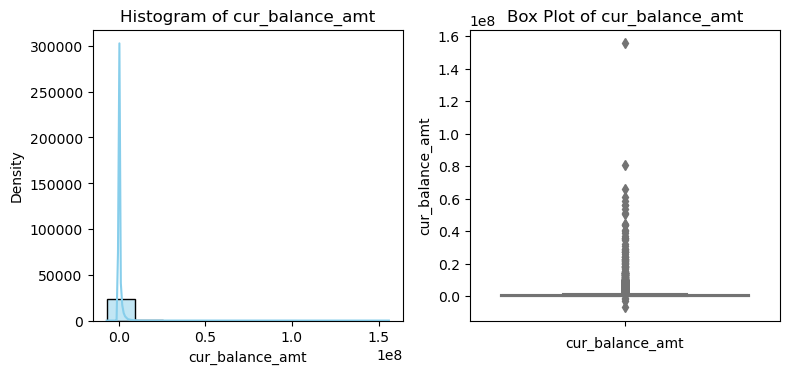

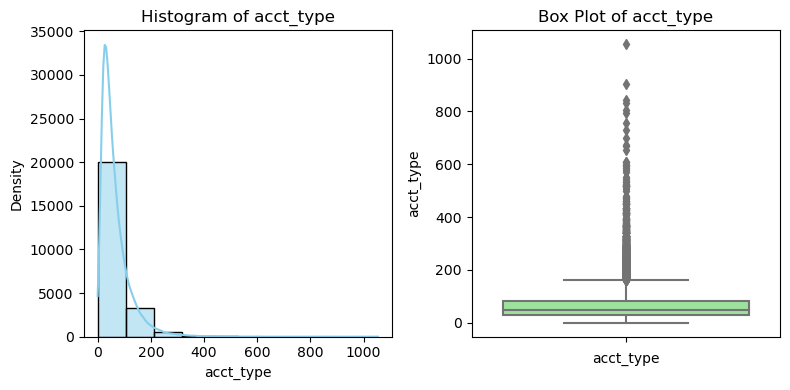

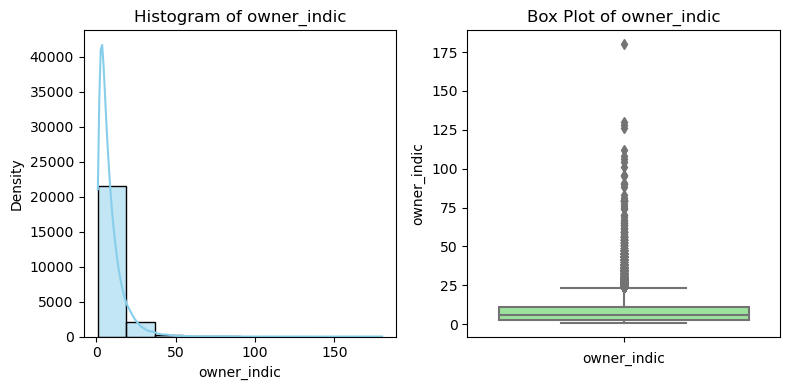

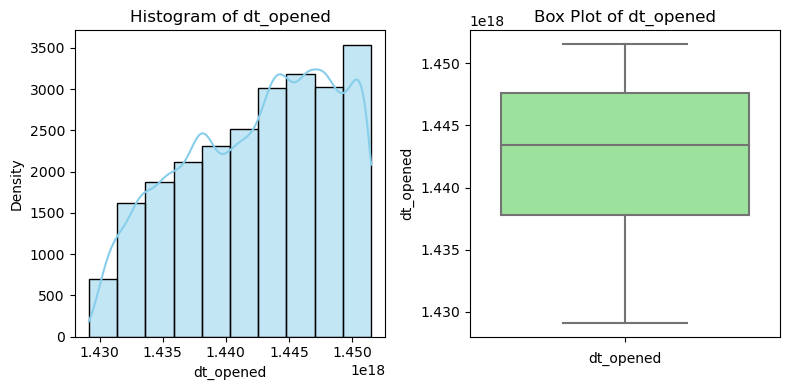

...

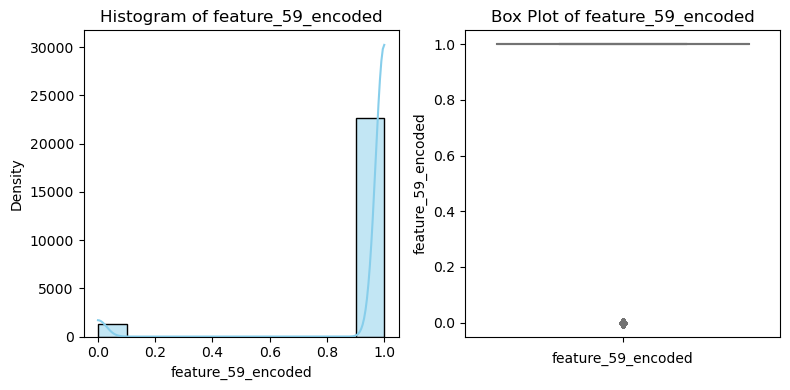

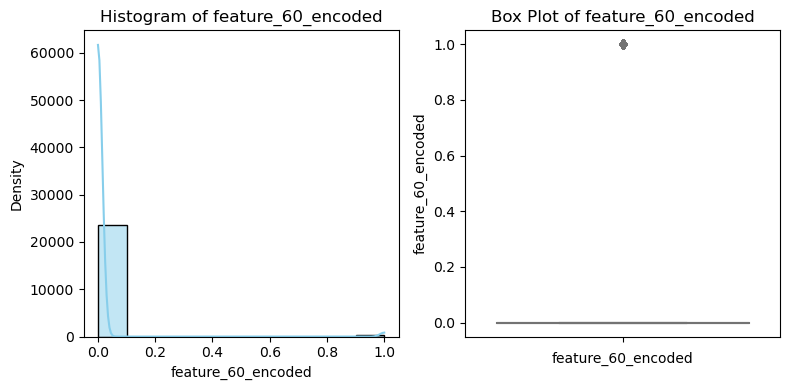

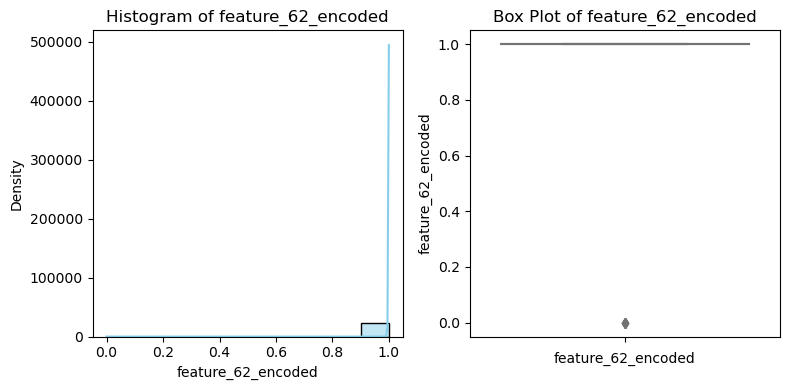

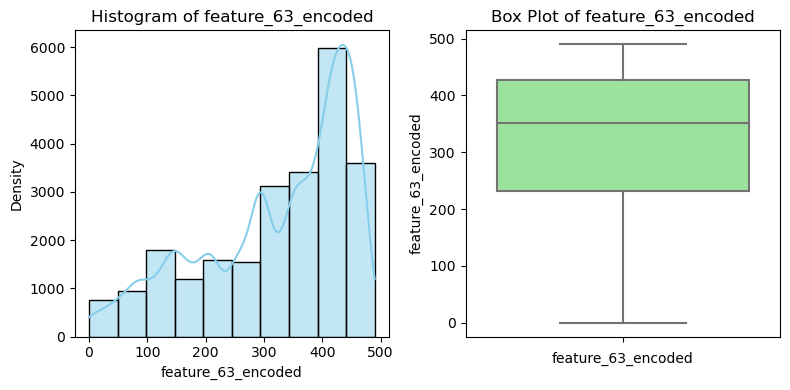

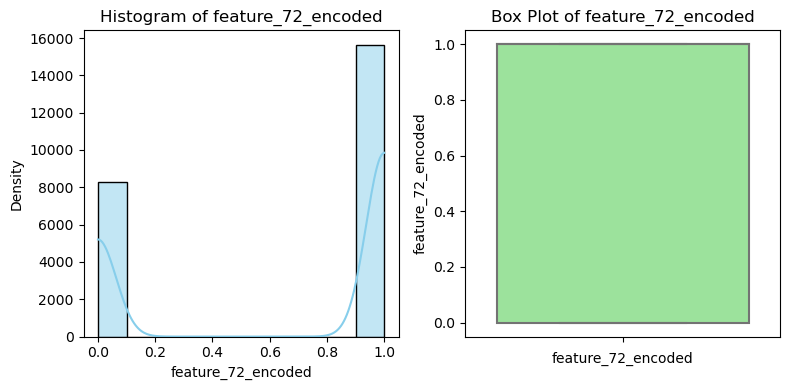

In [117]:
for column in w.columns:
    fig, axs = plt.subplots(1, 2, figsize=(8,4))  # Set a smaller figure size

    
    sns.histplot(w[column], bins=10, kde=True, color='skyblue', edgecolor='black', ax=axs[0])  # Adjust bins as needed
    axs[0].set_title(f"Histogram of {column}")
    axs[0].set_xlabel(column)
    axs[0].set_ylabel("Density")

    
    sns.boxplot(y=w[column], color='lightgreen', ax=axs[1])  # Use y= for vertical box plot
    axs[1].set_title(f"Box Plot of {column}")
    axs[1].set_xlabel(column)

    plt.tight_layout()  # Adjust subplot parameters to give specified padding
    plt.show()  # Show the combined plot for each column


# Set your desired Skewness Threshold here :

In [118]:
skewness_threshold = 0.5  

skewness_info = {}  # Dictionary to store skewness information
                           
for column in w.columns: # Calculate skewness for each column
    skewness = w[column].skew()  # Calculate skewness using Pandas
    skewness_info[column] = skewness  # Store skewness in the dictionary

# Classify columns based on skewness
normal_dist = []
left_skewed = []
right_skewed = []

for column, skewness in skewness_info.items():
    if abs(skewness) <= skewness_threshold:
        normal_dist.append(column)
    elif skewness < -skewness_threshold:
        left_skewed.append(column)
    else:
        right_skewed.append(column)


print("Columns with Normal Distribution:")
print(normal_dist)
print("\nColumns with Left Skewed Distribution:")
print(left_skewed)
print("\nColumns with Right Skewed Distribution:")
print(right_skewed)


Columns with Normal Distribution:
['dt_opened', 'entry_time', 'feature_41', 'pan_card_encoded', 'designation_encoded', 'feature_50_encoded']

Columns with Left Skewed Distribution:
['credit_score', 'feature_4', 'feature_14', 'feature_39', 'feature_53', 'feature_11_encoded', 'ph_number_encoded', 'accommodation_encoded', 'feature_33_encoded', 'job_organisation_encoded', 'perm_address_encoded', 'ID_encoded', 'feature_59_encoded', 'feature_62_encoded', 'feature_63_encoded', 'feature_72_encoded']

Columns with Right Skewed Distribution:
['high_credit_amt', 'cur_balance_amt', 'acct_type', 'owner_indic', 'loan_amt', 'feature_19', 'loan_end_dt/last_payment_dt', 'feature_25', 'feature_26', 'income', 'feature_31', 'feature_34', 'montly_expenses', 'feature_40', 'feature_42', 'feature_52', 'feature_55', 'feature_56', 'feature_64', 'feature_65', 'feature_67', 'feature_68', 'feature_76', 'feature_78', 'Bad_label', 'enq_amt', 'enq_purpose', 'card_variant_encoded', 'feature_23_encoded', 'email_encoded

#  Setting the Threshold value to : 0.85

In [119]:
def correlation(w,threshold):
    col_corr=set()  # creating empty set
    corr_matrix = w.corr().abs()
    for i in range (len(corr_matrix.columns)): #abs for absolute error
        for j in range(i):
            if corr_matrix.iloc[i,j] > threshold:
                colname=corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
    return col_corr


corr_feature=correlation(w,0.85)
len(set(corr_feature))

corr_feature

{'cur_balance_amt',
 'entry_time',
 'feature_33_encoded',
 'feature_39',
 'feature_55',
 'feature_59_encoded',
 'feature_68',
 'owner_indic'}

# Insights:


### Variance Threshold: Variance Threshold is a simple filter method that removes features with low variance. It's particularly useful for datasets where features have similar scales and units. 

### Features with low variance indicate that they don't vary much across the dataset and may not contain much useful information for prediction.

### By setting a threshold, you can remove features with variance below that threshold, keeping only those with higher variance. This method is often applied to remove constant or near-constant features.

# Droping the columns that were more Correlated :

In [120]:
w.drop(columns=corr_feature)

,high_credit_amt,acct_type,dt_opened,credit_score,feature_4,loan_amt,feature_14,feature_19,loan_end_dt/last_payment_dt,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_40,feature_41,feature_42,feature_52,feature_53,feature_56,feature_64,feature_65,feature_67,feature_76,feature_78,Bad_label,enq_amt,enq_purpose,card_variant_encoded,feature_11_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,ID_encoded,feature_50_encoded,bank_name_encoded,feature_58_encoded,feature_60_encoded,feature_62_encoded,feature_63_encoded,feature_72_encoded
0,2528846,121,1429315200000000000,650,2,500000,0,1,3019161600000000000,1,2,400610,0,2,90000,0,0,0,0,1370044800000000000,21,21,15,0,0,1,0,4981150,147,1,1,959,2513,0,473,5,4,6,1,2629,43,814,2,1,9,1,0,1,1,1
1,1000000,20,1429574400000000000,760,1,1200000,0,1,2920060800000000000,1,2,560042,0,2,1,0,0,0,0,1401580800000000000,17,17,12,0,0,1,0,6676682006,1984,1,1,2963,2980,0,196,5,4,6,1,2629,6,1511,2,0,3,1,0,1,13,1
2,121523,10,1429660800000000000,774,1,700000,0,2,3038083200000000000,1,0,560042,0,2,1,0,0,0,0,1401580800000000000,17,17,12,0,0,1,0,3400000,1,1,1,1460,2573,0,511,5,4,6,1,2629,6,1511,2,0,3,0,0,1,4,1
3,3000000,257,1429920000000000000,770,1,500000,0,1,2975529600000000000,1,3,411001,0,2,100000,0,0,0,0,1401580800000000000,21,21,16,0,1,1,0,50810000,834,1,1,3,2459,0,603,5,4,6,1,2629,51,190,2,1,3,1,0,1,185,1
4,12662938,62,1430870400000000000,723,3,500000,0,1,2651011200000000000,1,3,122009,0,2,300000,0,0,0,0,1401580800000000000,13,13,3,0,0,1,0,2000,20,1,1,447,2402,0,473,5,4,6,1,2629,28,1511,2,0,3,1,0,1,256,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
23891,185000,74,1451520000000000000,704,1,119000,12,1,592617600000000000,2,0,110045,10,1,33000,6,0,6,99000,1420070400000000000,10,10,157,0,0,1,0,1570344,116,3,1,9780,2666,0,622,5,2,6,7,4076,28,1511,2,1,9,0,0,1,187,1
23892,27314,10,1450310400000000000,723,2,35000,12,1,539136000000000000,2,0,110037,12,1,1,12,3,0,0,1401580800000000000,10,33,102,1,0,1,0,239010,110,3,1,10301,2847,0,196,5,3,6,7,1678,47,1511,2,0,3,0,0,1,470,0
23893,20500,26,1446595200000000000,748,3,68000,12,1,531792000000000000,2,0,110033,0,1,1,1,3,0,52000,1409529600000000000,10,10,157,0,0,1,0,102000,40,4,1,9633,2857,1,196,5,2,6,2,3916,28,73,2,1,3,0,0,1,159,1
23894,400000,42,1446508800000000000,740,3,158000,12,1,406944000000000000,1,0,110095,0,2,25000,0,0,0,65000,1396310400000000000,10,10,157,0,0,1,0,727000,62,3,1,6015,1388,0,196,5,4,6,1,2629,47,1511,2,1,2,0,0,1,414,1


In [121]:
w.Bad_label.value_counts()

0    22892
1     1004
Name: Bad_label, dtype: int64

# Feature Selection

In [122]:
x=w.drop(['Bad_label'],axis=1)
y=w['Bad_label']
from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

# Scaling the Data : Using the MinMax Scalar

In [123]:
from sklearn.preprocessing import MinMaxScaler

# Check if x_train and x_test are not DataFrames, convert them if needed
if not isinstance(x_train, pd.DataFrame):
    x_train = pd.DataFrame(x_train)

if not isinstance(x_test, pd.DataFrame):
    x_test = pd.DataFrame(x_test)

scaler = MinMaxScaler(copy=False)  # Set copy=False to retain the index
x_train_scaled = scaler.fit_transform(x_train)
x_test_scaled = scaler.transform(x_test)

# Create DataFrames with original index and column names
x_train_scaled = pd.DataFrame(x_train_scaled, columns=x_train.columns, index=x_train.index)
x_test_scaled = pd.DataFrame(x_test_scaled, columns=x_test.columns, index=x_test.index)


In [124]:
x_train_scaled.shape

(19116, 57)

In [125]:
x_test_scaled.shape

(4780, 57)

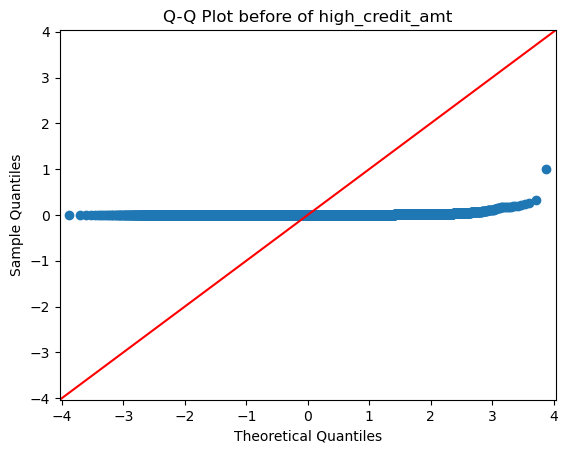

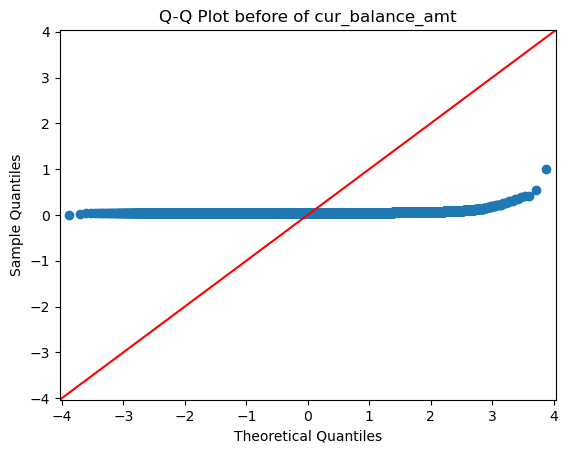

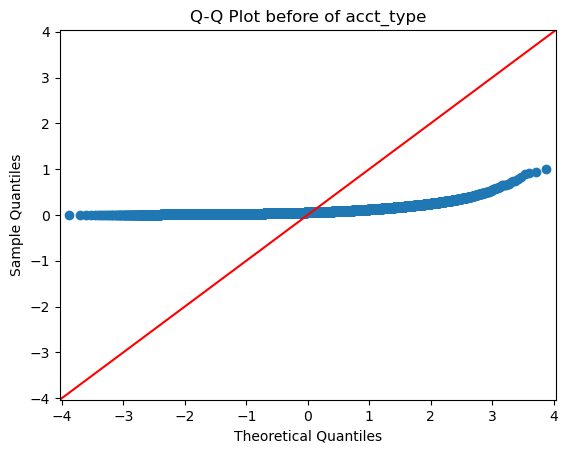

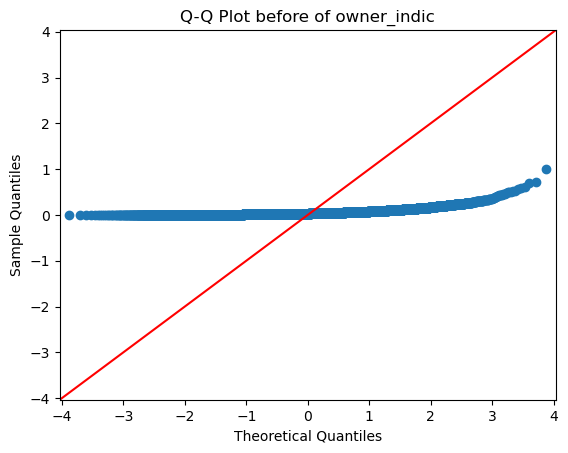

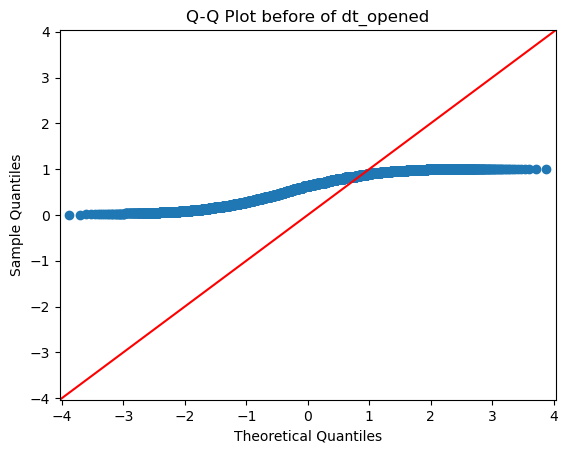

...

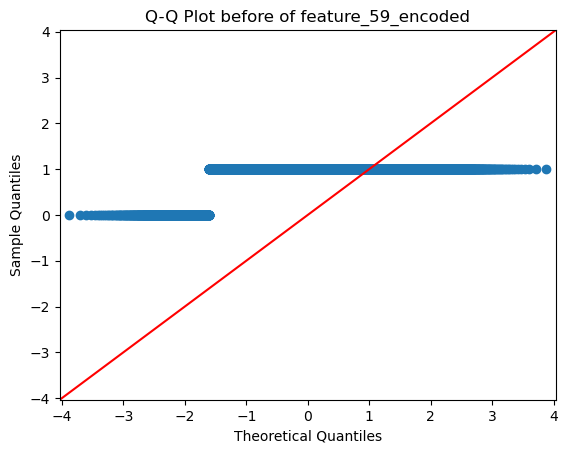

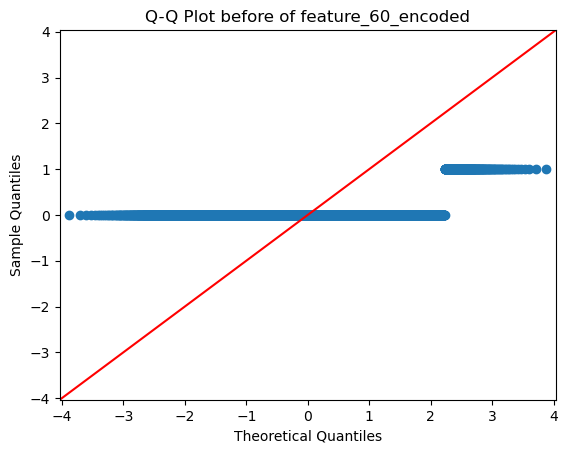

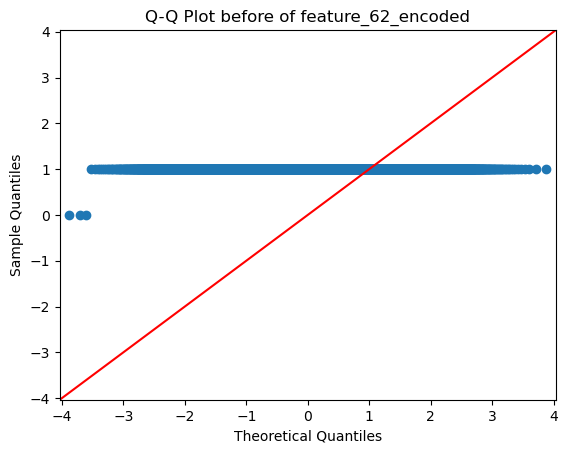

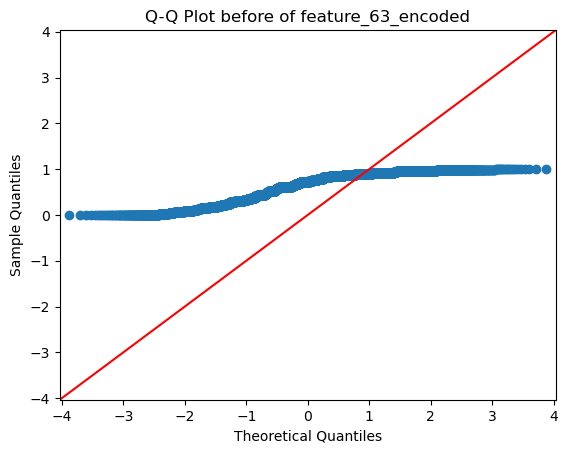

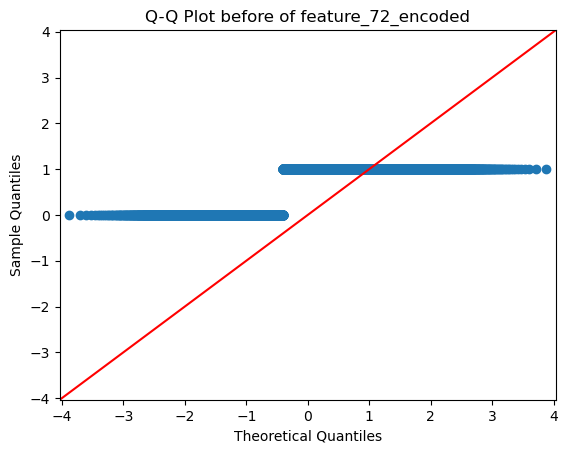

In [126]:
import statsmodels.api as sm
for column in x_train_scaled.columns:
    fig = sm.qqplot( x_train_scaled[column], line='45')  # Create Q-Q plot for the column
    plt.title(f"Q-Q Plot before of {column}")
    plt.show()  # Show the Q-Q plot for each column

 # Function to detect and handle outliers using IQR


In [127]:
import numpy as np

def handle_outliers_iqr(data):
    Q1 = np.percentile(data, 25)
    Q3 = np.percentile(data, 75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    data_clipped = np.clip(data, lower_bound, upper_bound)
    return data_clipped


columns_n=['dt_opened', 'entry_time', 'feature_41', 'pan_card_encoded', 'designation_encoded', 'feature_50_encoded']


for column in columns_n:
    x_train_scaled[column] = handle_outliers_iqr(x_train_scaled[column])
    x_test_scaled[column] = handle_outliers_iqr(x_test_scaled[column])


# Using Power_Transformer :

In [128]:
from sklearn.preprocessing import PowerTransformer
from scipy.stats.mstats import winsorize

columns_l = ['credit_score', 'feature_4', 'feature_14', 'feature_39', 'feature_53', 'feature_11_encoded',
             'ph_number_encoded', 'accommodation_encoded', 'feature_33_encoded', 'job_organisation_encoded',
             'perm_address_encoded', 'ID_encoded', 'feature_59_encoded', 'feature_62_encoded', 'feature_72_encoded']

# Assuming 'x_train_scaled' and 'x_test_scaled' are your scaled training and testing datasets

# Winsorization for outlier handling
for column in columns_l:
    x_train_scaled[column] = winsorize(x_train_scaled[column], limits=(0.05, 0.05))
    x_test_scaled[column] = winsorize(x_test_scaled[column], limits=(0.05, 0.05))

# Applying Yeo-Johnson transformation to reduce skewness on training data
pt = PowerTransformer(method='yeo-johnson', standardize=False)  # Instantiate PowerTransformer
x_train_scaled[columns_l] = pt.fit_transform(x_train_scaled[columns_l])  # Fit and transform on training data

# Verify the transformation effect on skewness after applying Yeo-Johnson on training data
skewness_after = pd.DataFrame(x_train_scaled[columns_l]).skew()
print(skewness_after)

# Apply the same transformation to testing data
x_test_scaled[columns_l] = pt.transform(x_test_scaled[columns_l])  # Transform testing data using fitted transformer

# Verify the transformation effect on skewness after applying Yeo-Johnson on testing data
skewness_after_test = pd.DataFrame(x_test_scaled[columns_l]).skew()
print(skewness_after_test)


credit_score                0.028132
feature_4                  -0.564514
feature_14                 -1.350311
feature_39                 -1.227333
feature_53                 -0.462408
feature_11_encoded         -3.945237
ph_number_encoded          -0.230125
accommodation_encoded      -0.204163
feature_33_encoded         -1.621460
job_organisation_encoded   -0.088826
perm_address_encoded       -0.480384
ID_encoded                  0.000000
feature_59_encoded         -3.945237
feature_62_encoded          0.000000
feature_72_encoded         -0.663167
dtype: float64
credit_score               -0.018838
feature_4                  -0.617850
feature_14                 -1.338507
feature_39                 -1.258484
feature_53                 -0.421919
feature_11_encoded          0.000000
ph_number_encoded          -0.255849
accommodation_encoded      -0.231094
feature_33_encoded         -1.659750
job_organisation_encoded   -0.124458
perm_address_encoded       -0.424278
ID_encoded             

 # Apply log transformation and winsorization to the columns


In [129]:
columns_r = ['high_credit_amt', 'cur_balance_amt', 'acct_type', 'owner_indic', 'loan_amt', 'feature_19',
             'loan_end_dt/last_payment_dt', 'feature_25', 'feature_26', 'income', 'feature_31', 'feature_34',
             'montly_expenses', 'feature_40', 'feature_42', 'feature_52', 'feature_55', 'feature_56',
             'feature_64', 'feature_65', 'feature_67', 'feature_68', 'feature_76', 'feature_78', 
             'enq_amt', 'enq_purpose', 'card_variant_encoded', 'feature_23_encoded', 'email_encoded',
             'education_encoded', 'sector_encoded', 'work_email_encoded', 'bank_name_encoded', 'feature_58_encoded',
             'feature_60_encoded']

for column in columns_r:
    # Log transformation with a small value (1) added to handle zero and negative values
    x_train_scaled[column] = np.log(x_train_scaled[column] + 1)
    x_test_scaled[column] = np.log(x_test_scaled[column] + 1)

    # Winsorization to handle outliers after log transformation
    x_train_scaled[column] = winsorize(x_train_scaled[column], limits=(0.05, 0.05))
    x_test_scaled[column] = winsorize(x_test_scaled[column], limits=(0.05, 0.05))

# Verify the effect on skewness after applying transformations
skewness_after_train = pd.DataFrame(x_train_scaled[columns_r]).skew()
skewness_after_test = pd.DataFrame(x_test_scaled[columns_r]).skew()
print("Skewness after log transformation and winsorization (Training):")
print(skewness_after_train)
print("\nSkewness after log transformation and winsorization (Testing):")
print(skewness_after_test)


Skewness after log transformation and winsorization (Training):
high_credit_amt                2.089046
cur_balance_amt                2.075978
acct_type                      1.033695
owner_indic                    1.104290
loan_amt                       0.886839
feature_19                     0.000000
loan_end_dt/last_payment_dt    2.122029
feature_25                     1.271972
feature_26                     1.032720
income                         0.980146
feature_31                     3.215223
feature_34                     1.229740
montly_expenses                0.374423
feature_40                     0.651007
feature_42                     0.000000
feature_52                     1.065445
feature_55                     4.121741
feature_56                     0.865580
feature_64                     0.603850
feature_65                     1.840109
feature_67                     1.621460
feature_68                     1.229740
feature_76                     0.000000
feature_78      

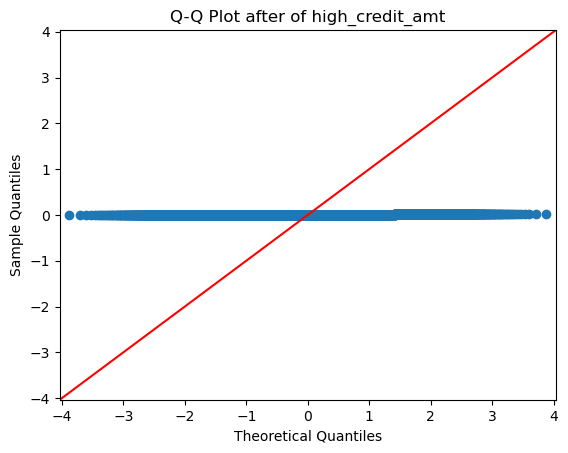

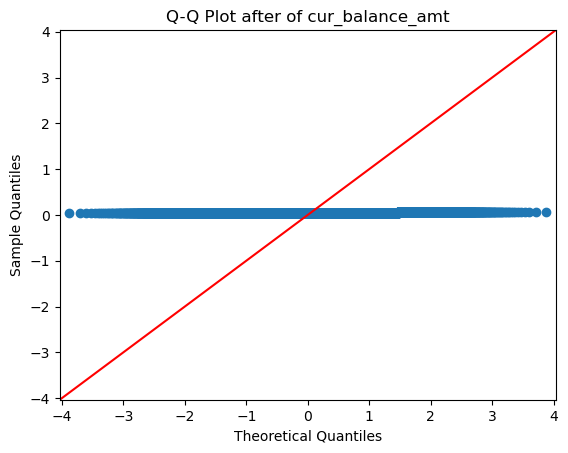

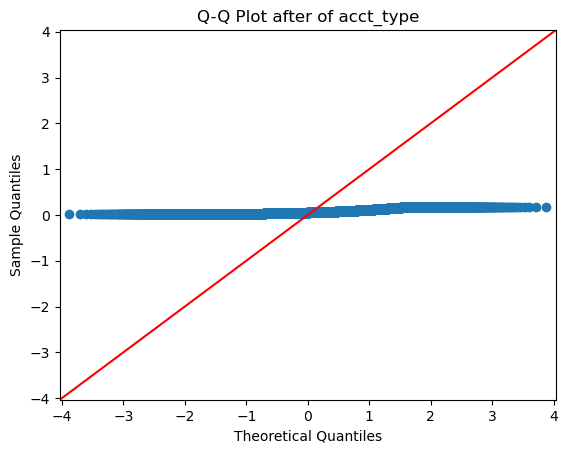

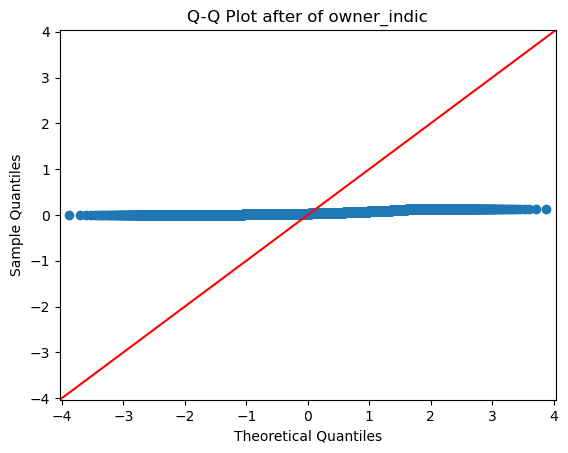

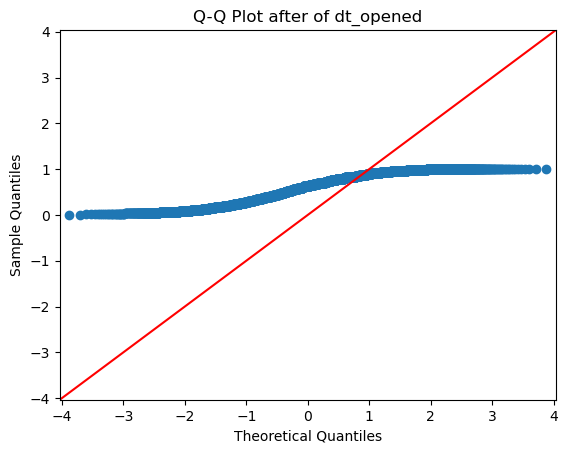

...

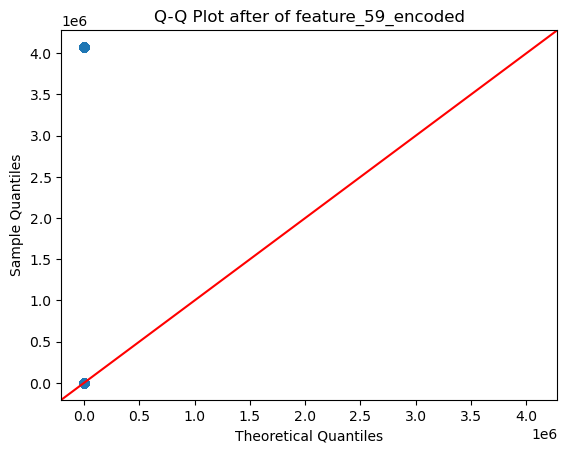

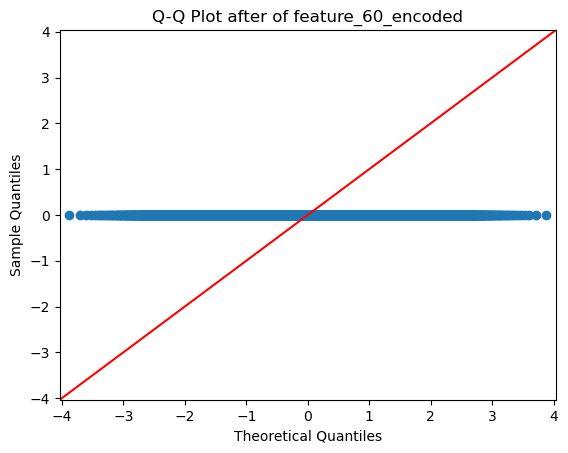

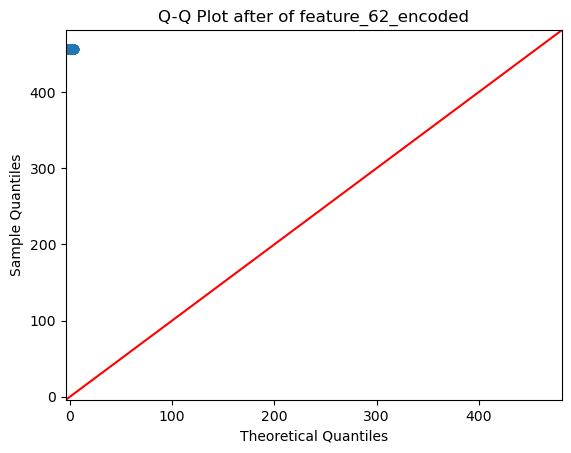

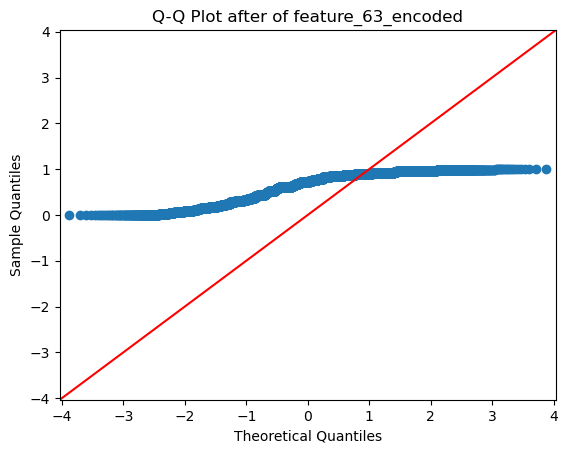

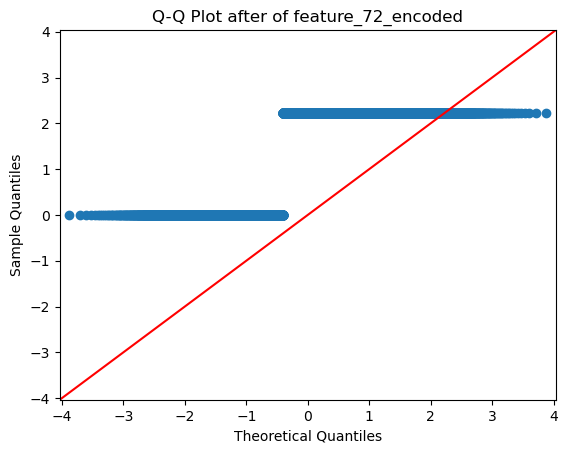

In [130]:
for column in x_train_scaled.columns:
    fig = sm.qqplot( x_train_scaled[column], line='45')  # Create Q-Q plot for the column
    plt.title(f"Q-Q Plot after of {column}")
    plt.show()  # Show the Q-Q plot for each column

# Smoting Technique :

In [131]:
from imblearn.over_sampling import SMOTE

# Create an instance of SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to generate synthetic samples
x_train_scaled, y_train = smote.fit_resample(x_train_scaled, y_train)


# Function to detect the Duplicated_Columns :

In [132]:
def get_duplicate_columns(m):
    
    duplicate_columns = {}
    seen_columns = {}

    for column in m.columns:
        current_column = m[column]

        # Convert column data to bytes
        try:
            current_column_hash = current_column.values.tobytes()
        except AttributeError:
            current_column_hash = current_column.to_string().encode()

        if current_column_hash in seen_columns:
            if seen_columns[current_column_hash] in duplicate_columns:
                duplicate_columns[seen_columns[current_column_hash]].append(column)
            else:
                duplicate_columns[seen_columns[current_column_hash]] = [column]
        else:
            seen_columns[current_column_hash] = column

    return duplicate_columns
duplicate_columns = get_duplicate_columns(x_train_scaled)
duplicate_columns


{'feature_19': ['feature_42',
  'feature_76',
  'feature_78',
  'feature_58_encoded',
  'feature_60_encoded'],
 'feature_34': ['feature_68'],
 'feature_11_encoded': ['feature_59_encoded']}

In [133]:
x_train_scaled

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,credit_score,feature_4,loan_amt,feature_14,feature_19,loan_end_dt/last_payment_dt,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_42,feature_52,feature_53,feature_55,feature_56,feature_64,feature_65,feature_67,feature_68,feature_76,feature_78,enq_amt,enq_purpose,card_variant_encoded,feature_11_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,feature_33_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,ID_encoded,feature_50_encoded,bank_name_encoded,feature_58_encoded,feature_59_encoded,feature_60_encoded,feature_62_encoded,feature_63_encoded,feature_72_encoded
0,0.001970,0.042319,0.040157,0.016621,0.864865,0.827692,0.149139,0.753201,0.066421,11.398825,0.0,0.135101,0.693147,0.000000,0.140719,0.000000,0.000000,0.002331,8.203996,0.405465,0.909091,0.0,0.000000,4.812098e+19,0.0,0.662376,0.287682,0.008854,0.693147,0.000000,0.0,0.0,0.000096,0.011094,0.405465,4.076506e+06,0.677632,1.441792,0.000000,0.240765,0.635989,1.543704,0.000000,3.903802,0.095310,0.949135,1.233866,0.291199,0.243641,0.0,0.287682,0.0,4.076506e+06,0.0,456.303981,0.791837,2.232027
1,0.002073,0.045449,0.039093,0.022100,0.756757,0.670769,0.148494,2.124169,0.059343,11.398825,0.0,0.104374,0.000000,0.000000,0.140719,0.000000,0.000000,0.002331,8.262007,0.559616,0.090909,0.0,0.022773,7.794072e+19,0.0,0.662376,0.662376,0.003989,0.000000,0.000000,0.0,0.0,0.000137,0.016376,0.405465,0.000000e+00,0.863701,0.288087,0.000000,0.240765,0.441833,0.825102,25.072958,2.760087,0.530628,0.464324,6.994469,0.291199,0.243641,1.0,0.693147,0.0,0.000000e+00,0.0,456.303981,0.600000,0.000000
2,0.000833,0.042648,0.052842,0.038361,0.837838,0.827692,0.149065,0.000000,0.075005,11.398825,0.0,0.116511,0.000000,0.000000,0.000133,0.000000,0.000000,0.000000,8.250379,0.348307,0.909091,0.0,0.013151,5.419506e+19,0.0,0.217065,0.217065,0.015469,0.000000,0.000000,0.0,0.0,0.000193,0.014178,0.510826,4.076506e+06,0.602696,0.240430,0.000000,0.240765,0.441833,0.825102,25.072958,3.903802,0.095310,0.817379,6.547450,0.291199,0.243641,1.0,0.287682,0.0,4.076506e+06,0.0,456.303981,0.767347,0.000000
3,0.000235,0.042198,0.025152,0.005571,0.490347,0.556923,0.149247,2.124169,0.058553,11.398825,0.0,0.159651,0.000000,0.182322,0.000128,0.000000,0.000000,0.002796,8.215572,0.154151,0.545455,0.0,0.000000,4.812098e+19,0.0,0.217065,0.662376,0.061148,0.693147,0.000000,0.0,0.0,0.000021,0.016156,0.405465,4.076506e+06,0.967480,2.294299,0.000000,0.240765,0.441833,1.543704,0.000000,2.760087,0.095310,0.527729,6.547450,0.168052,0.243641,0.0,0.287682,0.0,4.076506e+06,0.0,456.303981,0.924490,2.232027
4,0.002774,0.045028,0.012108,0.016621,0.316602,0.310769,0.149139,2.124169,0.023998,11.398825,0.0,0.665272,0.000000,0.262364,0.019730,0.000000,0.000000,0.000000,8.262007,0.080043,1.000000,0.0,0.000000,4.812098e+19,0.0,0.287682,0.287682,0.000699,0.000000,0.000000,0.0,0.0,0.000417,0.010211,0.693147,4.076506e+06,0.819304,1.415658,0.693147,0.648411,0.441833,1.543704,25.072958,2.760087,0.095310,0.689332,1.599422,0.291199,0.243641,0.0,0.287682,0.0,4.076506e+06,0.0,456.303981,0.546939,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36615,0.000402,0.042508,0.039414,0.019239,0.753390,0.780240,0.149276,0.000000,0.072268,5.762711,0.0,0.146277,0.693147,0.000000,0.246953,0.200481,0.000000,0.001152,8.221896,0.293042,0.678284,0.0,0.013685,7.682985e+18,0.0,0.109738,0.109738,0.008462,0.000000,0.000000,0.0,0.0,0.000072,0.013022,0.600974,4.076506e+06,0.512898,0.819209,0.000000,0.240765,0.539989,2.523316,25.072958,3.325593,0.095310,0.671892,4.322208,0.447881,0.243641,1.0,0.287682,0.0,4.076506e+06,0.0,456.303981,0.420532,2.

# To detect for those Columns whose Variance is Zero :

In [134]:
from sklearn.feature_selection import VarianceThreshold  
var_the=VarianceThreshold(threshold=0)
var_the.fit(x_train_scaled)

sum(var_the.get_support())

const_cols=[column for column in x_train_scaled.columns
           if column not in x_train_scaled.columns[var_the.get_support()]]
print(len(const_cols))

var_the.get_support()

for column in const_cols: # means from these we have to derive the new columns 
    print(column)

8
feature_19
feature_42
feature_76
feature_78
ID_encoded
feature_58_encoded
feature_60_encoded
feature_62_encoded


In [135]:
columns_to_remove = ['feature_42', 'feature_76', 'feature_78', 'feature_58_encoded', 'feature_60_encoded',
                     'feature_68', 'feature_59_encoded']

# Drop the identified duplicate columns from your dataset
x_train_scaled = x_train_scaled.drop(columns=columns_to_remove)
# only drop from because
#    Feature Consistency:  you want to ensure that the model's input during training and testing remains consistent.
#    Prevent Data Leakage: any feature selection or elimination decisions are based solely on the training data and 
#                          its distribution, preventing data leakage.
#    Model Testing and Evaluation: it can lead to biased evaluations and unrealistic expectations of model performance on new, unseen data.w

In [136]:
x_train_scaled

,high_credit_amt,cur_balance_amt,acct_type,owner_indic,dt_opened,entry_time,credit_score,feature_4,loan_amt,feature_14,feature_19,loan_end_dt/last_payment_dt,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_52,feature_53,feature_55,feature_56,feature_64,feature_65,feature_67,enq_amt,enq_purpose,card_variant_encoded,feature_11_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,feature_33_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,ID_encoded,feature_50_encoded,bank_name_encoded,feature_62_encoded,feature_63_encoded,feature_72_encoded
0,0.001970,0.042319,0.040157,0.016621,0.864865,0.827692,0.149139,0.753201,0.066421,11.398825,0.0,0.135101,0.693147,0.000000,0.140719,0.000000,0.000000,0.002331,8.203996,0.405465,0.909091,0.000000,4.812098e+19,0.0,0.662376,0.287682,0.008854,0.693147,0.000096,0.011094,0.405465,4.076506e+06,0.677632,1.441792,0.000000,0.240765,0.635989,1.543704,0.000000,3.903802,0.095310,0.949135,1.233866,0.291199,0.243641,0.0,0.287682,456.303981,0.791837,2.232027
1,0.002073,0.045449,0.039093,0.022100,0.756757,0.670769,0.148494,2.124169,0.059343,11.398825,0.0,0.104374,0.000000,0.000000,0.140719,0.000000,0.000000,0.002331,8.262007,0.559616,0.090909,0.022773,7.794072e+19,0.0,0.662376,0.662376,0.003989,0.000000,0.000137,0.016376,0.405465,0.000000e+00,0.863701,0.288087,0.000000,0.240765,0.441833,0.825102,25.072958,2.760087,0.530628,0.464324,6.994469,0.291199,0.243641,1.0,0.693147,456.303981,0.600000,0.000000
2,0.000833,0.042648,0.052842,0.038361,0.837838,0.827692,0.149065,0.000000,0.075005,11.398825,0.0,0.116511,0.000000,0.000000,0.000133,0.000000,0.000000,0.000000,8.250379,0.348307,0.909091,0.013151,5.419506e+19,0.0,0.217065,0.217065,0.015469,0.000000,0.000193,0.014178,0.510826,4.076506e+06,0.602696,0.240430,0.000000,0.240765,0.441833,0.825102,25.072958,3.903802,0.095310,0.817379,6.547450,0.291199,0.243641,1.0,0.287682,456.303981,0.767347,0.000000
3,0.000235,0.042198,0.025152,0.005571,0.490347,0.556923,0.149247,2.124169,0.058553,11.398825,0.0,0.159651,0.000000,0.182322,0.000128,0.000000,0.000000,0.002796,8.215572,0.154151,0.545455,0.000000,4.812098e+19,0.0,0.217065,0.662376,0.061148,0.693147,0.000021,0.016156,0.405465,4.076506e+06,0.967480,2.294299,0.000000,0.240765,0.441833,1.543704,0.000000,2.760087,0.095310,0.527729,6.547450,0.168052,0.243641,0.0,0.287682,456.303981,0.924490,2.232027
4,0.002774,0.045028,0.012108,0.016621,0.316602,0.310769,0.149139,2.124169,0.023998,11.398825,0.0,0.665272,0.000000,0.262364,0.019730,0.000000,0.000000,0.000000,8.262007,0.080043,1.000000,0.000000,4.812098e+19,0.0,0.287682,0.287682,0.000699,0.000000,0.000417,0.010211,0.693147,4.076506e+06,0.819304,1.415658,0.693147,0.648411,0.441833,1.543704,25.072958,2.760087,0.095310,0.689332,1.599422,0.291199,0.243641,0.0,0.287682,456.303981,0.546939,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36615,0.000402,0.042508,0.039414,0.019239,0.753390,0.780240,0.149276,0.000000,0.072268,5.762711,0.0,0.146277,0.693147,0.000000,0.246953,0.200481,0.000000,0.001152,8.221896,0.293042,0.678284,0.013685,7.682985e+18,0.0,0.109738,0.109738,0.008462,0.000000,0.000072,0.013022,0.600974,4.076506e+06,0.512898,0.819209,0.000000,0.240765,0.539989,2.523316,25.072958,3.325593,0.095310,0.671892,4.322208,0.447881,0.243641,1.0,0.287682,456.303981,0.420532,2.232027
36616,0.001410,0.043012,0.019834,0.012754,0.991944,0.947367,0.149325,0.528691,0.091655,3.397704,0.0,0.117314,0.000000,0.000000,0.099098,0.405465,0.000000,0.000715,8.224758,0.177043,0.872377,0.000000,4.812098e+19,0.0,0.529639,0.529639,0.047532,0.486537,0.000196,0.016797,0.607396,4.076506e+06,0.153570,1.038395,0.000000,0.284286,0.441833,1.835702,7.473621,4.591419,0.472755,0

In [137]:
w.shape

(23896, 58)

In [138]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif

# Assuming x_train, y_train are already defined
# Selecting top k features based on mutual information gain
num_features = 50  # Number of top features to select

# Feature selection using mutual information gain
selector = SelectKBest(score_func=mutual_info_classif, k=num_features)
selector.fit(x_train_scaled, y_train)

# Get the indices of the selected features
selected_features_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = x_train_scaled.columns[selected_features_indices]

# Create a feature matrix containing the selected features
feature_matrix = x_train_scaled[selected_feature_names]



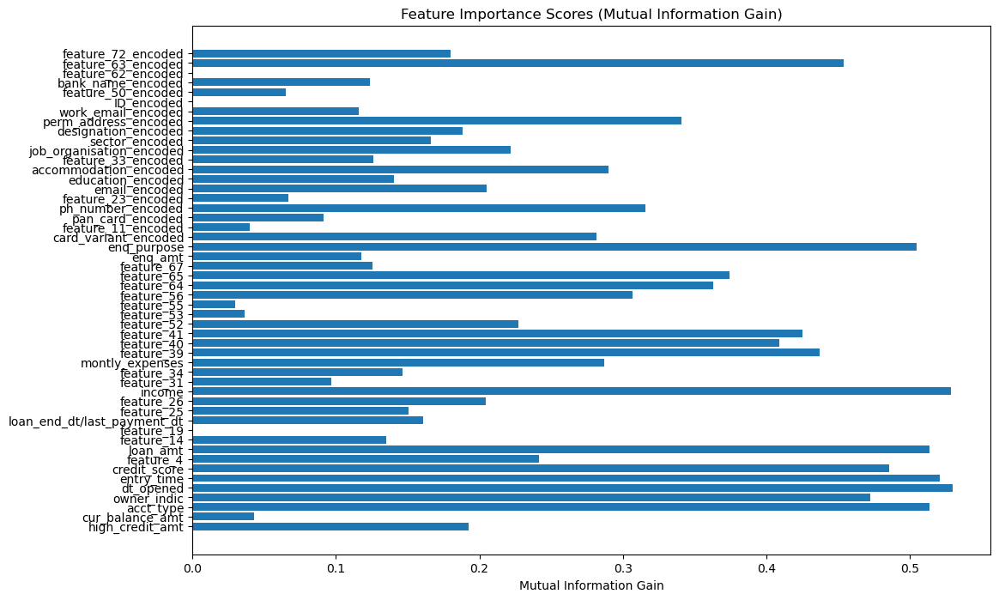

In [139]:
plt.figure(figsize=(12, 8))
plt.barh(range(len(selected_feature_names)), selector.scores_[selected_features_indices], align='center')
plt.yticks(range(len(selected_feature_names)), selected_feature_names)
plt.xlabel('Mutual Information Gain')
plt.title('Feature Importance Scores (Mutual Information Gain)')
plt.show()


# Insights :

### As we can see, the most important variables to predict the Credit Score for a Customers are the different Columns. This makes sense, since the  most commonn factor for score prediction is Card Varient type

### The feature importance also shows that nearly all binary variables have a low feature importance, meaning they are providing the model with little to no predictive information.

### As can be seen above, nearly all binary features have a mean below ten percent.

### That implies that most rows are equal to zero.

### Furthermore, it is visible that the binary variables with an average above ten percent have also a higher feature importance within our prediction model.

### So we are dropping few of the features.

# Selecting top k features based on mutual information gain


In [140]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import mutual_info_classif
from sklearn.model_selection import train_test_split

# Assuming x_train_scaled, x_test_scaled, y_train, y_test are already defined

num_features = 42  # Number of top features to select

# Initialize SelectKBest with mutual_info_classif as score function
selector = SelectKBest(score_func=mutual_info_classif, k=num_features)

# Fit the selector on the training data
selector.fit(x_train_scaled, y_train)

# Get the indices of the selected features
selected_features_indices = selector.get_support(indices=True)

# Get the names of the selected features
selected_feature_names = x_train_scaled.columns[selected_features_indices]

# Create feature matrices containing the selected features for both training and test sets
x_train_scaled = x_train_scaled[selected_feature_names]
x_test_scaled = x_test_scaled[selected_feature_names]

# Use the selected features in your machine learning pipeline
# ... (continue with your machine learning model training using x_train_selected and x_test_selected)


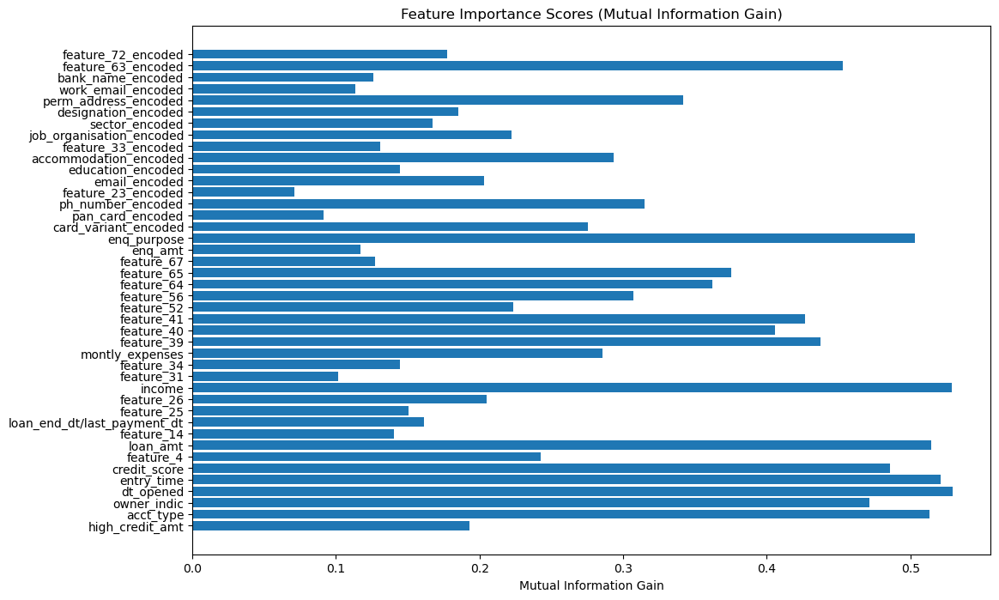

In [141]:
plt.figure(figsize=(12, 8))
plt.barh(range(len(selected_feature_names)), selector.scores_[selected_features_indices], align='center')
plt.yticks(range(len(selected_feature_names)), selected_feature_names)
plt.xlabel('Mutual Information Gain')
plt.title('Feature Importance Scores (Mutual Information Gain)')
plt.show()


In [142]:
x_train_scaled


,high_credit_amt,acct_type,owner_indic,dt_opened,entry_time,credit_score,feature_4,loan_amt,feature_14,loan_end_dt/last_payment_dt,feature_25,feature_26,income,feature_31,feature_34,montly_expenses,feature_39,feature_40,feature_41,feature_52,feature_56,feature_64,feature_65,feature_67,enq_amt,enq_purpose,card_variant_encoded,pan_card_encoded,ph_number_encoded,feature_23_encoded,email_encoded,education_encoded,accommodation_encoded,feature_33_encoded,job_organisation_encoded,sector_encoded,designation_encoded,perm_address_encoded,work_email_encoded,bank_name_encoded,feature_63_encoded,feature_72_encoded
0,0.001970,0.040157,0.016621,0.864865,0.827692,0.149139,0.753201,0.066421,11.398825,0.135101,0.693147,0.000000,0.140719,0.000000,0.000000,0.002331,8.203996,0.405465,0.909091,0.000000,0.662376,0.287682,0.008854,0.693147,0.000096,0.011094,0.405465,0.677632,1.441792,0.000000,0.240765,0.635989,1.543704,0.000000,3.903802,0.095310,0.949135,1.233866,0.291199,0.287682,0.791837,2.232027
1,0.002073,0.039093,0.022100,0.756757,0.670769,0.148494,2.124169,0.059343,11.398825,0.104374,0.000000,0.000000,0.140719,0.000000,0.000000,0.002331,8.262007,0.559616,0.090909,0.022773,0.662376,0.662376,0.003989,0.000000,0.000137,0.016376,0.405465,0.863701,0.288087,0.000000,0.240765,0.441833,0.825102,25.072958,2.760087,0.530628,0.464324,6.994469,0.291199,0.693147,0.600000,0.000000
2,0.000833,0.052842,0.038361,0.837838,0.827692,0.149065,0.000000,0.075005,11.398825,0.116511,0.000000,0.000000,0.000133,0.000000,0.000000,0.000000,8.250379,0.348307,0.909091,0.013151,0.217065,0.217065,0.015469,0.000000,0.000193,0.014178,0.510826,0.602696,0.240430,0.000000,0.240765,0.441833,0.825102,25.072958,3.903802,0.095310,0.817379,6.547450,0.291199,0.287682,0.767347,0.000000
3,0.000235,0.025152,0.005571,0.490347,0.556923,0.149247,2.124169,0.058553,11.398825,0.159651,0.000000,0.182322,0.000128,0.000000,0.000000,0.002796,8.215572,0.154151,0.545455,0.000000,0.217065,0.662376,0.061148,0.693147,0.000021,0.016156,0.405465,0.967480,2.294299,0.000000,0.240765,0.441833,1.543704,0.000000,2.760087,0.095310,0.527729,6.547450,0.168052,0.287682,0.924490,2.232027
4,0.002774,0.012108,0.016621,0.316602,0.310769,0.149139,2.124169,0.023998,11.398825,0.665272,0.000000,0.262364,0.019730,0.000000,0.000000,0.000000,8.262007,0.080043,1.000000,0.000000,0.287682,0.287682,0.000699,0.000000,0.000417,0.010211,0.693147,0.819304,1.415658,0.693147,0.648411,0.441833,1.543704,25.072958,2.760087,0.095310,0.689332,1.599422,0.291199,0.287682,0.546939,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
36615,0.000402,0.039414,0.019239,0.753390,0.780240,0.149276,0.000000,0.072268,5.762711,0.146277,0.693147,0.000000,0.246953,0.200481,0.000000,0.001152,8.221896,0.293042,0.678284,0.013685,0.109738,0.109738,0.008462,0.000000,0.000072,0.013022,0.600974,0.512898,0.819209,0.000000,0.240765,0.539989,2.523316,25.072958,3.325593,0.095310,0.671892,4.322208,0.447881,0.287682,0.420532,2.232027
36616,0.001410,0.019834,0.012754,0.991944,0.947367,0.149325,0.528691,0.091655,3.397704,0.117314,0.000000,0.000000,0.099098,0.405465,0.000000,0.000715,8.224758,0.177043,0.872377,0.000000,0.529639,0.529639,0.047532,0.486537,0.000196,0.016797,0.607396,0.153570,1.038395,0.000000,0.284286,0.441833,1.835702,7.473621,4.591419,0.472755,0.914360,2.817712,0.332332,0.287682,0.603985,0.665311
36617,0.000578,0.074239,0.044205,0.600072,0.461563,0.149185,1.887221,0.089368,1.271524,0.088109,0.000000,0.243730,0.405633,0.000000,0.405465,0.003918,0.000000,0.000000,0.000000,0.023607,0.404011,0.404011,0.013801,0.000000,0.000074,0.018185,0.510826,0.619979,1.532736,0.615827,0.624483,0.441833,1.543704,25.072958,2.760087,0.095310,0.464324,5.670066,0.593802,0.287682,0.956835,0.000000
36618,0.000159,0.012108,0.005571,0.696583,0.694572,0.148688,2.124169,0.023998,11.398825,0.162495,0.693147,0.000000,0.000054,0.000000,0.000000,0.001715,8.261

In [143]:
x_train_scaled.duplicated().sum()

521

# Model Selection :

# Linear Regression 

In [144]:
from sklearn.linear_model import LogisticRegression
LR = LogisticRegression()

In [145]:
LR.fit(x_train_scaled,y_train)

LogisticRegression()

In [146]:
y_p_test=LR.predict(x_test_scaled)

In [147]:
# Evaluate the model
from sklearn.metrics import confusion_matrix,accuracy_score,recall_score,precision_score,classification_report,f1_score

In [148]:
recall=recall_score(y_test,y_p_test)  # 56 percent result is correct results are predicted correctly by model.

recall

0.42424242424242425

In [149]:
f1score=f1_score(y_test,y_p_test)
f1score

0.08818897637795275

In [150]:
Confusion=confusion_matrix(y_test,y_p_test)
Confusion

array([[2959, 1623],
       [ 114,   84]], dtype=int64)

In [151]:
accuracy_score(y_test,y_p_test)

0.6366108786610879

In [152]:
precision_score(y_test,y_p_test)

0.0492091388400703

# ROC Curve :

In [153]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = LR.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


Gini Coefficient (from ROC AUC): 0.11332222266312186


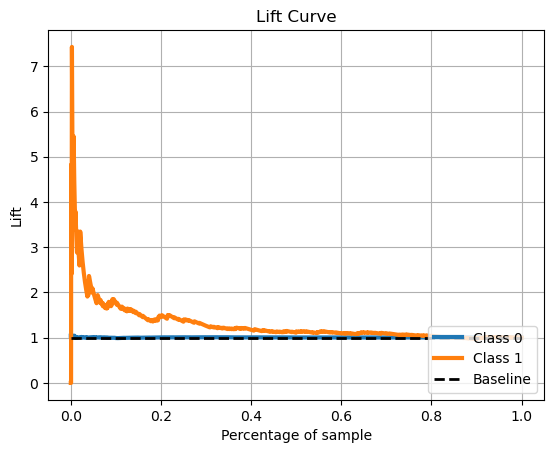

In [233]:
# Create a lift curve
!pip install scikit-plot
import scikitplot as skplt

skplt.metrics.plot_lift_curve(y_test, LR.predict_proba(x_test_scaled))
plt.show()


# Insights for using ROC Curve for all models:


### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Decision Tree :

In [156]:
from sklearn.tree import DecisionTreeClassifier
dt=DecisionTreeClassifier()

In [235]:
dt.fit(x_train_scaled,y_train)

DecisionTreeClassifier()

In [158]:
dt_p_test=dt.predict(x_test_scaled)

In [159]:
Confusion=confusion_matrix(y_test,dt_p_test)
Confusion

array([[4262,  320],
       [ 177,   21]], dtype=int64)

In [160]:
accuracy_score(y_test,dt_p_test)

0.8960251046025105

In [161]:
precision_score(y_test,dt_p_test)

0.06158357771260997

In [162]:
recall_score(y_test,dt_p_test)

0.10606060606060606

In [163]:
f1_score(y_test,dt_p_test)

0.07792207792207792

In [164]:
print(classification_report(y_test,dt_p_test))

              precision    recall  f1-score   support

           0       0.96      0.93      0.94      4582
           1       0.06      0.11      0.08       198

    accuracy                           0.90      4780
   macro avg       0.51      0.52      0.51      4780
weighted avg       0.92      0.90      0.91      4780



# ROC Curve :

In [165]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = dt.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


Gini Coefficient (from ROC AUC): 0.036222107588323116


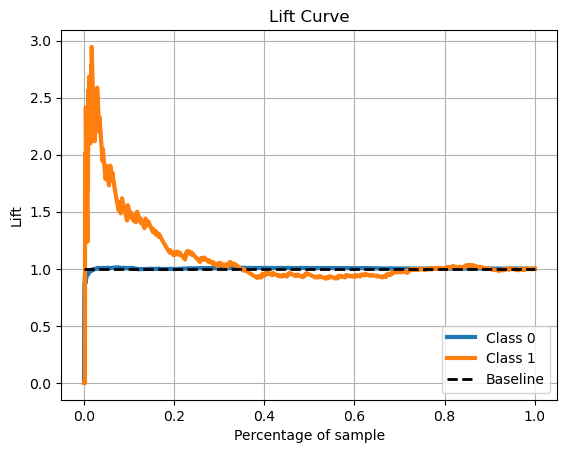

In [236]:
# Create a lift curve
skplt.metrics.plot_lift_curve(y_test, dt.predict_proba(x_test_scaled))
plt.show()


# Insights for using ROC Curve for all models:

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Hyperparameter tuning of Decision Tree

In [167]:
from sklearn.model_selection import RandomizedSearchCV
import numpy as np

# Define the hyperparameter grid
param_dist = {
    'max_depth': [None] + list(np.arange(1, 20)),
    'min_samples_split': np.arange(2, 11),
    'min_samples_leaf': np.arange(1, 11),
    'max_features': ['auto', 'sqrt', 'log2', None],
    'random_state': [42]
}

In [168]:
dt= DecisionTreeClassifier()

In [169]:
# Create a RandomizedSearchCV object
random_search = RandomizedSearchCV(dt, param_distributions=param_dist, n_iter=100, cv=5, n_jobs=-1, random_state=42)


In [170]:
# Fit the randomized search to your training data
random_search.fit(x_train_scaled, y_train)

# Get the best hyperparameters
best_params = random_search.best_params_

# Create a Decision Tree Classifier with the best hyperparameters
best_dt_classifier = DecisionTreeClassifier(**best_params)


In [171]:
# Fit the best classifier to your training data
best_dt_classifier.fit(x_train_scaled, y_train)


DecisionTreeClassifier(max_depth=19, min_samples_leaf=4, min_samples_split=5,
                       random_state=42)

In [172]:
# Make predictions on your test data using the best classifier
dt_p_test = best_dt_classifier.predict(x_test_scaled)


In [173]:
Confusion=confusion_matrix(y_test,dt_p_test)
Confusion

array([[4354,  228],
       [ 182,   16]], dtype=int64)

In [174]:
accuracy_score(y_test,dt_p_test)

0.9142259414225942

In [175]:
recall_score(y_test,dt_p_test)

0.08080808080808081

In [176]:
f1_score(y_test,dt_p_test)

0.07239819004524888

In [177]:
print(classification_report(y_test,dt_p_test))

              precision    recall  f1-score   support

           0       0.96      0.95      0.96      4582
           1       0.07      0.08      0.07       198

    accuracy                           0.91      4780
   macro avg       0.51      0.52      0.51      4780
weighted avg       0.92      0.91      0.92      4780



# ROC Curve :

In [178]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = best_dt_classifier.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


Gini Coefficient (from ROC AUC): 0.07002808530525684


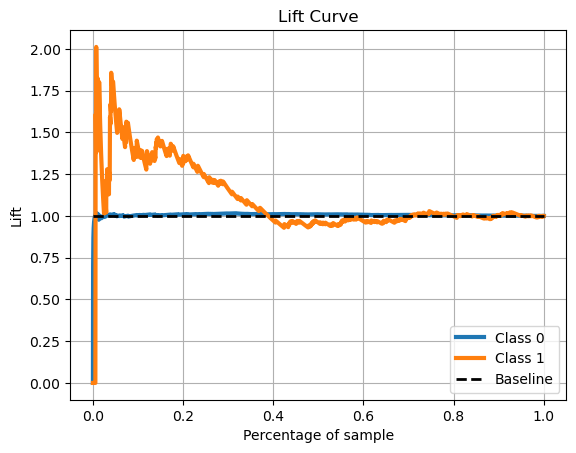

In [237]:
# Create a lift curve
skplt.metrics.plot_lift_curve(y_test, best_dt_classifier.predict_proba(x_test_scaled))
plt.show()

# Insights for using ROC Curve for all models:

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Random forest :

In [181]:
from sklearn.ensemble import RandomForestClassifier

rf=RandomForestClassifier()

In [184]:
rf.fit(x_train_scaled, y_train)

RandomForestClassifier()

In [185]:
rf_p_test=rf.predict(x_test_scaled)

In [186]:
Confusion=confusion_matrix(y_test,rf_p_test)
Confusion

array([[4582,    0],
       [ 198,    0]], dtype=int64)

In [187]:
accuracy_score(y_test,rf_p_test)

0.9585774058577405

In [188]:
precision_score(y_test,rf_p_test)

0.0

In [189]:
recall_score(y_test,rf_p_test)

0.0

In [190]:
f1_score(y_test,rf_p_test)

0.0

In [191]:
print(classification_report(y_test,rf_p_test))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4582
           1       0.00      0.00      0.00       198

    accuracy                           0.96      4780
   macro avg       0.48      0.50      0.49      4780
weighted avg       0.92      0.96      0.94      4780



# ROC Curve :

In [192]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = rf.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


Gini Coefficient (from ROC AUC): 0.11104056717326038


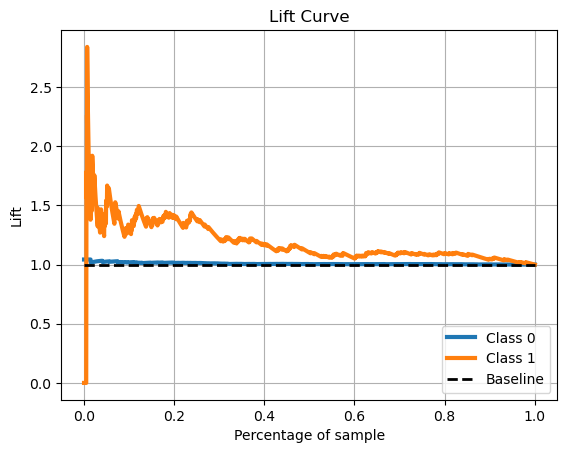

In [238]:
# Create a lift curve
skplt.metrics.plot_lift_curve(y_test, rf.predict_proba(x_test_scaled))
plt.show()

 # Insights for using ROC Curve for all models:

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Hyperparameter tuning of Random Forest :

In [194]:
param_grid = {
    'n_estimators': [100, 200],           # Number of trees in the forest
    'max_depth': [None, 10],              # Maximum depth of the trees
    'min_samples_split': [2, 5],         # Minimum number of samples required to split an internal node
    'min_samples_leaf': [1, 2],          # Minimum number of samples required to be in a leaf node
    'bootstrap': [True, False]
}

In [195]:
rf_clf = RandomForestClassifier()

In [196]:
rf_cv = RandomizedSearchCV(estimator=rf_clf, scoring='f1',param_distributions=param_grid, n_iter=100, cv=3, 
                               verbose=2, random_state=42, n_jobs=-1)

In [197]:
rf_cv.fit(x_train_scaled, y_train)
rf_best_params = rf_cv.best_params_##it will give you best parameters 
print(f"Best paramters: {rf_best_params})")##printing  best parameters

Fitting 3 folds for each of 32 candidates, totalling 96 fits
Best paramters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_depth': None, 'bootstrap': False})


In [198]:
rf_clf1= RandomForestClassifier()

In [199]:
rf_clf1=RandomForestClassifier(**rf_best_params)

In [200]:
rf_clf1.fit(x_train_scaled,y_train)

RandomForestClassifier(bootstrap=False, n_estimators=200)

In [201]:
rf1_p_test=rf_clf1.predict(x_test_scaled)

In [202]:
Confusion=confusion_matrix(y_test,rf1_p_test)
Confusion

array([[4582,    0],
       [ 198,    0]], dtype=int64)

In [203]:
accuracy_score(y_test,rf1_p_test)

0.9585774058577405

In [204]:
precision_score(y_test,rf1_p_test)

0.0

In [205]:
recall_score(y_test,rf1_p_test)

0.0

In [206]:
f1_score(y_test,rf1_p_test)

0.0

In [207]:
print(classification_report(y_test,rf1_p_test))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4582
           1       0.00      0.00      0.00       198

    accuracy                           0.96      4780
   macro avg       0.48      0.50      0.49      4780
weighted avg       0.92      0.96      0.94      4780



# ROC Curve :

In [208]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = rf_clf1.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


Gini Coefficient (from ROC AUC): 0.12013632615989667


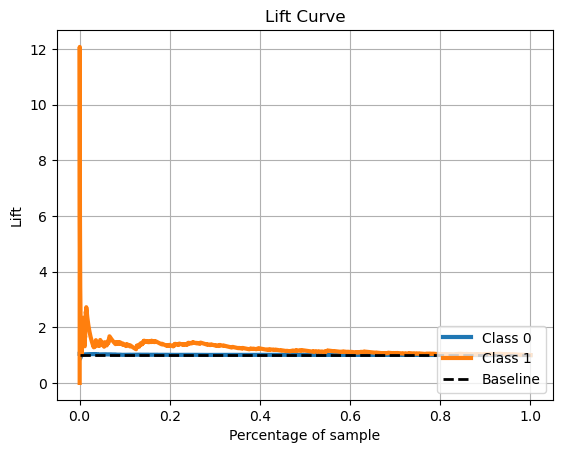

In [239]:
# Create a lift curve
skplt.metrics.plot_lift_curve(y_test, rf_clf1.predict_proba(x_test_scaled))
plt.show()

# Insights for using ROC Curve for all models:

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Gradient Boosting :

In [113]:
## importing the model library
from sklearn.ensemble import GradientBoostingClassifier

In [210]:
gb = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)

In [211]:
gb.fit(x_train_scaled, y_train)

GradientBoostingClassifier(random_state=42)

In [212]:
gb_p_test = gb.predict(x_test_scaled)

In [213]:
Confusion=confusion_matrix(y_test,gb_p_test)
Confusion

array([[4575,    7],
       [ 198,    0]], dtype=int64)

In [214]:
accuracy_score(y_test,gb_p_test)

0.9571129707112971

In [215]:
precision_score(y_test,gb_p_test)

0.0

In [216]:
recall_score(y_test,gb_p_test)

0.0

In [217]:
f1_score(y_test,gb_p_test)

0.0

In [218]:
print(classification_report(y_test,gb_p_test))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4582
           1       0.00      0.00      0.00       198

    accuracy                           0.96      4780
   macro avg       0.48      0.50      0.49      4780
weighted avg       0.92      0.96      0.94      4780



# ROC Curve :

In [219]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = gb.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


Gini Coefficient (from ROC AUC): 0.10177065284005482


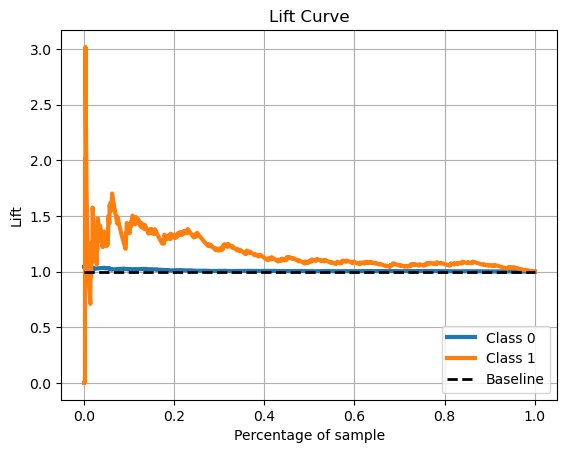

In [240]:
# Create a lift curve
skplt.metrics.plot_lift_curve(y_test, gb.predict_proba(x_test_scaled))
plt.show()

# Insights for using ROC Curve for all models:

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Light Gradient Boosting :

In [220]:
import lightgbm as lgb
from sklearn.model_selection import train_test_split
# Create an instance of the LGBMClassifier
clf = lgb.LGBMClassifier(
    boosting_type='gbdt',         # Gradient Boosting Decision Tree
    objective='binary',       # 'multiclass' for multiclass classification
    num_leaves=31,                # Maximum number of leaves in a tree
    learning_rate=0.05,           # Learning rate
    feature_fraction=0.9,         # Percentage of features used in each iteration
    random_state=42               # Seed for reproducibility
)


In [221]:
clf.fit(x_train_scaled, y_train)

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
[LightGBM] [Info] Number of positive: 18310, number of negative: 18310
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 10706
[LightGBM] [Info] Number of data points in the train set: 36620, number of used features: 42
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.500000 -> initscore=0.000000


LGBMClassifier(feature_fraction=0.9, learning_rate=0.05, objective='binary',
               random_state=42)

In [222]:
y_pred = clf.predict(x_test_scaled)

[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


In [223]:
Confusion=confusion_matrix(y_test,y_pred)
Confusion

array([[4581,    1],
       [ 198,    0]], dtype=int64)

In [224]:
accuracy_score(y_test,y_pred)

0.9583682008368201

In [225]:
precision_score(y_test,y_pred)

0.0

In [226]:
recall_score(y_test,y_pred)

0.0

In [227]:
f1_score(y_test,y_pred)

0.0

In [228]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.96      1.00      0.98      4582
           1       0.00      0.00      0.00       198

    accuracy                           0.96      4780
   macro avg       0.48      0.50      0.49      4780
weighted avg       0.92      0.96      0.94      4780



# ROC Curve :

In [229]:
from sklearn.metrics import roc_auc_score, roc_curve, auc

# Calculate predicted probabilities for the test set
y_pred_probs = clf.predict_proba(x_test_scaled)[:, 1]  # Assuming binary classification, extract probabilities of positive class

# Calculate ROC AUC score (equivalent to Gini coefficient for binary classification)
roc_auc = roc_auc_score(y_test, y_pred_probs)

# Calculate Gini coefficient from ROC AUC score
gini_from_auc = 2 * roc_auc - 1
print(f'Gini Coefficient (from ROC AUC): {gini_from_auc}')


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9
Gini Coefficient (from ROC AUC): 0.1622554660529345


[LightGBM] [Warning] feature_fraction is set=0.9, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9


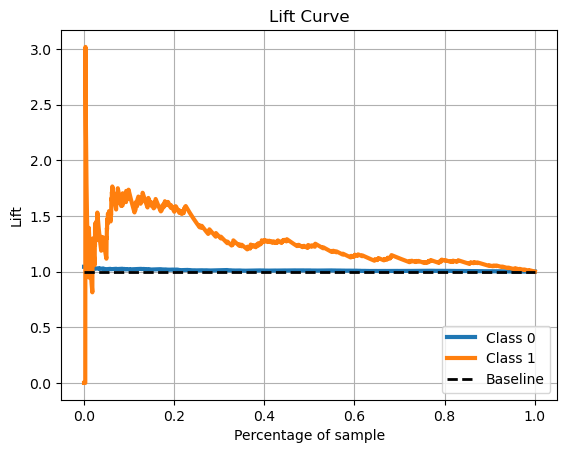

In [241]:
# Create a lift curve
skplt.metrics.plot_lift_curve(y_test, clf.predict_proba(x_test_scaled))
plt.show()

# Insights for using ROC Curve for all models:

### The Receiver Operating Characteristic (ROC) curve is a valuable tool in the field of machine learning and statistics, primarily used in binary and multiclass classification problems. Its importance lies in its ability to provide insights into the performance of classification models and their ability to discriminate between classes

# Model Comparison Report :

In [230]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, cross_validate
from sklearn.metrics import make_scorer, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier



# Create a dictionary to store model names and corresponding model objects
models = {
    'Logistic Regression': LogisticRegression(),
    'Decision Tree': DecisionTreeClassifier(max_depth=None, random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'GradientBoostingCl': GradientBoostingClassifier(random_state=42)
}

# Define evaluation metrics
scoring = {
    'Accuracy': make_scorer(accuracy_score),
    'Precision': make_scorer(precision_score),
    'Recall': make_scorer(recall_score),
    'F1 Score': make_scorer(f1_score),
}

# Perform cross-validation and compare models using cross_validate
results = {}
for model_name, model in models.items():
    cv_results = cross_validate(model, x_train_scaled, y_train, cv=5, scoring=scoring)
    results[model_name] = {
        metric: cv_results[f'test_{metric}'].mean() for metric in scoring
    }

# Print the results
for model, scores in results.items():
    print(f"Model: {model}")
    for metric, score in scores.items():
        print(f"{metric}: {score}")
    print("-------------------------")


Model: Logistic Regression
Accuracy: 0.6595849262697979
Precision: 0.6557239265106276
Recall: 0.6716002184598581
F1 Score: 0.6634820937334648
-------------------------
Model: Decision Tree
Accuracy: 0.941206990715456
Precision: 0.9341669974254648
Recall: 0.9511742217367558
F1 Score: 0.9403705714939065
-------------------------
Model: Random Forest
Accuracy: 0.9802020753686509
Precision: 0.9997814356422797
Recall: 0.9606226105953031
F1 Score: 0.9781206323648522
-------------------------
Model: GradientBoostingCl
Accuracy: 0.9628891316220646
Precision: 0.998859254043847
Recall: 0.9268705625341344
F1 Score: 0.9591896320753545
-------------------------


# Insights : 

### Code to demonstrates the use of several regression algorithms to build predictive models and calculate their Root Mean Squared Error (RMSE) on a given dataset.

In [231]:
# Display the comparison results
Models_df = pd.DataFrame(results).T
print(Models_df)

                     Accuracy  Precision    Recall  F1 Score
Logistic Regression  0.659585   0.655724  0.671600  0.663482
Decision Tree        0.941207   0.934167  0.951174  0.940371
Random Forest        0.980202   0.999781  0.960623  0.978121
GradientBoostingCl   0.962889   0.998859  0.926871  0.959190


# Insights :

### Evaluating Model Performance, Threshold SelectionComparing Models, Area Under the ROC Curve (AUC), Interpreting Model Biases, Visualizing Classifier Performance.



# Conclusion Report :

### This report will illustrate that whatever steps we have taken and whatever decision we have were based on the dataset we were provided. 